In [ ]:
!nvidia-smi -L

/bin/bash: line 1: nvidia-smi: command not found


# **0 - Install Required Libraries**



In [ ]:
!pip3 install -q -U keras-tuner==1.1.3
!pip3 install tensorflow-addons[tensorflow]
!pip3 install pickle5
!apt install --allow-change-held-packages libcudnn8=8.1.0.77-1+cuda11.2
# !pip install livelossplot
!pip install -q tensorflow==2.11.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.7/135.7 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 25.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.1/132.1 kB 2.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pickle5: filename=pickle5-0.0.11-cp310-cp310-linux_x86_64.whl size=255319 sha256=a18bbc947f0991502959c2bc6b112911da3758b4572f60e94cfbc9dd11a6257a
  Stored in directory: /root/.cache/pip/wheels/7d/14/ef/4aab19d27fa8e58772be5c71c16add0426acf9e1f64353235c
Successfully built pickle5
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
Package libcudnn8 is not available, but is referred to by another package.
This may mean that the package is missing, has been obsoleted, or
is only available from another source

E: Version '8.1.0.77-1+cuda11.2' for 'libcudnn8' was not 

# **1- Import Required Libraries**

In [ ]:
import os

init_seed = 1640

os.environ['PYTHONHASHSEED'] = str(init_seed)

# For working on GPUs from "TensorFlow Determinism"
# Had to set all batch norms' fuse parameter to False
# because of a runtime error saying that deterministic
# version of batch_norm is not defined
os.environ['TF_DETERMINISTIC_OPS'] = '1'

In [ ]:
import numpy as np
import tensorflow as tf
import random as python_random

# The below is necessary for starting Numpy generated random numbers
# in a well-defined initial state.
np.random.seed(init_seed)

# The below is necessary for starting core Python generated random numbers
# in a well-defined state.
python_random.seed(init_seed)

#  Below does not help with using batch norm, so will keep it commented because
#  mode is reproducible without it.
tf.config.experimental.enable_op_determinism()


from keras import backend as K

# # The below set_seed() will make random number generation
# # in the TensorFlow backend have a well-defined initial state.
# # For further details, see:
# # https://www.tensorflow.org/api_docs/python/tf/random/set_seed
tf.random.set_seed(init_seed)


In [ ]:
physical_devices = tf.config.list_physical_devices()

print("Phys:", physical_devices)
print("Num GPUs:", len(physical_devices))

Phys: [PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]
Num GPUs: 1


In [ ]:
import re
import sys
import json
import math
import warnings
import pprint
from collections import defaultdict
from collections import Counter
from itertools import chain

import cv2
from PIL import Image, ImageOps
import pickle5 as pickle

In [ ]:
import pandas as pd

from google.colab import files
import matplotlib
import plotly.express as px
# %matplotlib inline
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics
# from livelossplot import PlotLossesKeras

import keras_tuner as kt
# import tensorflow_addons as tfa
from tensorflow import keras
from keras.losses import Loss
from keras.layers import Concatenate
# from keras.utils.layer_utils import count_params
from keras.metrics import categorical_accuracy, AUC
from sklearn.metrics import (accuracy_score, f1_score,
                             precision_score, recall_score,
                             classification_report,
                             confusion_matrix
                            )

In [ ]:
%tensorflow_version 2.x

import tensorflow as tf
print(tf.__version__)
print(tf.test.gpu_device_name())
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.
2.11.0

Num GPUs Available:  0


In [ ]:
!pip3 install --upgrade tensorflow-gpu

  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


In [ ]:
!pip install tf-nightly-gpu

  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


# **3 - Connect to Google Drive**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
sys.path.append('/content/drive/MyDrive/joint_level_generation_translation/')

In [ ]:
%cd "drive/MyDrive/joint_level_generation_translation/"

/content/drive/MyDrive/joint_level_generation_translation


# **4 - Load Configs and Datasets**

In [ ]:
TEST_GAME = "megaman" #@param
CHANNELS = 3 #@param
IMG_WIDTH = 75 #@param
IMG_HEIGHT = 50 #@param
TUNE_FIRST = False

In [ ]:
from src.config.config_loader import load_config
config = load_config("src/config/config.yaml")

# retrieve list of games from config
# game_keys = list(config["datasets"].keys())
game_keys = ["smb", "zelda"]

In [ ]:
all_datasets = {}

for game_key in game_keys:
    data = dict()
    print(f"Loading {game_key}...")
    with open(f"./data/{game_key}/dataset.pickle", "rb") as fh:
        data = pickle.load(fh)
        all_datasets[game_key] = data

Loading smb...
Loading zelda...


# **5 - Data Analysis**

{1: '#', 2: '-', 3: 'D', 4: 'H', 5: 'M', 6: 'T', 7: 'B', 8: 'S', 9: 'O'}
smb
zelda
2 802239
8 5613
1 601567
4 8676
9 1532
3 47507
7 65257
6 1359


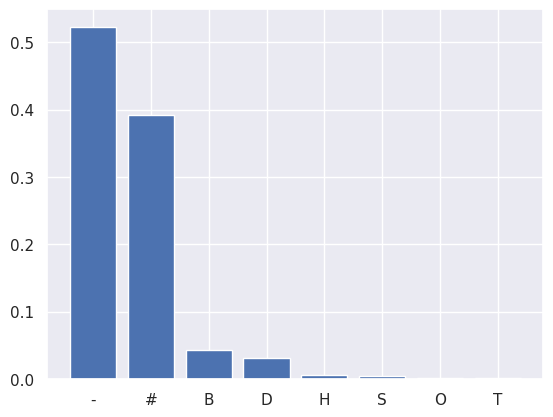

In [ ]:
# Data Analysis
with open('./data/id_to_idx.json') as json_file:
    enc_map: dict = json.load(json_file)["tiles"]
    reversed_enc_map = dict((v,k) for k,v in enc_map.items())
    print(reversed_enc_map)

frequencies = defaultdict(lambda: defaultdict(lambda:0))
cnt = 0
for game_key, data in all_datasets.items():
  print(game_key)
  for frame_name, frame_data in data.items():
    cnt += 1
    ans = Counter([x for sublist in frame_data for x in sublist])
    frequencies =  dict(Counter(frequencies)+Counter(ans))

freqs_01 = {}
sum_vals = 0
for value in frequencies.values():
  sum_vals += value

for key, value in frequencies.items():
  print(key, value)
  freqs_01[reversed_enc_map[key]] = value / sum_vals

srt = (dict(sorted(freqs_01.items(), reverse=True, key=lambda item: item[1])))
plt.bar(*zip(*srt.items()))
plt.show()

In [ ]:
print(srt)

{'-': 0.5230572127139365, '#': 0.3922197229013855, 'B': 0.04254735126324368, 'D': 0.03097440912795436, 'H': 0.005656723716381418, 'S': 0.0036596577017114916, 'O': 0.0009988590057049714, 'T': 0.0008860635696821516}


# **6- Load Images**

In [ ]:
""" load images """
images = dict()
for game_key in game_keys:
  # directory = f"./data/{game_key}/cropped_resized"
  directory = f"./data/{game_key}/cropped"
  print(f"Processing {game_key} data...")
  for file in os.listdir(directory):
      try:
        filename = os.fsdecode(file)
        if filename.endswith(".png"):
          img_bgr = cv2.imread(os.path.join(directory, filename))
          if CHANNELS == 3:
            img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
          else:
            img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

          img_rgb = cv2.resize(img_rgb, (IMG_WIDTH, IMG_HEIGHT))

          image = np.asarray(img_rgb)
          to_save = image.astype(np.uint8)
          images[f"{game_key}-{filename}"] = to_save
      except Exception as e:
        print(filename)
print(f"Number of images in the dataset: {len(images)}")

Processing smb data...
Processing zelda data...
Number of images in the dataset: 10235


In [ ]:
limit = 2000
valid_start_ends = {}
for game_key in all_datasets.keys():
  if game_key in game_keys:
  # if game_key != TEST_GAME:
    game_dataset = all_datasets[game_key]
    if len(game_dataset) < 2000:
      start = int(0.9* len(game_dataset))
      end = len(game_dataset)
    else:
      start = 2001
      end = min(len(game_dataset), 2200)

    valid_start_ends[game_key] = (start, end)

print(valid_start_ends)

{'smb': (1273, 1415), 'zelda': (2001, 2200)}


# **7 - Train/Validation/Test Splitting**

In [ ]:
# num_classes = len(frequencies)
num_classes =  9
print("Number of individual tile types in the dataset: ", num_classes)

Number of individual tile types in the dataset:  9


In [ ]:
def shuffle(X, y, names):
  a = list(zip(X, y, names))
  python_random.shuffle(a)
  X, y, names= zip(*a)
  return list(X), list(y), list(names)


In [ ]:
X_train = []
y_train = []
X_train_frame_names = []

X_valid = []
y_valid = []
X_valid_frame_names = []

X_test = []
y_test = []
X_test_frame_names = []

def convert_to_float_np_arr(list):
  return np.asarray(list, dtype=np.double)

def convert_to_int_np_arr(list):
  return np.asarray(list, dtype=np.uint8)

for game_key in game_keys:
  game_dataset = all_datasets[game_key]
  num_of_game_frames = len(game_dataset)
  if game_key in game_keys:
  # if game_key != TEST_GAME:
    start, end = valid_start_ends[game_key]

  counter = -1

  for image_name in sorted(game_dataset.keys()):
    if image_name in images.keys():
      counter += 1
      # if TEST_GAME in image_name:
      #   X_test.append(images[image_name])
      #   y_test.append(game_dataset[image_name])
      #   X_test_frame_names.append(image_name)
      # elif counter < start:
      num_part = int(re.findall(r'\d+', image_name)[0])
      if (num_part < 5122 and game_key == "kid_icarus") or (num_part < 2720 and game_key == "smb") or (num_part < 11041 and game_key == "zelda"):
        X_train.append(images[image_name])
        y_train.append(game_dataset[image_name])
        X_train_frame_names.append(image_name)
      if (num_part >= 5122 and game_key == "kid_icarus") or (num_part >= 2720 and game_key == "smb") or (num_part >= 11041 and game_key == "zelda"):
        X_valid.append(images[image_name])
        y_valid.append(game_dataset[image_name])
        X_valid_frame_names.append(image_name)

In [ ]:
def count_frames(data):
  frames_cnt = {game_key:0 for game_key in game_keys}
  for frame in data:
    for game_key in game_keys:
      if game_key in frame:
        frames_cnt[game_key] += 1

  print(frames_cnt)
  return frames_cnt

counts = count_frames(X_train_frame_names)
diff = counts["zelda"] - counts["smb"]

while diff > 0 :
  idx = python_random.choice(range(len(X_train)))
  name = X_train_frame_names[idx]
  if "zelda" in name:
    diff -= 1
    X_train.pop(idx)
    X_train_frame_names.pop(idx)
    y_train.pop(idx)

count_frames(X_train_frame_names)
count_frames(X_valid_frame_names)
# def count_frames(data):
#   frames_cnt = {game_key:0 for game_key in game_keys}
#   for frame in data:
#     for game_key in game_keys:
#       if game_key in frame:
#         frames_cnt[game_key] += 1

#   print(frames_cnt)
#   return frames_cnt

# counts = count_frames(X_train_frame_names)
# diff = counts["kid_icarus"] - counts["smb"]

# while diff > 0 :
#   idx = python_random.choice(range(len(X_train)))
#   name = X_train_frame_names[idx]
#   if "smb" in name:
#     diff -= 1
#     X_train.append(X_train[idx])
#     X_train_frame_names.append(name)
#     y_train.append(y_train[idx])

# count_frames(X_train_frame_names)
# count_frames(X_valid_frame_names)

{'smb': 1222, 'zelda': 5070}
{'smb': 1222, 'zelda': 1222}
{'smb': 193, 'zelda': 3740}


{'smb': 193, 'zelda': 3740}

In [ ]:
print("X_train length: ", len(X_train))
print("y_train length: ", len(y_train))
print("X_train_frame_length: ", len(X_train_frame_names))

X_train length:  2444
y_train length:  2444
X_train_frame_length:  2444


['#' '#' '#' '#' '#' '#' '#' '#' '#' '#' '#' '#' '#' '#' '#']
['#' '#' '#' '#' '#' '#' '#' 'D' 'D' '#' '#' '#' '#' '#' '#']
['#' '#' '-' '-' '-' '-' '-' '-' '-' '-' '-' '-' '-' '-' '#']
['#' '#' '-' '-' '-' '-' '-' '-' '-' '-' '-' '-' '-' '-' '#']
['#' 'D' '-' '-' '-' '-' '-' '-' '-' '-' '-' '-' '-' '-' '#']
['#' 'D' '-' '-' '-' '-' '-' '-' '-' '-' '-' '-' '-' '-' '#']
['#' 'D' '-' '-' '-' '-' '-' '-' '-' '-' '-' '-' '-' '-' '#']
['#' '#' '-' '-' '-' '-' '-' '-' '-' '-' '-' '-' '-' '-' '#']
['#' '#' '-' '-' '-' '-' '-' '-' '-' '-' '-' '-' '-' '-' '#']
['#' '#' '#' '#' '#' '#' '#' 'D' 'D' '#' '#' '#' '#' '#' '#']
Number of images in the dataset: 10235
Shape of X_train: (2444, 50, 75, 3)
Shape of y_train: (2444, 10, 15, 9)
Shape of X_valid: (3933, 50, 75, 3)
Shape of y_valid: (3933, 10, 15, 9)


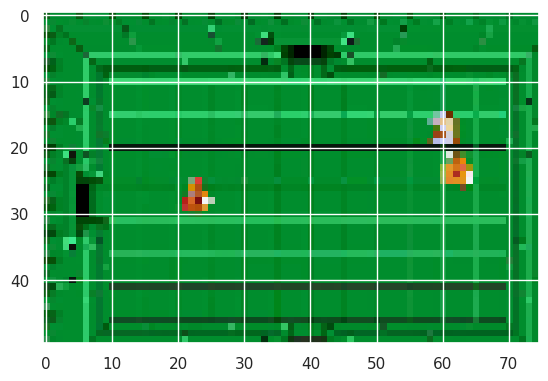

In [ ]:
# Shuffle Data
X_train, y_train, X_train_frame_names= shuffle(X_train, y_train, X_train_frame_names)

X_valid, y_valid, X_valid_frame_names = shuffle(X_valid, y_valid, X_valid_frame_names)

# X_test, y_test, X_test_frame_names = shuffle(X_test, y_test, X_test_frame_names)


plt.imshow(X_train[159])
for row in np.vectorize(reversed_enc_map.get)(y_train[159]):
  print(row)


DIVIDE_BY = 255

X_train = convert_to_float_np_arr(X_train) / DIVIDE_BY
y_train_numerical = convert_to_int_np_arr(y_train)
y_train = keras.utils.to_categorical(
    y_train_numerical-1, num_classes = num_classes
)

X_valid = convert_to_float_np_arr(X_valid) / DIVIDE_BY
y_valid_numerical = convert_to_int_np_arr(y_valid)
y_valid = keras.utils.to_categorical(
    y_valid_numerical-1, num_classes = num_classes
)

# X_test = convert_to_float_np_arr(X_test) / DIVIDE_BY
# y_test_numerical = convert_to_int_np_arr(y_test)
# y_test = keras.utils.to_categorical(
#     y_test_numerical-1, num_classes = num_classes
# )

print(f"Number of images in the dataset: {len(images)}")
print(f"Shape of X_train: {X_train.shape}")
print(f"Shape of y_train: {y_train.shape}")
print(f"Shape of X_valid: {X_valid.shape}")
print(f"Shape of y_valid: {y_valid.shape}")
# print(f"Shape of X_test: {X_test.shape}")
# print(f"Shape of y_test: {y_test.shape}")


## Compute Sample Weights

In [ ]:
weight_mapping = {}

for key, value in frequencies.items():
  weight_mapping[key]= max(round(np.log((1/(value/sum_vals)))), 1)

# weight_mapping = {
#     1: 1,
#     2: 1,
#     3: 1,
#     4: 1,
#     5: 1,
#     6: 1,
#     7: 8,
#     8: 1,
#     9: 8,
# }
print(weight_mapping)
sample_weight = np.ones(y_train_numerical.shape)
print(sample_weight.shape)

def custom_map(source, mapping):
  out = []
  for line in instance:
    out.append(list(map(mapping.get, line)))
  return out

for (index, instance) in enumerate(y_train_numerical):
    sample_weight[index] = custom_map(instance, weight_mapping)

print(" y_train shape: ", y_train.shape, " sample_weights shapes: ", sample_weight.shape)
print(" y_valid shape: ", y_valid.shape)

{2: 1, 8: 6, 1: 1, 4: 5, 9: 7, 3: 3, 7: 3, 6: 7}
(2444, 10, 15)
 y_train shape:  (2444, 10, 15, 9)  sample_weights shapes:  (2444, 10, 15)
 y_valid shape:  (3933, 10, 15, 9)


In [ ]:
# print(y_train[0].shape)
# print(y_train[0][0][0])
# x1 = np.tile(y_train[0][0][0], (10, 15, 5))
# x2 = np.tile(y_train[1][0][0], (10, 15, 5))
# x3 = np.tile(y_train[2][0][0], (10, 15, 5))
# print((x1==x2).all())
# print((x1==x3).all())
# print((x2==x3).all())

### Visualize Random Images From the Dataset

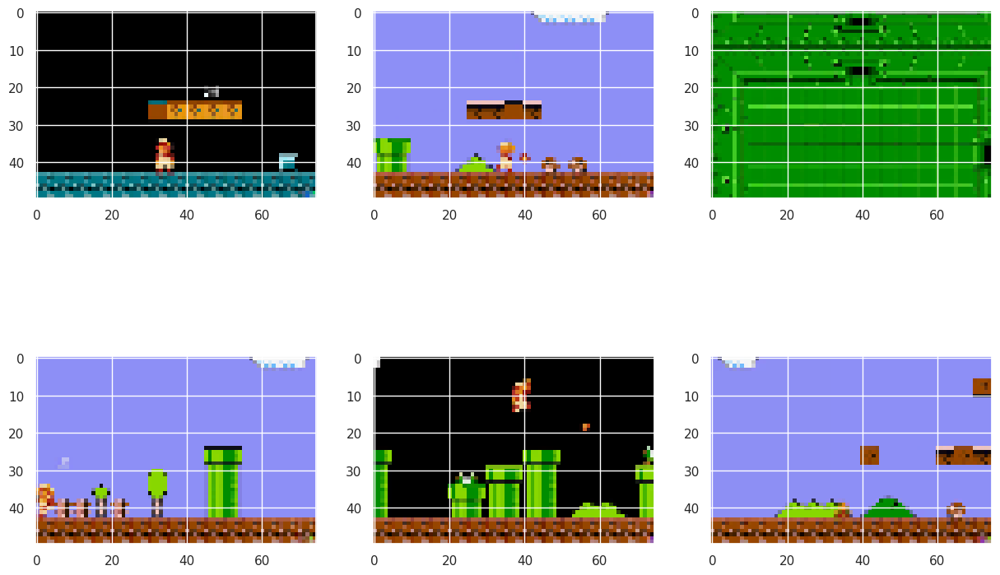

In [ ]:
from IPython.display import display # to display images

fig = plt.figure( figsize=(15, 10))
for i in range(6):
  sample_image = python_random.choice(list(X_train))
  ax1 = fig.add_subplot(2 , 3, i+1)
  ax1.imshow(sample_image, cmap='gray')

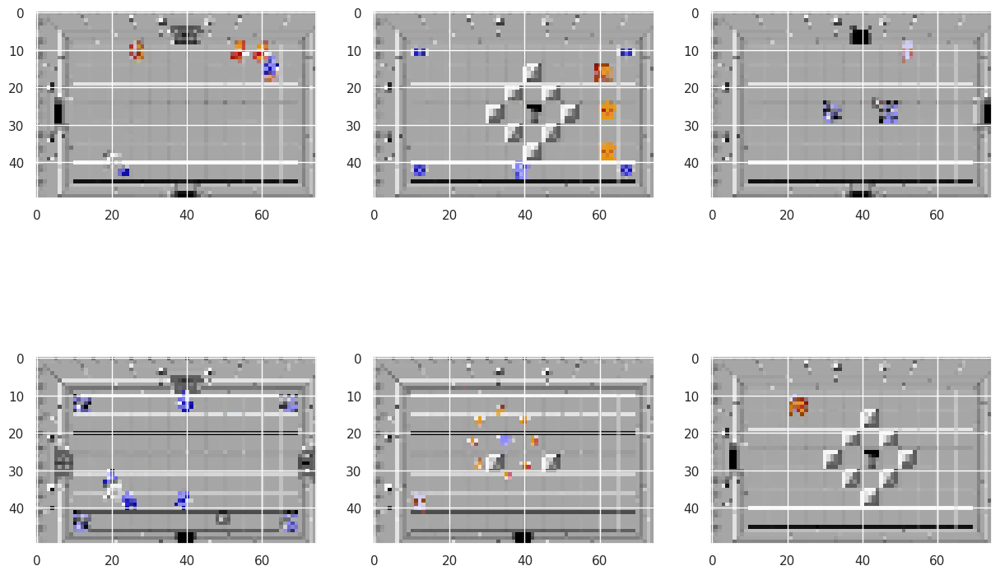

In [ ]:
# Display images from the validation set
fig = plt.figure( figsize=(15, 10))
for i in range(6):
  sample_image = python_random.choice(list(X_valid))
  ax1 = fig.add_subplot(2 , 3, i+1)
  ax1.imshow(sample_image)

## Model Definition

### Inception Module Defintion

In [ ]:
from keras.initializers import RandomNormal
init = RandomNormal(mean=0.0, stddev=0.02, seed=init_seed)

In [ ]:
def inception_module(layer_in, f1, f2, f3, f4, strides, transpose=False, random_norm_init=True):
  alpha=0.1
  if not transpose:
    layer = keras.layers.Conv2D
  else:
    layer = keras.layers.Conv2DTranspose

  if random_norm_init:
     kernel_initializer='glorot_uniform'
  else:
     kernel_initializer=init

  # 1x1 conv
  conv1 = layer(f1, (1,1), padding='same', strides=strides,
                              use_bias='True',
                              kernel_initializer=kernel_initializer
                              )(layer_in)
  # 3x3 conv
  conv3 = layer(f2, (3,3), padding='same', strides=strides,
                              use_bias='True',
                              kernel_initializer=kernel_initializer
                              )(layer_in)
  # 5x5 conv
  conv5 = layer(f3, (5,5), padding='same', strides=strides,
                              use_bias='True',
                              kernel_initializer=kernel_initializer
                              )(layer_in)

  # 7x7 conv
  conv7 = layer(f4, (7,7), padding='same', strides=strides,
                              use_bias='True',
                              kernel_initializer=kernel_initializer,
                              )(layer_in)
	# concatenate filters, assumes filters/channels last
  layer_out = Concatenate(axis=-1)([conv1, conv3, conv5, conv7])
  return layer_out

## Define Main Hyperparameters

In [ ]:
rows = X_train.shape[1] #@param
columns = X_train.shape[2] #@param
channel = CHANNELS #@param
latent_dim = 128 #@param
depth = 8 #@param
KERNEL = 5 #@param

# **Encoder**

In [ ]:
from keras import metrics, backend as K

def sampling(args):
    mean, logsigma = args
    batch = tf.shape(mean)[0]
    dim = tf.shape(mean)[1]
    epsilon = K.random_normal(shape=(batch, dim), mean=0., stddev=1.0)
    return mean + K.exp(logsigma / 2) * epsilon

In [ ]:
def encoder(kernel, filter, rows, columns, channel, shared_layer, latent_dim=latent_dim, alpha=0.2, dropout=0.2):
    input = keras.layers.Input(shape=(rows, columns, channel))

    x = inception_module(input, filter, filter, filter, filter, 1, False, False)
    x = keras.layers.BatchNormalization(fused=False)(x)
    x = keras.layers.LeakyReLU(alpha)(x)
    x = keras.layers.Dropout(dropout)(x)


    x = inception_module(x, filter*2, filter*2, filter*2, filter*2, 5, False, False)
    x = keras.layers.BatchNormalization(fused=False)(x)
    x = keras.layers.LeakyReLU(alpha)(x)
    x = keras.layers.Dropout(dropout)(x)

    x = inception_module(x, filter*2, filter*2, filter*2, filter*2, 5, False, False)
    x = keras.layers.BatchNormalization(fused=False)(x)
    x = keras.layers.LeakyReLU(alpha)(x)
    x = keras.layers.Dropout(dropout)(x)

    x = keras.layers.Flatten()(x)
    # mean = keras.layers.Dense(latent_dim, name="z_mean")(x)
    mean = shared_layer(x)
    logsigma = keras.layers.Dense(latent_dim, activation='relu', name="z_log_var")(x)
    latent = keras.layers.Lambda(sampling, output_shape=(latent_dim,))([mean, logsigma])
    model = keras.models.Model([input], [mean, logsigma, latent], name="encoder")
    print(model.summary())
    return model

In [ ]:
def get_shared_layer_shape(encoder) -> int:
  l_before_shared = encoder.get_layer("before_shared")
  # return K.int_shape(l_before_shared)
  shape = tf.shape(l_before_shared.output_shape[0])
  print(shape)
  return shape[0]


In [ ]:
# encoder
shared_layer = keras.layers.Dense(latent_dim, name="z_mean_test")
ENC = encoder(KERNEL, depth, rows, columns, channel, shared_layer)
ENC.summary()

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 50, 75, 3)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (None, 50, 75, 8)    32          ['input_1[0][0]']                
                                                                                                  
 conv2d_1 (Conv2D)              (None, 50, 75, 8)    224         ['input_1[0][0]']                
                                                                                                  
 conv2d_2 (Conv2D)              (None, 50, 75, 8)    608         ['input_1[0][0]']                
                                                                                            

# **Decoder/Generator**

In [ ]:
def dec_gen(kernel, filter, rows, columns, shared_layer, latent_dim=128,
            alpha=0.2, dropout=0.2, use_batch_norm=False, is_generator=False
            ,additional_layer_shape = 0):
    input = keras.layers.Input(shape=(latent_dim,))
    if is_generator:
      x = keras.layers.Dense(additional_layer_shape, activation="relu")(input)
      x = shared_layer(x)
      x = keras.layers.Dense(rows * columns * filter, activation='relu')(x)
    else:
      x = keras.layers.Dense(rows * columns * filter, activation='relu')(input)

    x = keras.layers.Reshape((rows, columns, filter))(x)
    x = keras.layers.LeakyReLU(alpha)(x)
    x = keras.layers.Dropout(dropout)(x)
    if use_batch_norm:
      x = keras.layers.BatchNormalization(fused=False)(x)

    x = inception_module(x, filter*2, filter*2, filter*2, filter*2, 1, True)
    x = keras.layers.LeakyReLU(alpha)(x)
    x = keras.layers.Dropout(dropout)(x)
    if use_batch_norm:
      x = keras.layers.BatchNormalization(fused=False)(x)

    x = inception_module(x, filter, filter, filter, filter, 1, True)
    x = keras.layers.LeakyReLU(alpha)(x)
    x = keras.layers.Dropout(dropout)(x)
    if use_batch_norm:
      x = keras.layers.BatchNormalization(fused=False)(x)

    x = keras.layers.Conv2DTranspose(filters=num_classes, kernel_size=kernel,
                                     strides=1, padding='same',
                                     activation="softmax",
                                     kernel_initializer=init
                                     )(x)


    model = keras.models.Model(input, x, name="decoder_generator")
    assert model.output_shape == (None, 10, 15, num_classes)
    print(model.summary())
    return model

In [ ]:
def generate_random_tensor(num_samples, dim):
  return tf.random.normal([num_samples, dim])

### Create instances of the decoder and the generator

In [ ]:
shared_layer = keras.layers.Dense(depth*10*15, kernel_initializer=init, name="shared_layer")
generator_t = dec_gen(kernel = KERNEL, filter = depth, rows=10, columns=15, shared_layer=shared_layer, is_generator=True)
noise = generate_random_tensor(1, latent_dim)
generated_trans = generator_t(noise, training=False)

generated_trans_numerical = (np.argmax(generated_trans, axis = -1) + 1).astype('int')
decoded_pred = list(np.vectorize(reversed_enc_map.get)(generated_trans_numerical))[0]
for idx, row in enumerate(decoded_pred):
  print("".join(row))

Model: "decoder_generator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 128)]        0           []                               
                                                                                                  
 dense (Dense)                  (None, 0)            0           ['input_2[0][0]']                
                                                                                                  
 shared_layer (Dense)           (None, 1200)         1200        ['dense[0][0]']                  
                                                                                                  
 dense_1 (Dense)                (None, 1200)         1441200     ['shared_layer[0][0]']           
                                                                                  

In [ ]:
# print(generated_trans[0].shape)
# print(y_train.shape)
x = np.random.rand(2, 2, 3, 2)
y = np.random.rand(2, 3, 2)
# print("x=", x)
# print("y=", y)
mean = np.square(np.subtract(x, y)).mean(axis=(1, 2, 3))
print(mean)
print(min(mean))


from sklearn.metrics import mean_squared_error
mse = tf.keras.losses.MeanSquaredError()
test = mse(x, y).numpy()
print(test)

[0.2297887  0.09103851]
0.09103851419983448
0.16041360523830037


# **Discriminator**

In [ ]:
class MinibatchStdev(keras.layers.Layer):
	# initialize the layer
	def __init__(self, **kwargs):
		super(MinibatchStdev, self).__init__(**kwargs)

	# perform the operation
	def call(self, inputs):
		# calculate the mean value for each pixel across channels
		mean = K.mean(inputs, axis=0, keepdims=True)
		# calculate the squared differences between pixel values and mean
		squ_diffs = K.square(inputs - mean)
		# calculate the average of the squared differences (variance)
		mean_sq_diff = K.mean(squ_diffs, axis=0, keepdims=True)
		# add a small value to avoid a blow-up when we calculate stdev
		mean_sq_diff += 1e-8
		# square root of the variance (stdev)
		stdev = K.sqrt(mean_sq_diff)
		# calculate the mean standard deviation across each pixel coord
		mean_pix = K.mean(stdev, keepdims=True)
		# scale this up to be the size of one input feature map for each sample
		shape = K.shape(inputs)
		output = K.tile(mean_pix, (shape[0], shape[1], shape[2], 1))
		# concatenate with the output
		combined = K.concatenate([inputs, output], axis=-1)
		return combined

	# define the output shape of the layer
	def compute_output_shape(self, input_shape):
		# create a copy of the input shape as a list
		input_shape = list(input_shape)
		# add one to the channel dimension (assume channels-last)
		input_shape[-1] += 1
		# convert list to a tuple
		return tuple(input_shape)

In [ ]:
def discriminator(kernel, filter, rows, columns, channel, alpha=0.2, dropout=0.3):
    input = keras.layers.Input(shape=(rows, columns, channel))
    # add gaussian noise to all inputs!!!
    x = keras.layers.GaussianNoise(stddev=0.1)(input)

    x = keras.layers.Conv2D(filters=filter, kernel_size=kernel, strides=2,
                            padding='same', kernel_initializer=init)(x)
    # x = keras.layers.LeakyReLU(alpha)(x)
    x = MinibatchStdev()(x)

    # x = keras.layers.Dropout(dropout)(x)

    x = keras.layers.Conv2D(filters=filter*2, kernel_size=kernel, strides=2,
                            padding='same', kernel_initializer=init)(x)
    x = keras.layers.LeakyReLU(alpha)(x)
    x = keras.layers.Dropout(dropout)(x)

    intermediate = keras.layers.Conv2D(filters=filter*4, kernel_size=kernel,
                                       strides=2, padding='same',
                                       kernel_initializer=init)(x)


    dec = keras.layers.LeakyReLU(alpha)(intermediate)
    dec = keras.layers.Flatten()(dec)
    output = keras.layers.Dense(1, kernel_initializer=init)(dec)


    model = keras.models.Model(input, [output, intermediate], name="discriminator")
    print(model.summary())
    return model

## **Test the discriminator with the random input**

In [ ]:
disc_t = discriminator(5, 32, 10, 15, num_classes)
out, _ = disc_t(generated_trans, training=False)
print (out)

Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 10, 15, 9)]       0         
                                                                 
 gaussian_noise (GaussianNoi  (None, 10, 15, 9)        0         
 se)                                                             
                                                                 
 conv2d_12 (Conv2D)          (None, 5, 8, 32)          7232      
                                                                 
 minibatch_stdev (MinibatchS  (None, 5, 8, 33)         0         
 tdev)                                                           
                                                                 
 conv2d_13 (Conv2D)          (None, 3, 4, 64)          52864     
                                                                 
 leaky_re_lu_6 (LeakyReLU)   (None, 3, 4, 64)        

In [ ]:
# Generator
GEN = dec_gen(KERNEL, depth, 10, 15, shared_layer, latent_dim, 0.1, True)
GEN.summary()

Model: "decoder_generator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 128)]        0           []                               
                                                                                                  
 dense_3 (Dense)                (None, 1200)         154800      ['input_4[0][0]']                
                                                                                                  
 reshape_1 (Reshape)            (None, 10, 15, 8)    0           ['dense_3[0][0]']                
                                                                                                  
 leaky_re_lu_8 (LeakyReLU)      (None, 10, 15, 8)    0           ['reshape_1[0][0]']              
                                                                                  

In [ ]:
# Decoder
DEC = dec_gen(KERNEL, depth, 10, 15, None, latent_dim, 0.1)

Model: "decoder_generator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 128)]        0           []                               
                                                                                                  
 dense_4 (Dense)                (None, 1200)         154800      ['input_5[0][0]']                
                                                                                                  
 reshape_2 (Reshape)            (None, 10, 15, 8)    0           ['dense_4[0][0]']                
                                                                                                  
 leaky_re_lu_11 (LeakyReLU)     (None, 10, 15, 8)    0           ['reshape_2[0][0]']              
                                                                                  

In [ ]:
# discriminator
DISC = discriminator(KERNEL, depth * 2, 10, 15, num_classes)
DISC.summary()

Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 10, 15, 9)]       0         
                                                                 
 gaussian_noise_1 (GaussianN  (None, 10, 15, 9)        0         
 oise)                                                           
                                                                 
 conv2d_15 (Conv2D)          (None, 5, 8, 16)          3616      
                                                                 
 minibatch_stdev_1 (Minibatc  (None, 5, 8, 17)         0         
 hStdev)                                                         
                                                                 
 conv2d_16 (Conv2D)          (None, 3, 4, 32)          13632     
                                                                 
 leaky_re_lu_14 (LeakyReLU)  (None, 3, 4, 32)        

# **Define Schedulers**

In [ ]:
def frange_cycle_cosine(start, stop, n_epoch, n_cycle=4, ratio=0.5):
    L = np.ones(n_epoch)
    period = n_epoch/n_cycle
    step = (stop-start)/(period*ratio) # step is in [0,1]

    # transform into [0, pi] for plots:

    for c in range(n_cycle):

        v , i = start , 0
        while v <= stop:
            L[int(i+c*period)] = 0.5-.5*math.cos(v*math.pi)
            v += step
            i += 1
    return L

# **Callbacks**

In [ ]:
mum_seeds = 100
seed_64 = generate_random_tensor(mum_seeds, 64)
seed_128 = generate_random_tensor(mum_seeds, 128)
seed_256 = generate_random_tensor(mum_seeds, 256)

def get_seed(latent_dim):
  if latent_dim == 64:
      return seed_64
  elif latent_dim == 128:
      return seed_128
  elif latent_dim == 256:
      return seed_256
  else:
    raise Exception()



class GenerateCallback(keras.callbacks.Callback):

    def on_epoch_end(self, epoch, logs=None):
        if epoch % 5 == 0:
          keys = list(logs.keys())
          seed = get_seed(self.model.latent_dim)
          generate_and_save_images(self.model.generator, seed, 8)

class AssignBettaCallback(keras.callbacks.Callback):
  def __init__(self, n_epoch):
    self.betta_range = frange_cycle_cosine(0.0, 1.0, n_epoch, 4)
    plt.plot(range(n_epoch), self.betta_range)

  def on_epoch_begin(self, epoch, logs=None):
    self.model.betta = self.betta_range[epoch]

class AlternateTrainingCallback(keras.callbacks.Callback):
    def __init__(self, start_ep, alternate_rate=2):
      self.start_ep = start_ep
      self.alternate_rate = alternate_rate

    def on_epoch_begin(self, epoch, logs=None):
      if epoch >= self.start_ep:
        if epoch % self.alternate_rate != 0:
          make_untrainable(self.model.discriminator)
          make_trainable(self.model.generator)
          print("num DISC trainable vars", count_params(self.model.discriminator.trainable_weights))
        else:
          make_untrainable(self.model.generator)
          make_trainable(self.model.discriminator)
          print(" Num GEN trainable vars", count_params(self.model.generator.trainable_weights))

class SaveModelCallback(keras.callbacks.Callback):
    def __init__(self):
      self.best_g_loss = float("Inf")
    def on_epoch_end(self, epoch, logs=None):
      # if abs(logs["g_loss"]) < self.best_g_loss:
      #   self.best_g_loss = abs(logs["g_loss"])
      #   self.model.generator.save_weights(f'./double_check/best/vae_wgan/{str(init_seed)}/generator_checkpoints.best')
      #   self.model.discriminator.save_weights(f'./double_check/best/vae_wgan/{str(init_seed)}/discriminator_checkpoints.best')
      #   self.model.encoder.save_weights(f'./double_check/best/vae_wgan/{str(init_seed)}/encoder_checkpoints.best')
      #   self.model.decoder.save_weights(f'./double_check/best/vae_wgan/{str(init_seed)}/decoder_checkpoints.best')
      if (epoch + 1) % 10 == 0:
        self.model.generator.save_weights(f'./double_check/periodic/vae_wgan_sz/{str(init_seed)}/generator_checkpoints.{epoch:03d}')
        self.model.discriminator.save_weights(f'./double_check/periodic/vae_wgan_sz/{str(init_seed)}/discriminator_checkpoints.{epoch:03d}')
        self.model.encoder.save_weights(f'./double_check/periodic/vae_wgan_sz/{str(init_seed)}/encoder_checkpoints.{epoch:03d}')
        self.model.decoder.save_weights(f'./double_check/periodic/vae_wgan_sz/{str(init_seed)}/decoder_checkpoints.{epoch:03d}')



## **Define the VAE_GAN model**

In [ ]:
class VAE_WGAN(keras.Model):
    def __init__(self, encoder, decoder,
                 generator, discriminator, latent_dim,
                discriminator_extra_steps=10, gp_weight=10.0):
        super(VAE_WGAN, self).__init__()
        self.encoder = encoder
        self.decoder = decoder
        self.generator = generator
        self.discriminator = discriminator

        self.latent_dim = latent_dim
        self.gen_loss_tracker = keras.metrics.Mean(name="generator_loss")
        self.disc_loss_tracker = keras.metrics.Mean(name="discriminator_loss")

        self.kl_loss_tracker = keras.metrics.Mean(name="kl_loss")
        self.normal_loss_tracker = keras.metrics.Mean(name="normal_loss")
        self.inner_loss_tracker =  keras.metrics.Mean(name="inner_loss")

        self.betta = 1

        self.d_steps = discriminator_extra_steps
        self.gp_weight = gp_weight

    @property
    def metrics(self):
        # List the `Metric` objects here so that `reset_states()`
        # can be called automatically at the start of each epoch
        # or at the start of `evaluate()`.
        return [
                self.gen_loss_tracker,
                self.disc_loss_tracker,
                self.normal_loss_tracker,
                self.kl_loss_tracker,
                ]

    def gradient_penalty(self, batch_size, real_images, fake_images):
        """Calculates the gradient penalty.

        This loss is calculated on an interpolated image
        and added to the discriminator loss.
        """
        # Get the interpolated image
        alpha = tf.random.normal([batch_size, 1, 1, 1], 0.0, 1.0)
        diff = fake_images - real_images
        interpolated = real_images + alpha * diff

        with tf.GradientTape() as gp_tape:
            gp_tape.watch(interpolated)
            # 1. Get the discriminator output for this interpolated image.
            pred, _ = self.discriminator(interpolated, training=True)

        # 2. Calculate the gradients w.r.t to this interpolated image.
        grads = gp_tape.gradient(pred, [interpolated])[0]
        # 3. Calculate the norm of the gradients.
        norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1, 2, 3]))
        gp = tf.reduce_mean((norm - 1.0) ** 2)
        return gp

    def compile(self, e_optimizer, dec_optimizer, g_optimizer, disc_optimizer,
                disc_loss, gen_loss, disl_loss_fn, categorical_loss_fn):
        super(VAE_WGAN, self).compile()
        self.e_optimizer = e_optimizer
        self.dec_optimizer = dec_optimizer
        self.g_optimizer = g_optimizer
        self.disc_optimizer = disc_optimizer

        self.disc_loss = disc_loss
        self.gen_loss = gen_loss
        self.disl_loss_fn = disl_loss_fn
        self.categorical_loss_fn = categorical_loss_fn

    def call(self, inputs, *args, **kwargs):
        _, _, temp = self.encoder(inputs)
        return self.decoder(temp)


    # Notice the use of `tf.function`
    # This annotation causes the function to be "compiled".
    @tf.function
    def train_step(self, data):
        if len(data) == 3:
            x, y, sample_weight = data
        else:
            sample_weight = None
            x, y = data

        ################## PASS 1: Reconstruction ##########################
        # generate a random noise batchve
        z_p =  generate_random_tensor(len(x), self.latent_dim)

        with tf.GradientTape() as enc_tape , tf.GradientTape() as dec_tape:
            # pass the real images to encoder -> decoder -> discriminator
            z_mean, z_log_var, z = self.encoder(x)
            x_tilde = self.decoder(z)
            dis_tilde, dis_inner_tilde = self.discriminator(x_tilde)
            dis_true, dis_inner_true = self.discriminator(y)

            # Calculate the normal reconstruction loss
            normal_loss = self.categorical_loss_fn(y, x_tilde, sample_weight)
            # Calculate the Prior(KL) loss
            kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
            kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))

            # Assign the VAE loss
            total_loss = normal_loss + kl_loss

        ENC_grad = enc_tape.gradient(total_loss, self.encoder.trainable_variables)
        DEC_grad = dec_tape.gradient(total_loss, self.decoder.trainable_variables)
        # DEC_grad = dec_tape.gradient(normal_loss, self.decoder.trainable_variables)
        self.e_optimizer.apply_gradients(zip(ENC_grad, self.encoder.trainable_variables))
        self.dec_optimizer.apply_gradients(zip(DEC_grad, self.decoder.trainable_variables))

        self.kl_loss_tracker.update_state(kl_loss)
        self.normal_loss_tracker.update_state(normal_loss)

        ################## PASS 2: Training Discriminator ##########################
        for i in range(self.d_steps):
          z_p =  generate_random_tensor(len(x), self.latent_dim)

          with tf.GradientTape() as tape:
              # pass randomly generated noise to generator
              generation = self.generator(z_p, training=True)
              # pass the generated samples to discriminator
              dis_p, dis_inner_p = self.discriminator(generation, training=True)

              # pass the true batch tile representation to the discriminator
              dis_true, dis_inner_true = self.discriminator(y, training=True)

              d_cost = self.disc_loss(real_d=dis_true, fake_d=dis_p)
              gp = self.gradient_penalty(len(x), y, generation)
              DISC_loss = d_cost + gp * self.gp_weight

          DISC_grad = tape.gradient(DISC_loss, self.discriminator.trainable_variables)
          self.disc_optimizer.apply_gradients(zip(DISC_grad, self.discriminator.trainable_variables))
          self.disc_loss_tracker.update_state(DISC_loss)


      ################## PASS 3: Generation ##########################
        z_p =  generate_random_tensor(len(x), self.latent_dim)

        with tf.GradientTape() as tape:
          generated_images = self.generator(z_p, training=True)
          # Get the discriminator logits for fake images
          gen_img_logits, _ = self.discriminator(generated_images, training=True)
          # Calculate the generator loss
          G_loss = self.gen_loss(gen_img_logits)

        G_grad = tape.gradient(G_loss, self.generator.trainable_variables)
        self.g_optimizer.apply_gradients(zip(G_grad, self.generator.trainable_variables))
        self.gen_loss_tracker.update_state(G_loss)

        return {
            "g_loss": self.gen_loss_tracker.result(),
            "disc_loss": self.disc_loss_tracker.result(),
            "kl_loss" : self.kl_loss_tracker.result(),
            "normal_loss": self.normal_loss_tracker.result(),
        }

## **Define the Loss Functions**

In [ ]:
# The from_logits=True attribute inform the loss function that the output values
# generated by the model are not normalized, a.k.a. logits. In other words, the
# softmax function has not been applied on them to produce a probability
# distribution.
cross_entropy = tf.keras.losses.BinaryCrossentropy(reduction='sum_over_batch_size')
cat_loss = tf.keras.losses.CategoricalCrossentropy(reduction="none")

mse = tf.keras.losses.MeanSquaredError()

# example of smoothing class = 1 to [0.9, 1]
def smooth_positive_labels(y):
  return y - 0.1 + (tf.random.uniform(tf.shape(y)) * 0.1)

# def discriminator_loss(real_output, fake_output):
#     real_loss = cross_entropy(smooth_positive_labels(tf.ones_like(real_output)), real_output)
#     fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
#     total_loss = real_loss + fake_loss
#     return total_loss


# Define the loss functions for the discriminator,
# which should be (fake_loss - real_loss).
# We will add the gradient penalty later to this loss function.
def discriminator_loss(real_d, fake_d):
    real_loss = tf.reduce_mean(real_d)
    fake_loss = tf.reduce_mean(fake_d)
    return fake_loss - real_loss


# Define the loss functions for the generator.
def generator_loss(fake_d):
    return -tf.reduce_mean(fake_d)


# def generator_loss(fake_output):
#     return cross_entropy(tf.ones_like(fake_output), fake_output)

def custom_categorical_loss(y_true, y_pred, sample_weight=None):
    reconstruction_loss = tf.reduce_mean(
        tf.reduce_sum(
            cat_loss(y_true, y_pred, sample_weight), axis=(1, 2)
        )
    )
    return reconstruction_loss

def disl_loss(dis_inner_true, dis_inner_tilde):
   print("dis_inner_true shape", dis_inner_true.shape, "dis_inner_tilde", dis_inner_tilde.shape)
   mse_loss = mse(dis_inner_tilde, dis_inner_true)
   print("mse_loss_shape", mse_loss.shape, mse)
   return mse_loss

## Define the Hyper GAN model

In [ ]:
class HyperGAN(kt.HyperModel):

  def __init__(self, dataset):
        super(HyperGAN, self).__init__()
        self.MSE = tf.keras.losses.MeanSquaredError()
        self.dataset = dataset

  def build(self, hp):

    hp_latent_dim = hp.Choice('latent_dim', [64, 128, 256])
    hp_drop_rate_gen = hp.Float('dropout rate gen', min_value = 0.01, max_value = 0.5)
    hp_drop_rate_disc = hp.Float('dropout rate disc', min_value = 0.01, max_value = 0.5)
    hp_dropout_vae = hp.Float('dropout rate vae', min_value = 0.01, max_value = 0.5)

    hp_alpha = hp.Float('alpha rate', min_value = 0, max_value = 0.3)
    # hp_batch_norm = hp.Boolean('batch normalization')
    hp_depth_vae = hp.Choice("depth_vae", [2, 4, 8])
    hp_depth_gen = hp.Choice("depth_gen", [2, 4, 8])

    # with hp.conditional_scope("depth_gen", [2, 4, 8]):
    #   if hp_depth_gen == 2:
    #     hp_depth_disc = hp.Choice("depth_disc", [2, 4,])
    #   elif hp_depth_gen == 4:
    #           hp_depth_disc = hp.Choice("depth_disc", [4, 8,])
    #   elif hp_depth_gen == 8:
    #     hp_depth_disc = hp.Choice("depth_disc", [8, 16,])

    hp_depth_disc = hp.Choice("depth_disc", [4, 8, 16])
    hp_learning_rate = hp.Choice('learning_rate', values=[3e-4, 3e-5, 1e-4])
    # hp_learning_rate_vae = hp.Choice('vae_learning_rate', values=[3e-4, 3e-5, 1e-4])

    shared_layer = keras.layers.Dense(hp_latent_dim, kernel_initializer=init, name="latent_shared_layer")
    self.encoder = encoder(kernel=KERNEL, filter=hp_depth_vae, rows=rows, columns=columns,
                           channel=channel, shared_layer=shared_layer,
                           latent_dim=hp_latent_dim, alpha=hp_alpha,
                           dropout=hp_dropout_vae
                           )

    self.decoder = dec_gen(kernel=KERNEL, filter=hp_depth_vae, rows=10, columns=15,
                           shared_layer=None, latent_dim=hp_latent_dim,
                           alpha=hp_alpha, dropout=hp_dropout_vae, is_generator=False,
                           )
    self.generator = dec_gen(kernel=KERNEL, filter=hp_depth_gen, rows=10, columns=15,
                             shared_layer=shared_layer, latent_dim=hp_latent_dim,
                             alpha=hp_alpha, dropout=hp_drop_rate_gen,
                             use_batch_norm=True, is_generator=True,
                             additional_layer_shape= 48 * hp_depth_vae)
    self.discriminator = discriminator(kernel=KERNEL, filter=hp_depth_disc, rows=10,
                                       columns=15, channel=num_classes,
                                       alpha=hp_alpha, dropout=hp_drop_rate_disc)



    vae_gan = VAE_WGAN(self.encoder, self.decoder, self.generator, self.discriminator, hp_latent_dim)
    vae_gan.compile(
          e_optimizer=keras.optimizers.Adam(),
          dec_optimizer=keras.optimizers.Adam(),
          g_optimizer=keras.optimizers.Adam(learning_rate=hp_learning_rate),
          disc_optimizer=keras.optimizers.Adam(learning_rate=hp_learning_rate),
          disc_loss=discriminator_loss,
          gen_loss=generator_loss,
          disl_loss_fn=disl_loss,
          categorical_loss_fn=custom_categorical_loss,
    )

    return vae_gan

  def fit(self, hp, model, *args, **kwargs):
        model.fit(
            *args,
            batch_size=hp.Choice("batch_size", [8, 16, 32]),
            **kwargs,
        )
        seed = get_seed(model.latent_dim)
        generated_images = self.generator(seed, training=False)
        mse_score = self.calculate_score(model, generated_images, kwargs["validation_data"])
        # Return a single float to minimize.
        return mse_score


  def calculate_score(self, model, generated_images, validation_data):

    generated_trans_numerical = (np.argmax(generated_images, axis = -1)).astype(dtype=np.double)
    generated_trans_categorical = keras.utils.to_categorical(
        generated_trans_numerical, num_classes = num_classes
    )
    total_MSE  = 0
    cnt = 0
    for item in generated_trans_categorical:
      cnt+=1

      min_MSE = float('inf')
      replicated = np.tile(item[0][0], (10, 15)) .reshape((10, 15, num_classes))
      all_values_are_same = (replicated==item).all()

      if not all_values_are_same:
        mse_s = np.square(np.subtract(self.dataset, item)).mean(axis=(1, 2, 3))
        min_MSE = min(mse_s)
        total_MSE += min_MSE
      else:
        return float('inf')

    total_MSE /= len(generated_images)

    # x_valid, y_valid = validation_data
    # _, _, temp = model.encoder(x_valid)
    # out = model.decoder(temp)
    # metric = tfa.metrics.F1Score(num_classes=num_classes)
    # metric.update_state(y_valid.reshape(y_valid.shape[0], y_valid.shape[1]*y_valid.shape[2], y_valid.shape[3]),
    #                     out.reshape(y_valid.shape[0], y_valid.shape[1]*y_valid.shape[2], y_valid.shape[3]))
    # valid_macro_f1 = metric.result().numpy()
    # print("**********************************")
    # print("valid macro f1_score:", valid_macro_f1)
    # print("Total Score:", total_MSE)
    # print("**********************************")
    return total_MSE
    # return total_MSE + (1 - valid_macro_f1)/20

In [ ]:
def generate_and_save_images(generator, test_input, num_samples=4):
  # Notice `training` is set to False.
  # This is so all layers run in inference mode (batchnorm).
  to_return = []
  predictions = generator(test_input, training=False)
  to_print = [ []*1 for i in range(10)]
  print("Random generated samples:", flush=True)
  for i in range(num_samples):
      generated_trans_numerical = (np.argmax(predictions[i], axis = -1) + 1).astype('int')
      decoded_pred = list(np.vectorize(reversed_enc_map.get)(generated_trans_numerical))
      to_return.append(decoded_pred)
      for idx, row in enumerate(decoded_pred):
        to_print[idx] +=  "".join(row) + "        "
  for line in to_print:
    print("".join(line))
  print("-----------------------------------------------------------")
  return to_return


In [ ]:
def make_untrainable(model):
  for l in model.layers:
    l.trainable = False

def make_trainable(model):
    for l in model.layers:
      l.trainable = True

In [ ]:
def plot_accuracies(history):
  plt.plot(history.history['categorical_accuracy'])
  plt.plot(history.history['val_categorical_accuracy'])
  plt.title('model accuracy per epoch')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper left')
  plt.show()


def plot_losses(history, key):
  plt.plot(history[key])
  plt.title(f'model {key} per epoch')
  plt.ylabel(key)
  plt.xlabel('epoch')
  plt.show()

In [ ]:
gen_callback_obj = GenerateCallback()

In [ ]:
# n = X_train.shape[0]  # for 2 random indices
# index = np.random.choice(X_train.shape[0], n, replace=False)
# # Then you just need to index your arrays with the result:

# x_random = X_train[index]
# y_random = y_train[index]
# sample_weigh_random = sample_weight[index]

In [ ]:
trials = 10

if TUNE_FIRST:
  tuner = kt.BayesianOptimization(
      hypermodel=HyperGAN(dataset=y_train),
      # No objective to specify.
      # Objective is the return value of `HyperModel.fit()`.
      seed = init_seed,
      max_trials=trials,
      overwrite=True,
      directory="my_dir",
      project_name="tune_vae_gan",
  )

  tuner.search(
      x = X_train, y = y_train, epochs=50, validation_data=(X_valid, y_valid),
      sample_weight=sample_weight, callbacks=[
                                              gen_callback_obj,
                                              keras.callbacks.TensorBoard("/tmp/tb_logs"),
                                              ]
      )
else:
  tuner = kt.BayesianOptimization(
    hypermodel=HyperGAN(dataset=y_train),
    # No objective to specify.
    # Objective is the return value of `HyperModel.fit()`.
    seed = init_seed,
    max_trials=trials,
    directory="my_dir",
    project_name="tune_vae_gan",
    overwrite=False
  )
  # Return all trials from the oracle
  # trials = tuner.oracle.trials

  # # Print out the ID and the score of all trials
  # for trial_id, trial in trials.items():
  #     print(trial_id, trial.score)

  # # Return best trial
  # best_trials = tuner.oracle.get_best_trials(num_trials=1)
  # for trial in best_trials:
  #     trial.summary()
  #     model = tuner.load_model(trial)

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 50, 75, 3)]  0           []                               
                                                                                                  
 conv2d_18 (Conv2D)             (None, 50, 75, 2)    8           ['input_7[0][0]']                
                                                                                                  
 conv2d_19 (Conv2D)             (None, 50, 75, 2)    56          ['input_7[0][0]']                
                                                                                                  
 conv2d_20 (Conv2D)             (None, 50, 75, 2)    152         ['input_7[0][0]']                
                                                                                            

In [ ]:
tuner.results_summary()

Results summary
Results in my_dir/tune_vae_gan
Showing 10 best trials
Trial summary
Hyperparameters:
latent_dim: 128
dropout rate gen: 0.4481694218774021
dropout rate disc: 0.057070402260636824
dropout rate vae: 0.24261279625229554
alpha rate: 0.13174393617129532
depth_vae: 2
depth_gen: 4
depth_disc: 8
learning_rate: 3e-05
batch_size: 16
Score: 0.024503703782102093
Trial summary
Hyperparameters:
latent_dim: 128
dropout rate gen: 0.2536345467356841
dropout rate disc: 0.13344484386446226
dropout rate vae: 0.17400613402693793
alpha rate: 0.1336099104493771
depth_vae: 8
depth_gen: 8
depth_disc: 8
learning_rate: 0.0001
batch_size: 16
Score: 0.029822222243528814
Trial summary
Hyperparameters:
latent_dim: 128
dropout rate gen: 0.45518983556148723
dropout rate disc: 0.2713515588192714
dropout rate vae: 0.08285366031925394
alpha rate: 0.007840551791203031
depth_vae: 2
depth_gen: 8
depth_disc: 16
learning_rate: 0.0003
batch_size: 8
Score: 0.030488888879772275
Trial summary
Hyperparameters:
laten

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /tmp/tb_logs

<IPython.core.display.Javascript object>

# **Retrain the Model With Best Hyperparameter**

In [ ]:
best_hps=tuner.get_best_hyperparameters(num_trials=1)[0]
pp = pprint.PrettyPrinter(depth=4)
pp.pprint(best_hps.values)
hp_batch_size = best_hps.values['batch_size']

{'alpha rate': 0.13174393617129532,
 'batch_size': 16,
 'depth_disc': 8,
 'depth_gen': 4,
 'depth_vae': 2,
 'dropout rate disc': 0.057070402260636824,
 'dropout rate gen': 0.4481694218774021,
 'dropout rate vae': 0.24261279625229554,
 'latent_dim': 128,
 'learning_rate': 3e-05}


In [ ]:
best_hps.values['batch_size'] = 8
best_hps.values['alpha rate'] =  0.14732279576819815
best_hps.values['batch_size'] = 8
best_hps.values['depth_disc'] = 8
best_hps.values['depth_gen'] = 2
best_hps.values['depth_vae'] = 2
best_hps.values['dropout rate disc'] =  0.46847727119876675
best_hps.values['dropout rate gen'] = 0.24003871439556243
best_hps.values['latent_dim'] =  128
best_hps.values['learning_rate'] = 0.0001
hp_batch_size = best_hps.values['batch_size']
pp.pprint(best_hps.values)

{'alpha rate': 0.14732279576819815,
 'batch_size': 8,
 'depth_disc': 8,
 'depth_gen': 2,
 'depth_vae': 2,
 'dropout rate disc': 0.46847727119876675,
 'dropout rate gen': 0.24003871439556243,
 'dropout rate vae': 0.24261279625229554,
 'latent_dim': 128,
 'learning_rate': 0.0001}


In [ ]:
print(best_hps.values)

{'latent_dim': 128, 'dropout rate gen': 0.24003871439556243, 'dropout rate disc': 0.46847727119876675, 'dropout rate vae': 0.24261279625229554, 'alpha rate': 0.14732279576819815, 'depth_vae': 2, 'depth_gen': 2, 'depth_disc': 8, 'learning_rate': 0.0001, 'batch_size': 8}


Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_11 (InputLayer)          [(None, 50, 75, 3)]  0           []                               
                                                                                                  
 conv2d_33 (Conv2D)             (None, 50, 75, 2)    8           ['input_11[0][0]']               
                                                                                                  
 conv2d_34 (Conv2D)             (None, 50, 75, 2)    56          ['input_11[0][0]']               
                                                                                                  
 conv2d_35 (Conv2D)             (None, 50, 75, 2)    152         ['input_11[0][0]']               
                                                                                            

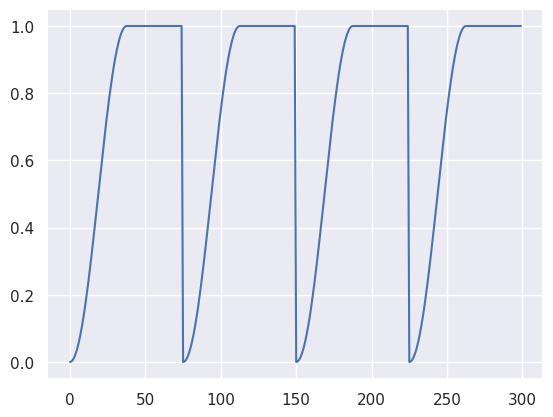

In [ ]:
n_epochs = 300
model = tuner.hypermodel.build(best_hps)
alt_callback_obj = AlternateTrainingCallback(100, 2)
assign_betta_callback_obj = AssignBettaCallback(n_epochs)
sv_model = SaveModelCallback()
# early_stopping = keras.callbacks.EarlyStopping(monitor='g_loss', patience=30, verbose=1, min_delta=0.1, mode="max", start_from_epoch=100)

In [ ]:
# history = model.fit(X_train, y_train,
#                       epochs=n_epochs,
#                       batch_size=hp_batch_size,
#                       sample_weight=sample_weight,
#                       callbacks=[gen_callback_obj,
#                                 #alt_callback_obj,
#                                 assign_betta_callback_obj,
#                                 keras.callbacks.TensorBoard("/tmp/tb_logs"),
#                                 sv_model,
#                                 #PlotLossesKeras(),
#                                 # early_stopping,
#                                 ]
# )

In [ ]:
model.encoder.load_weights(f'./double_check/periodic/vae_wgan/{str(init_seed)}/encoder_checkpoints.299')
model.decoder.load_weights(f'./double_check/periodic/vae_wgan/{str(init_seed)}/decoder_checkpoints.299')
model.generator.load_weights(f'./double_check/periodic/vae_wgan/{str(init_seed)}/generator_checkpoints.299')
model.discriminator.load_weights(f'./double_check/periodic/vae_wgan/{str(init_seed)}/discriminator_checkpoints.299')

In [ ]:
# for key in history.history.keys():
#   plot_losses(history.history,  key)

In [ ]:
# plt.plot(range(len(history.history["g_loss"])), history.history["g_loss"], 'r') # plotting t, a separately

# plt.plot(range(len(history.history["g_loss"])), history.history["disc_loss"], 'b') # plotting t, b separately
# # plt.savefig(f"g_d_losses_vae_wgan_disl_{init_seed}.png")
# # files.download(f"g_d_losses_vae_wgan_disl_{init_seed}.png")
# plt.show()

# **Visualize a few generations with tiles from the general tile set**

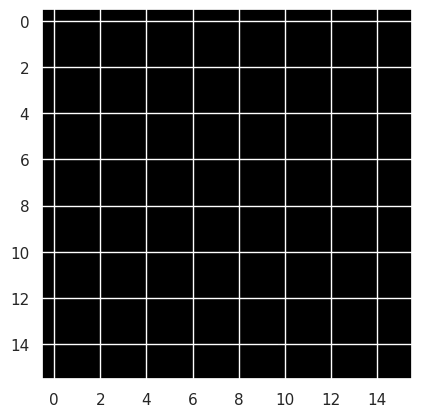

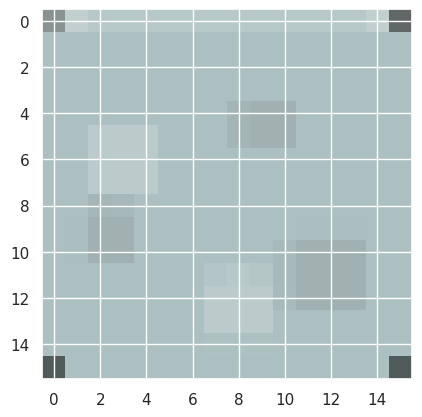

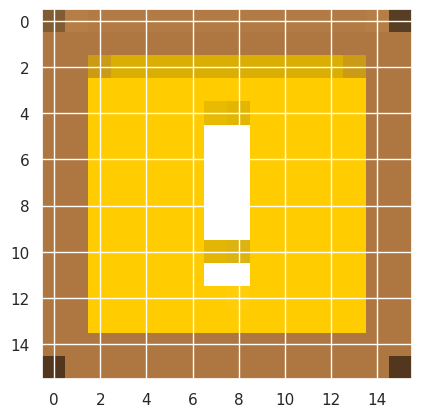

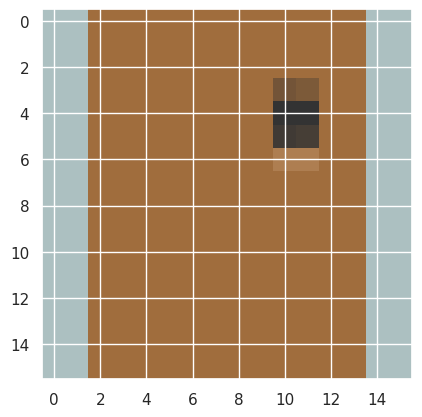

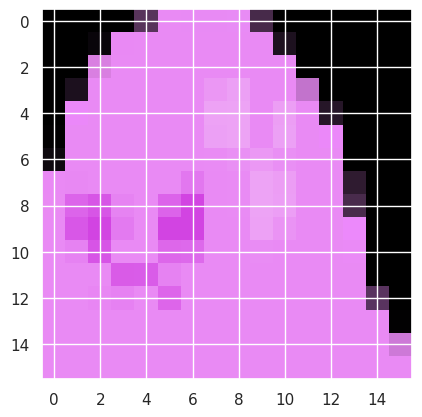

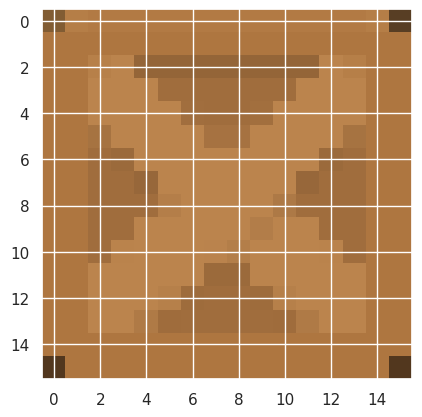

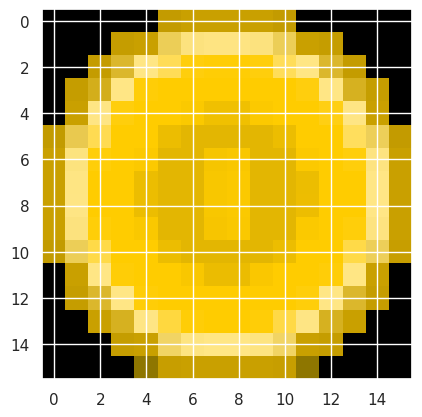

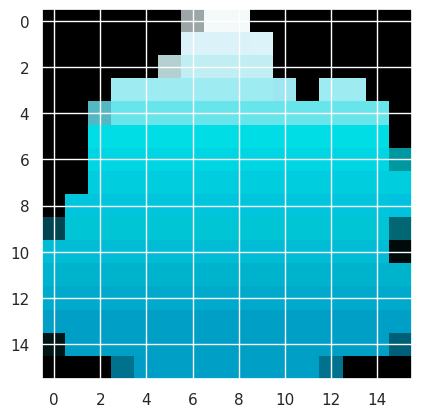

In [ ]:
all_datasets = {}
tiles = dict()
for key in srt.keys():
  img_obj = cv2.imread(f"./data/general_tile_set/{key}.png")
  img_obj = cv2.cvtColor(img_obj, cv2.COLOR_BGR2RGB)
  img_obj = cv2.resize(img_obj, (16, 16))
  tiles[key] = img_obj
  plt.imshow(img_obj)
  plt.show()

Random generated samples:
###############        ---------------        ---------------        #--############        ---------------        ###############        ---------------        ---------------        ---------------        ---------------        ###############        ###############        ###############        ---------------        ---------------        ---------------        ---------------        ###############        ---------------        ###############        ---------------        ###############        ---------------        ---------------        ###############        ###############        ###############        ------------#-#        ---------------        ###############        ###############        ###############        ###############        ###############        --#----###-----        ---------------        ###############        ---------------        ###############        ---------------        ---------------        ---------------        --------

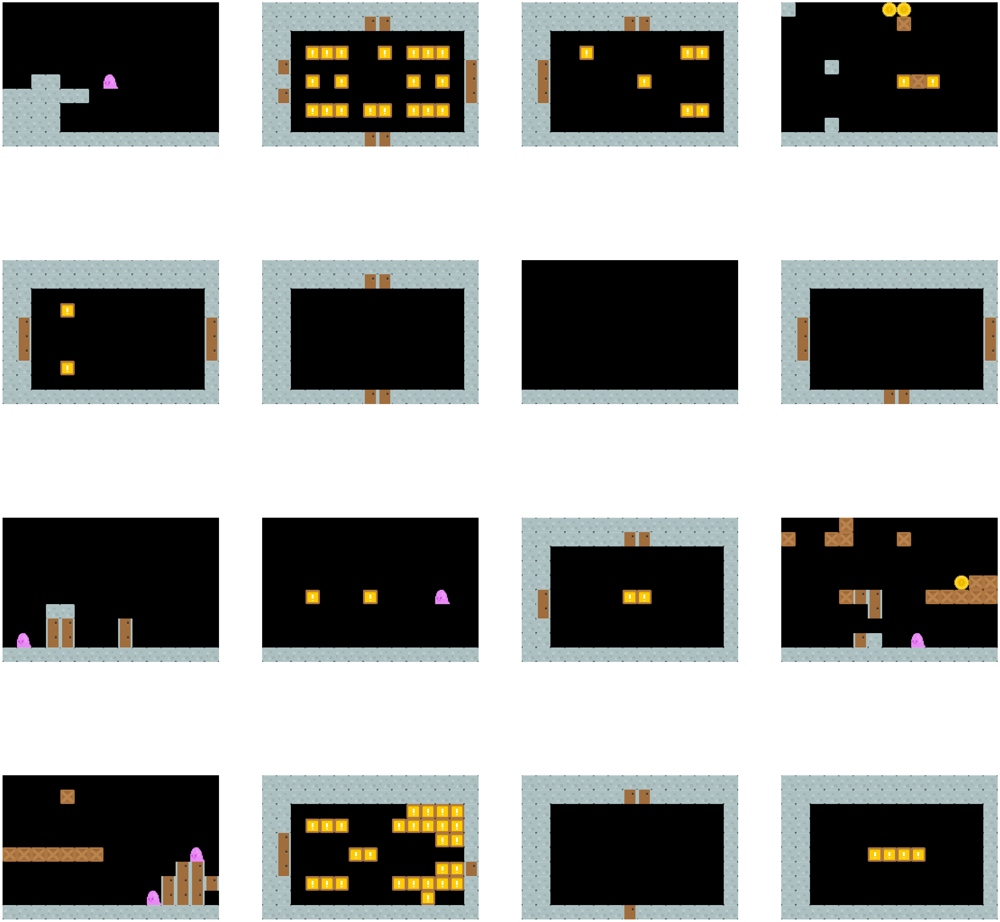

In [ ]:
num_seeds  = len(X_train)
a = generate_and_save_images(model.generator, generate_random_tensor(num_seeds, model.latent_dim), num_seeds)
f, axarr = plt.subplots(4, 4, figsize=(50, 50))


# visualize 16 first examples
for j in range(16):
  i = python_random.randint(0, len(a))
  img_rows = []
  for row in a[i]:
    img_rows.append(np.hstack([tiles[x] for x in row]))

  whole = np.vstack([x for x in img_rows])
  cnv = np.base_repr(j, base=4)
  first = int(0 if len(cnv) == 1 else cnv[0])
  second = int(cnv[0] if len(cnv) == 1 else cnv[1])
  axarr[first, second].grid(None)
  axarr[first, second].axis("off")
  axarr[first, second].imshow(whole)




In [ ]:
# from datetime import datetime

# date = datetime.today().strftime('%Y-%m-%d %H:%M:%S')
# file_name = f'double_check/generations/{str(init_seed)}/vae_wgan_disl_ks_{date}_{init_seed}.pkl'

# with open(file_name, 'wb') as f:
#   pickle.dump(a, f)

# print(f"Samples saved on {file_name}")

In [ ]:
# def dump_accuracies(predictions, names, real_y, keyword):
#   accuracies = {}
#   for i, name in enumerate(names):
#     sample = predictions[i]
#     y_pred = tf.one_hot(tf.argmax(sample, axis=2), depth = num_classes)
#     acc = keras.metrics.CategoricalAccuracy()
#     acc.update_state(real_y[i], y_pred)
#     accuracies[name] = acc.result().numpy()
#   with open(f'./accuracies/our_vae_gan_{keyword}_accuracies.pickle', 'wb') as handle:
#       pickle.dump(accuracies, handle, protocol=pickle.HIGHEST_PROTOCOL)
#       print(len(accuracies))

# **Evaluate the Performance of Encoder-Decoder**

In [ ]:
# Training Accuracy
z, _, _ = model.encoder.predict(X_train)
predictions = model.decoder.predict(z)
y_pred_train = tf.one_hot(tf.argmax(predictions, axis=3), depth = num_classes)
acc = keras.metrics.CategoricalAccuracy()
acc.update_state(y_train, y_pred_train)
print("train acc:", acc.result().numpy())
# dump_accuracies(predictions, X_train_frame_names, y_train, "train")


# Validation Accuracy
z, _, _ = model.encoder.predict(X_valid)
predictions = model.decoder.predict(z)
y_valid_pred = tf.one_hot(tf.argmax(predictions, axis=3), depth = num_classes)
acc = keras.metrics.CategoricalAccuracy()
acc.update_state(y_valid, y_valid_pred)
print("test acc:", acc.result().numpy())
# dump_accuracies(predictions, X_valid_frame_names, y_valid, "test")

77/77 [==============================] - 2s 23ms/step
train acc: 0.9497245
123/123 [==============================] - 2s 14ms/step
test acc: 0.7386287


In [ ]:
import matplotlib.ticker as plticker

Example no: zelda-image-00016075.png
predicted:                    real
-----------##--        ###############
---------#-####        ###############
---------------        ##------------#
---------------        ##------B-----#
---------------        ##-----B-B----#
--------------#        ##----B-T-B---#
---------------        ##-----B-B----#
--------------#        ##------B-----#
--------------#        ##------------#
----#-----###-#        ###############


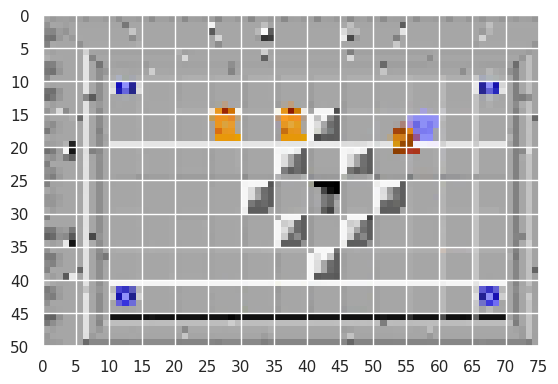



****************************************
Example no: zelda-image-00013947.png
predicted:                    real
###############        ###############
###############        #######DD######
##-------------        ##------------#
##------------#        ##------------#
#D------------#        #D------------#
##------------#        #D----B--B----#
#-------------#        #D------------#
##------------#        ##------------#
##------------#        ##------------#
#######D#######        #######DD######


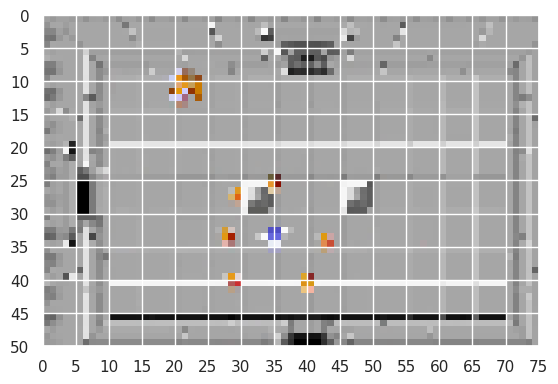



****************************************
Example no: zelda-image-00016110.png
predicted:                    real
##--###########        ###############
#######DD######        #######DD######
--------------#        ##------------#
#--------------        ##------B-----#
##------------#        ##-----B-B----D
##------------#        ##----B-T-B---D
--------------#        ##-----B-B----D
-#------------#        ##------B-----#
--------------#        ##------------#
######----#####        #######DD######


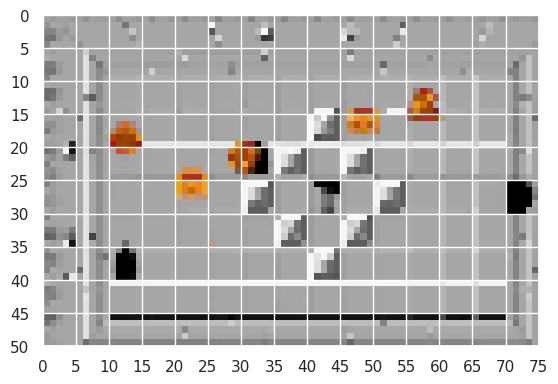



****************************************
Example no: zelda-image-00014824.png
predicted:                    real
#---###########        ###############
########-######        ###############
#-------------#        ##------------#
##--###-------#        ##------------#
##------------#        #D------------D
##------------#        #D------------D
##------------#        #D------------D
##-------------        ##------------#
-#-----------O#        ##------------#
######----#####        ###############


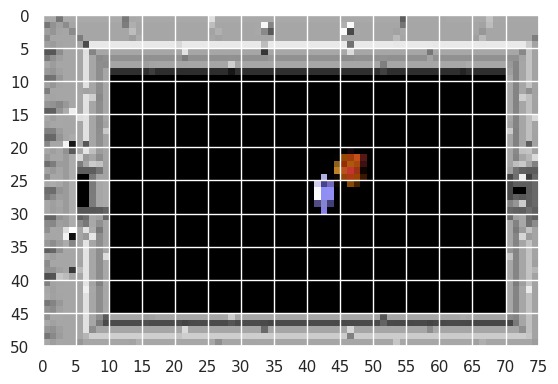



****************************************
Example no: zelda-image-00014128.png
predicted:                    real
#------#######-        ###############
##-#-#-#D#-####        #######DD######
##-------------        ##------------#
---------------        ##------------#
##------------#        ##-----BB-----#
#-------------#        ##-----BB-----#
#-------------#        ##-----BB-----#
##------------#        ##------------#
##------------#        ##------------#
#######----####        #######DD######


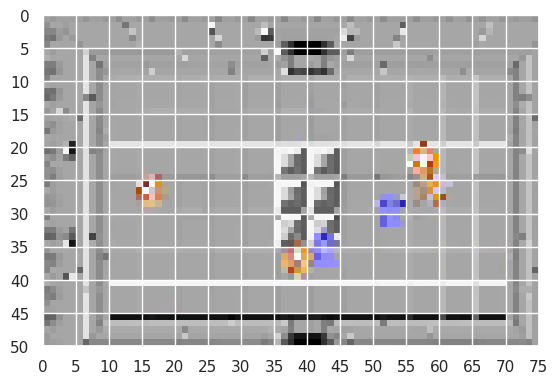



****************************************
Example no: zelda-image-00012684.png
predicted:                    real
##---##O-#--#-#        ###############
#######D#######        #######DD######
##--------BB-B#        ##BBBBB--BBBBB#
----------BBBB#        ##BBBB----BBBB#
------------B-#        ##BB--------BB#
--------------D        ##------------#
##------------D        ##------------#
##---------B--#        ##--B------B--#
##------------#        ##------------#
###############        ###############


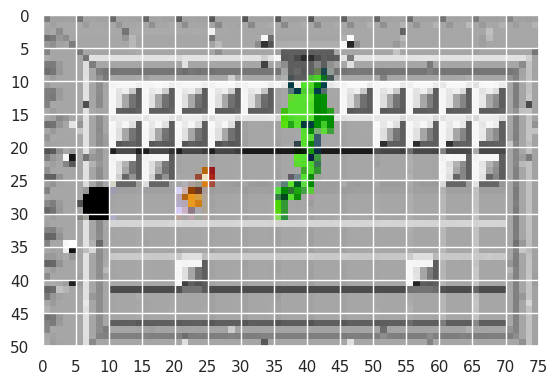



****************************************
Example no: zelda-image-00014933.png
predicted:                    real
---------------        ###############
---------------        ##------------#
-------------##        ##------------#
---------------        ##------------#
---------------        ##----H--H----#
--------------#        ##------------#
---------------        ##------------#
---------------        ##------------#
#-------------#        #######DD######
##------------#        ###############


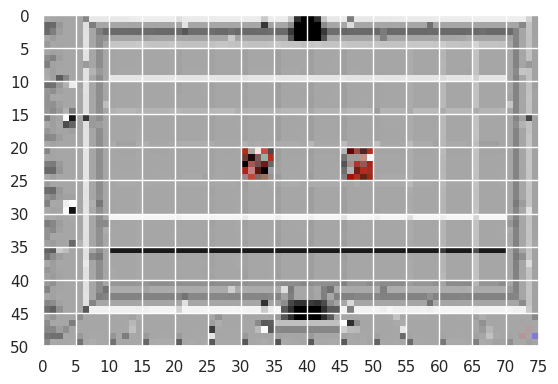



****************************************
Example no: zelda-image-00012053.png
predicted:                    real
###-###########        ###############
#######DD######        ###############
##-------------        ##--B--------B#
##------------#        ##-B---B----B-#
##------------#        ##----B----B--#
##---B----B---#        ##---B----B---#
##------------#        ##--B----B----#
##-----BB-----#        ##-B----B---B-#
#-------------#        ##B--------B--#
#########-#####        #######DD######


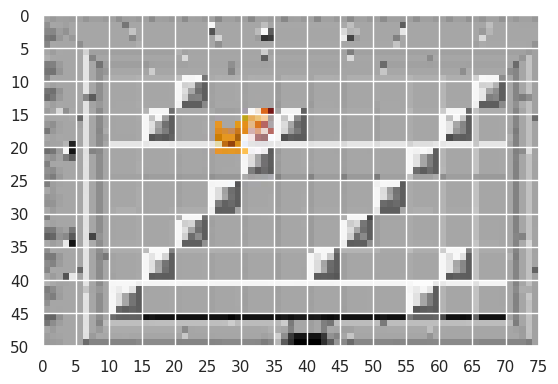



****************************************
Example no: zelda-image-00013464.png
predicted:                    real
-----##########        ###############
#######--######        #######DD######
#--------------        ##------------#
---------------        ##------B-----#
##------------#        ##-----B-B----D
##------------#        ##----B-T-B---D
#-------------#        ##-----B-B----D
##------------#        ##------B-----#
--------------#        ##------------#
########-######        #######DD######


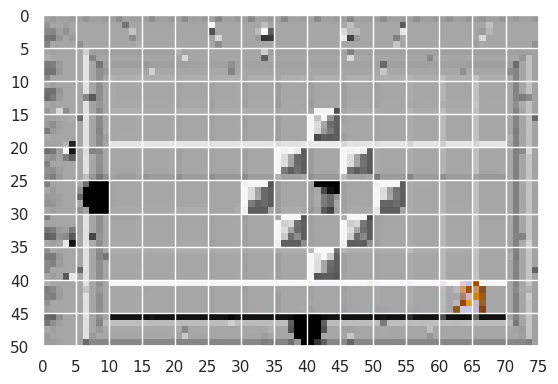



****************************************
Example no: zelda-image-00011393.png
predicted:                    real
###############        ###############
###############        #######DD######
##------------#        ##--B--------B#
##------------#        ##-B---B----B-#
#D------------#        #D----B----B--D
#D------------#        #D---B----B---D
#D------------D        #D--B----B----D
##------------#        ##-B----B---B-#
##-----------H#        ##B--------B--#
#######DD######        ###############


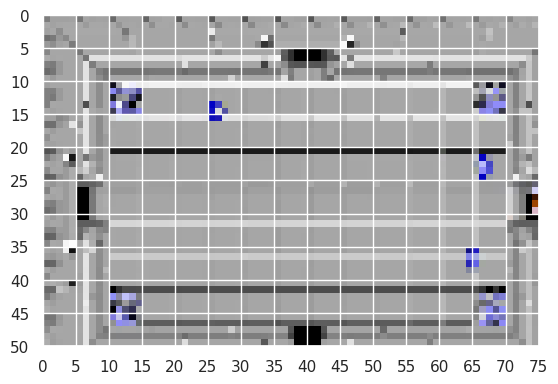



****************************************


In [ ]:
y_valid_pred_numerical = (np.argmax(y_valid_pred, axis = 3) + 1).astype('int')
for i in python_random.sample(range(len(y_valid)), 10):
  print("Example no:", X_valid_frame_names[i])
  print("predicted:" + " " * 20 + "real")

  decoded_pred = list(np.vectorize(reversed_enc_map.get)(y_valid_pred_numerical))[i]
  decoded_test = list(np.vectorize(reversed_enc_map.get)(y_valid_numerical))[i]


  for idx, row in enumerate(decoded_pred):
    print("".join(row) + "        " + "".join(decoded_test[idx]))
  fig, ax = plt.subplots()
  loc_x = plticker.MultipleLocator(base=5)
  loc_y = plticker.MultipleLocator(base=5)
  ax.xaxis.set_major_locator(loc_x)
  ax.yaxis.set_major_locator(loc_y)
  ax.grid(linewidth=1)

  plt.imshow(X_valid[i], extent=[0, 75, 50, 0])
  plt.show()
  print("\n")
  print("****************************************")

In [ ]:
def plot_confusion_matrix(y_pred, y_true_numerical, title):
  letters = list(enc_map.keys())
  y_pred_numerical = (np.argmax(y_pred, axis = 3) + 1).astype('int')

  y_pred_string = np.vectorize(reversed_enc_map.get)(y_pred_numerical)
  y_true_string = np.vectorize(reversed_enc_map.get)(y_true_numerical)

  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    cf_matrix = pd.DataFrame(
        confusion_matrix(y_true_string.flatten(),
        y_pred_string.flatten(), labels=letters),
        index=['{:}'.format(x) for x in letters],
        columns=['{:}'.format(x) for x in letters]
    )

    print(classification_report(
        y_true_string.flatten(),
        y_pred_string.flatten())
    )

    from matplotlib.pyplot import figure
    figure(figsize=(10, 6), dpi=80)
    ax = sns.heatmap(cf_matrix, annot=True,cmap='BuPu', fmt='g', xticklabels=True, yticklabels=True)

    ax.set_title(title)
    ax.set_xlabel('\nPredicted Values')
    ax.set_ylabel('Actual Values ')

    ## Display the visualization of the Confusion Matrix.
    plt.show()

In [ ]:
import warnings

def per_game_stats(y_pred, y_numerical, frame_names):
  game_based_true = {game_key:[] for game_key in game_keys}
  game_based_pred = {game_key:[] for game_key in game_keys}

  for index, image_name in enumerate(frame_names):
    game_part = image_name.split("-")[0]
    game_based_true[game_part].append(y_numerical[index])
    game_based_pred[game_part].append(y_pred[index])

  for game in list(game_based_true.keys()):
      print(f"\n Displaying Game-specific stats for ***{game.upper()}***")
      plot_confusion_matrix(
          game_based_pred[game], game_based_true[game],
          title=f"Statistics of {game}"
      )


 Displaying Game-specific stats for ***SMB***
              precision    recall  f1-score   support

           #       0.94      0.81      0.87     22725
           -       0.96      0.96      0.96    147106
           B       0.65      0.81      0.72      1045
           D       0.92      0.96      0.94      3953
           H       0.48      0.59      0.53      1886
           O       0.59      0.79      0.68      1473
           S       0.62      0.96      0.76      5112

    accuracy                           0.93    183300
   macro avg       0.74      0.84      0.78    183300
weighted avg       0.94      0.93      0.93    183300



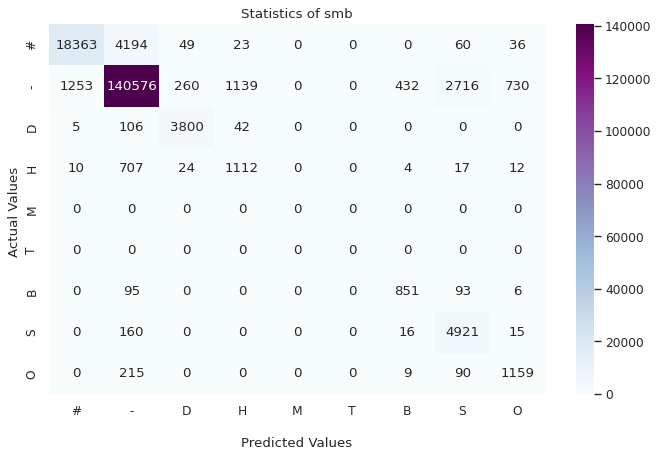


 Displaying Game-specific stats for ***ZELDA***
              precision    recall  f1-score   support

           #       0.99      0.96      0.97     81720
           -       0.98      0.98      0.98     85632
           B       0.92      0.94      0.93      8757
           D       0.74      0.96      0.83      6245
           H       0.84      0.93      0.88       842
           T       0.86      1.00      0.92       104

    accuracy                           0.97    183300
   macro avg       0.89      0.96      0.92    183300
weighted avg       0.97      0.97      0.97    183300



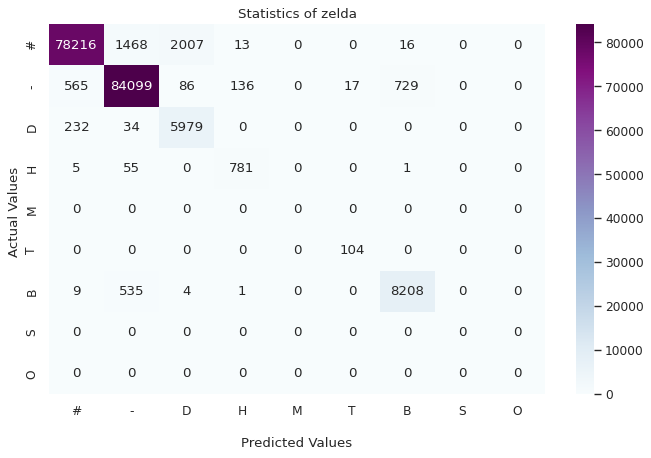

In [ ]:
# Evaluate Training Performance
per_game_stats(y_pred_train, y_train_numerical, X_train_frame_names)


 Displaying Game-specific stats for ***SMB***
              precision    recall  f1-score   support

           #       0.94      0.84      0.89      3886
           -       0.95      0.97      0.96     23410
           B       0.28      0.57      0.38        28
           D       0.86      0.94      0.89       575
           H       0.31      0.25      0.27       491
           O       0.00      0.00      0.00        59
           S       0.61      0.72      0.66       501

    accuracy                           0.93     28950
   macro avg       0.56      0.61      0.58     28950
weighted avg       0.93      0.93      0.93     28950



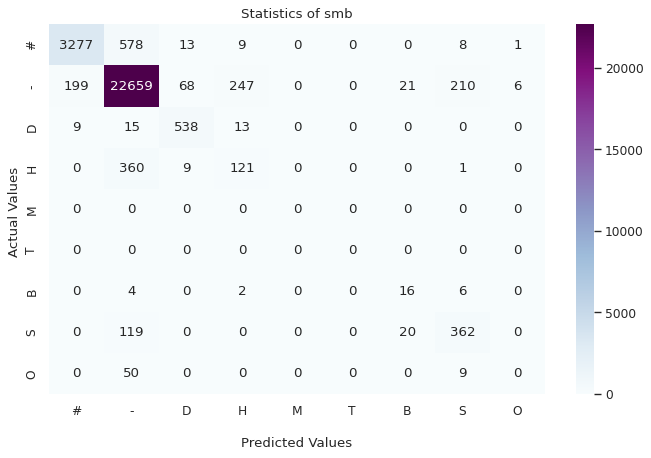


 Displaying Game-specific stats for ***ZELDA***
              precision    recall  f1-score   support

           #       0.96      0.54      0.69    238763
           -       0.66      0.99      0.79    271889
           B       0.87      0.21      0.34     29371
           D       0.60      0.21      0.31     17219
           H       0.59      0.03      0.05      2836
           O       0.00      0.00      0.00         0
           S       0.00      0.00      0.00         0
           T       1.00      0.15      0.26       922

    accuracy                           0.73    561000
   macro avg       0.58      0.27      0.31    561000
weighted avg       0.79      0.73      0.70    561000



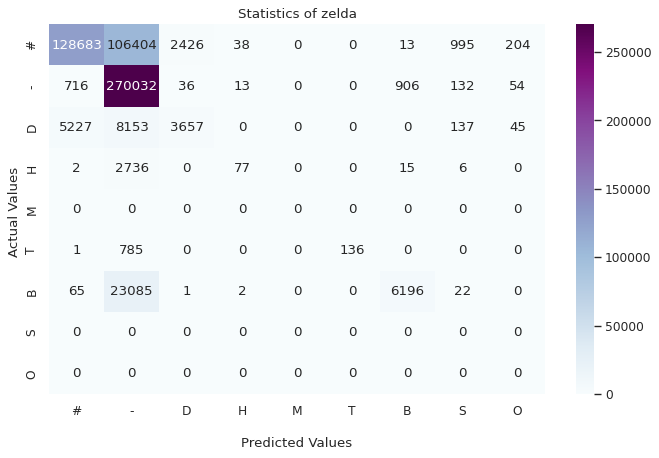

In [ ]:
# Evaluate Validation Performance
per_game_stats(y_valid_pred, y_valid_numerical, X_valid_frame_names)

In [ ]:
from sklearn.manifold import TSNE

In [ ]:
# from sklearn.cluster import DBSCAN
# from sklearn.manifold import TSNE
# encoded_inputs, _, _ = model.encoder(X_train)
# # Assuming X contains your high-dimensional data
# dbscan = DBSCAN(eps=9, min_samples=20)
# cluster_labels = dbscan.fit_predict(encoded_inputs)
# tsne = TSNE(n_components=2)
# tsne_result = tsne.fit_transform(encoded_inputs)

# # Visualize the clustered points in the t-SNE space
# import matplotlib.pyplot as plt
# plt.scatter(tsne_result[:, 0], tsne_result[:, 1], c=cluster_labels)
# plt.show()

In [ ]:
def get_mode(list_of_arrays):
  ans = np.ones_like(list_of_arrays[0])
  num_rows = len(list_of_arrays[0])
  num_cols = len(list_of_arrays[0][0])
  for i in range(num_rows):
    for j in range(num_cols):
      l_chars = []
      for k in range(len(list_of_arrays)):
        l_chars.append(list_of_arrays[k][i][j])
      ans[i][j] = max(set(l_chars), key=l_chars.count)

  return ans


def print_arr(arr1, arr2):
    """
    prints a 2-D numpy array in a nicer format
    """
    print("predicted_mode: " + " " * 10 + "real_mode: ")
    for a1, a2 in zip(arr1, arr2):
        print("".join(a1) + "        " + "".join(a2))
    print(end="\n")


In [ ]:
# # # indices_overlap = [781, 656, 1168, 1677, 3557, 3483, 1118, 1329, 2033, 399, 1055, 3361, 942, 2414, 2908, 3669, 1140, 570]
# # Example 1
# # indices_overlap = [1539, 2592, 1118, 2002, 1209, 1341, 717, 3628, 3057, 3918, 2548, 3047]
# # indices_overlap = [3557]

# # Example 2
# # indices_overlap = [1562, 2795, 2504, 3779]
# # indices_overlap = [3879, 3331, 3819, 3677, 1460, 656, 889, 2021, 2822, 3691, 3023, 2594, 2847, 1080, 1769, 216, 3140]

# # Example 3
# # indices_overlap = [2983]
# # indices_overlap = [1039, 1486, 1223, 3085, 2084, 416, 3446, 498, 2439, 2981, 1257, 2352, 3891, 1934, 3712]

# # Example 4
# # indices_overlap = [2844, 1819, 3884]
# # indices_overlap = [3212, 435, 712, 234, 1535, 2434, 3902, 399, 3276, 780]

# # Example 5
# # indices_overlap = [1644]
# # indices_overlap = [822, 302]

# # Example 6
# # indices_overlap = [1735]
# # indices_overlap = [93, 1645]

# # Example 7
# # indices_overlap = [3891, 1322]
# # indices_overlap = [2983]

# # Example 8
# # indices_overlap = [1377, 2390, 1705]
# # indices_overlap = [2363, 570]

# # Example 9
# # indices_overlap = [1819]
# # indices_overlap = [3212, 712, 435]

# # Example 10
# # indices_overlap = [3884]
# # indices_overlap = [234, 3902, 2434, 399, 3276]

# # Example 11
# # indices_overlap = [1819, 2144, 2892, 3244]
# # indices_overlap = [234, 3212, 435, 2826, 1117]

# # Example 12
# # indices_overlap = [3691, 2822]
# # indices_overlap = [1562, 2795]

# # Example 13
# # indices_overlap = [3047, 2002, 1209]
# # indices_overlap = [3483, 409, 3538]

# # Example 14
# # indices_overlap = [3329]
# # indices_overlap = [3491, 2177]

# # Example 15
# # indices_overlap = [3557]
# # indices_overlap = [963]

# # Example 16
# # indices_overlap = [3483, 409]
# # indices_overlap = [3393, 473, 245, 1165, 1459]

# # Example 17
# # indices_overlap = [3450, 607]
# # indices_overlap = [252]

# # indices_overlap = [3557]
# # indices_overlap = [3057, 3938]

# # indices_overlap = [2682, 3257]
# # indices_overlap = [634, 3329]

# # indices_overlap = [69, 3369]
# # indices_overlap = [1416, 2673]

# # indices_overlap = [93, 1645, 1140, 1245, 577, 1017, 2458, 2489]
# # indices_overlap = [861, 389, 3909, 1735, 1301, 1605, 1252, 1589]

# indices_overlap = [3692, 1362, 571, 1094, 1489, 1280, 3930]
# # indices_overlap = [898, 827, 96, 1142, 1500, 2778, 793, 828]

# images = []
# texts_pred = []
# texts_real = []
# y_train_pred_numerical = (np.argmax(y_pred_train, axis = 3) + 1).astype('int')
# for i in indices_overlap:
#   images.append(X_train[i])
#   print("Example no:", i)
#   print("predicted:" + " " * 20 + "real")

#   decoded_pred = list(np.vectorize(reversed_enc_map.get)(y_train_pred_numerical))[i]
#   decoded_test = list(np.vectorize(reversed_enc_map.get)(y_train_numerical))[i]
#   texts_real.append(decoded_test)
#   texts_pred.append(decoded_pred)


#   for idx, row in enumerate(decoded_pred):
#     print("".join(row) + "        " + "".join(decoded_test[idx]))

#   fig,ax=plt.subplots()
#   #Spacing between each line
#   loc_x = plticker.MultipleLocator(base=5)
#   loc_y = plticker.MultipleLocator(base=5)
#   ax.xaxis.set_major_locator(loc_x)
#   ax.yaxis.set_major_locator(loc_y)
#   # Add the grid
#   plt.imshow(X_train[i], extent=[0, 75, 50, 0])
#   plt.show()
#   print("\n")
#   print("****************************************")


# average_image = sum(images) / len(images)
# fig,ax=plt.subplots()
# #Spacing between each line
# loc_x = plticker.MultipleLocator(base=5)
# loc_y = plticker.MultipleLocator(base=5)
# ax.xaxis.set_major_locator(loc_x)
# ax.yaxis.set_major_locator(loc_y)

# plt.imshow(average_image, extent=[0, 75, 50, 0])
# plt.show()
# result_pred = get_mode(texts_pred)
# result_real = get_mode(texts_real)
# print_arr(result_pred, result_real)

In [ ]:
# # perform t-SNE embedding with perpelxity 50
# vis_data = TSNE(learning_rate='auto', init='random', perplexity=50).fit_transform(encoded_inputs)
# print(len(vis_data))
# # plot the result
# vis_x = vis_data[:, 0]
# vis_y = vis_data[:, 1]

# df = pd.DataFrame(
#     {'x': vis_x,
#      'y': vis_y,
#      'index': range(len(vis_x)),
#       'game' : tags
#     })
# plt.figure(figsize=(18, 16), dpi=100)
# fig = px.scatter(df, x="x", y="y", color='game', hover_data=['index'], color_discrete_sequence=px.colors.qualitative.Bold)
# # plt.colorbar(ticks=range(len(game_keys)))
# # plt.clim(0, len(game_keys)-1)
# fig.show()

In [ ]:
# # perform t-SNE embedding with perpelxity 25
# vis_data = TSNE(learning_rate='auto', init='random', perplexity=25).fit_transform(encoded_inputs)
# print(len(vis_data))
# # plot the result
# vis_x = vis_data[:, 0]
# vis_y = vis_data[:, 1]

# df = pd.DataFrame(
#     {'x': vis_x,
#      'y': vis_y,
#      'index': range(len(vis_x)),
#       'game' : tags
#     })

# plt.figure(figsize=(18, 16), dpi=100)
# fig = px.scatter(df, x="x", y="y", color='game', hover_data=['index'], color_discrete_sequence=px.colors.qualitative.Bold)
# # plt.colorbar(ticks=range(len(game_keys)))
# # plt.clim(0, len(game_keys)-1)
# fig.show()

In [ ]:
# # perform t-SNE embedding with perpelxity 25
# vis_data = TSNE(learning_rate='auto', init='random', perplexity=10).fit_transform(encoded_inputs)
# print(len(vis_data))
# # plot the result
# vis_x = vis_data[:, 0]
# vis_y = vis_data[:, 1]

# df = pd.DataFrame(
#     {'x': vis_x,
#      'y': vis_y,
#      'index': range(len(vis_x)),
#       'game' : tags
#     })

# plt.figure(figsize=(18, 16), dpi=100)
# fig = px.scatter(df, x="x", y="y", color='game', hover_data=['index'], color_discrete_sequence=px.colors.qualitative.Bold)
# # plt.colorbar(ticks=range(len(game_keys)))
# # plt.clim(0, len(game_keys)-1)
# fig.show()

In [ ]:
# colors = []
# tags = []
# for i in range(len(X_valid_frame_names)):
#   if "smb" in X_valid_frame_names[i]:
#     colors.append(0)
#     tags.append("smb")
#   elif "kid_icarus" in X_valid_frame_names[i]:
#     colors.append(1)
#     tags.append("kid_icarus")
#   else:
#     colors.append(2)


In [ ]:
# encoded_inputs, _, _ = model.encoder(X_valid)

# # perform t-SNE embedding
# vis_data = TSNE(learning_rate='auto', init='random', perplexity=100).fit_transform(encoded_inputs)
# # vis_data = bh_sne(encoded_inputs.astype('float64'))
# # plot the result
# vis_x = vis_data[:, 0]
# vis_y = vis_data[:, 1]
# print(vis_x.shape, vis_y.shape, len(tags))

# df = pd.DataFrame(
#     {'x': vis_x,
#      'y': vis_y,
#      'index': range(len(vis_x)),
#       'color' : tags
#     })

# import plotly.express as px
# plt.figure(figsize=(18, 16), dpi=100)
# fig = px.scatter(df, x="x", y="y", color='color', hover_data=['index'], color_discrete_sequence=px.colors.qualitative.Bold, title="Validation Data T-SNE")
# # plt.colorbar(ticks=range(len(game_keys)))
# # plt.clim(0, len(game_keys)-1)
# fig.show()

# # plt.scatter(vis_x, vis_y, c=colors, cmap=plt.cm.get_cmap("jet", len(game_keys)))
# # plt.colorbar(ticks=range(len(game_keys)))
# # plt.clim(0, len(game_keys)-1)
# # plt.show()

In [ ]:
# indices_overlap = [287, 295, 320]
# # overlapping_points = vis_data[cluster_labels != -1]
# for i in indices_overlap:
#   print("Example no:", i)
#   print("predicted:" + " " * 20 + "real")

#   decoded_pred = list(np.vectorize(reversed_enc_map.get)(y_valid_pred_numerical))[i]
#   decoded_test = list(np.vectorize(reversed_enc_map.get)(y_valid_numerical))[i]


#   for idx, row in enumerate(decoded_pred):
#     print("".join(row) + "        " + "".join(decoded_test[idx]))

#   fig,ax=plt.subplots()
#   #Spacing between each line
#   loc_x = plticker.MultipleLocator(base=5)
#   loc_y = plticker.MultipleLocator(base=5)
#   ax.xaxis.set_major_locator(loc_x)
#   ax.yaxis.set_major_locator(loc_y)
#   # Add the grid
#   plt.imshow(X_valid[i], extent=[0, 75, 50, 0])
#   plt.show()
#   print("\n")
#   print("****************************************")

## **Load Test Data**

In [ ]:
""" load images """
test_images = dict()
directory = f"./data/{TEST_GAME}/cropped"
print(f"Processing {TEST_GAME} data...")
for file in os.listdir(directory):
    try:
      filename = os.fsdecode(file)
      if filename.endswith(".png"):
        img_bgr = cv2.imread(os.path.join(directory, filename))
        if CHANNELS == 3:
          img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        else:
          img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

        img_rgb = cv2.resize(img_rgb, (IMG_WIDTH, IMG_HEIGHT))

        image = np.asarray(img_rgb)
        to_save = image.astype(np.uint8)
        test_images[f"{TEST_GAME}-{filename}"] = to_save
    except Exception as e:
      print(filename)
print(f"Number of images in the dataset: {len(test_images)}")

Processing megaman data...
Number of images in the dataset: 2195


In [ ]:
data = dict()
print(f"Loading {TEST_GAME}...")
with open(f"./data/{TEST_GAME}/dataset.pickle", "rb") as fh:
    data = pickle.load(fh)
    all_datasets[TEST_GAME] = data

Loading megaman...


In [ ]:
print(len(test_images.keys()))

2195


In [ ]:
X_test = []
y_test = []
X_test_frame_names = []

game_dataset = all_datasets[TEST_GAME]
num_of_game_frames = len(game_dataset)
print(num_of_game_frames)
for image_name in sorted(game_dataset.keys()):
  if image_name in test_images.keys():
      X_test.append(test_images[image_name])
      y_test.append(game_dataset[image_name])
      X_test_frame_names.append(image_name)

2195


['-' '-' '-' 'T' '-' '-' '#' '#' '#' '#' '#' '#' '-' '-' '#']
['-' '-' '-' 'T' '-' '-' '#' '#' '#' '#' '#' '#' '-' '-' '#']
['-' '-' '-' '-' '-' '-' '#' '#' '-' '-' '-' '-' 'S' 'S' '#']
['-' '-' '-' '-' '-' '-' 'H' '#' '-' '-' '-' '-' 'S' 'S' '#']
['-' '-' 'T' '#' '#' '#' '#' '#' 'T' '#' '#' '#' '#' '#' '#']
['-' '-' 'T' '#' '#' '#' '#' '#' 'T' '#' '#' '#' '#' '#' '#']
['-' '-' 'T' '-' '-' '-' '#' '#' 'T' '-' '-' '-' '-' '-' '#']
['-' '-' 'T' '-' '-' '-' 'H' '#' 'T' '-' '-' '-' '-' '-' '#']
['-' '-' 'T' '-' '-' '-' '#' '#' '#' '#' '#' '#' 'T' '#' '#']
['-' '-' 'T' '-' '-' '-' '#' '#' '#' '#' '#' '#' 'T' '#' '#']


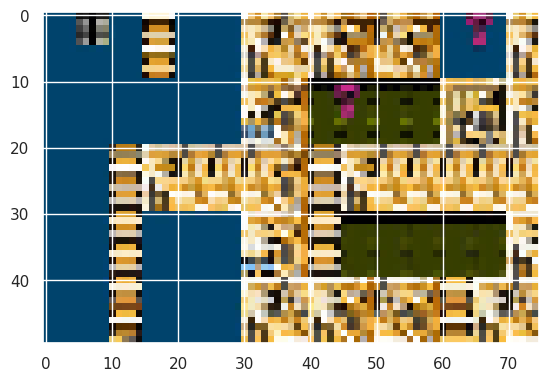

In [ ]:
X_test, y_test, X_test_frame_names = shuffle(X_test, y_test, X_test_frame_names)
for row in np.vectorize(reversed_enc_map.get)(y_test[159]):
  print(row)

DIVIDE_BY = 255

X_test = convert_to_float_np_arr(X_test) / DIVIDE_BY
y_test_numerical = convert_to_int_np_arr(y_test)
y_test = keras.utils.to_categorical(
    y_test_numerical-1, num_classes = num_classes
)
plt.imshow(X_test[159])

In [ ]:
# Test Accuracy
z, _, _ = model.encoder.predict(X_test)
predictions = model.decoder.predict(z)
print(predictions.shape, len(predictions))
y_test_pred = tf.one_hot(tf.argmax(predictions, axis=3), depth = num_classes)
acc = keras.metrics.CategoricalAccuracy()
acc.update_state(y_test, y_test_pred)
print("test acc:", acc.result().numpy())

69/69 [==============================] - 2s 22ms/step
(2195, 10, 15, 9) 2195
test acc: 0.57211846


In [ ]:
import tensorflow_addons as tfa

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.13.0 and strictly below 2.16.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.11.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're u

In [ ]:
# print(len(X_test))
# print(len(predictions))
# print(predictions.shape)
# accuracies = {}
# for i in range(len(predictions)):
#   sample = predictions[i]
#   y_test_pred = tf.one_hot(tf.argmax(sample, axis=2), depth = num_classes)
#   acc = keras.metrics.CategoricalAccuracy()
#   acc.update_state(y_test[i], y_test_pred)
#   accuracies[i] = acc.result().numpy()

# with open(f'smbki_accuracies_{TEST_GAME}_2_game.pickle', 'wb') as handle:
#     pickle.dump(accuracies, handle, protocol=pickle.HIGHEST_PROTOCOL)
#     print(len(accuracies))



In [ ]:
# f1_macro_scores = {}
# for i in range(len(predictions)):
#   sample = predictions[i]
#   y_test_pred = tf.one_hot(tf.argmax(sample, axis=2), depth = num_classes)
#   f1 = tfa.metrics.F1Score(average="weighted", num_classes=num_classes)
#   f1_macro_scores[i] = f1_score(y_test[i].flatten(), y_test_pred.numpy().flatten(), average='macro')
# with open(f'smbki_f1weighted_{TEST_GAME}_2_game.pickle', 'wb') as handle:
#     pickle.dump(f1_macro_scores, handle, protocol=pickle.HIGHEST_PROTOCOL)



In [ ]:
from collections import Counter

In [ ]:
# min_acc = float('inf')
# min_index = []
# max_acc = float('-inf')
# max_index = []
# accuracies = {}

# for i in range(len(predictions)):
#   sample = predictions[i]
#   y_test_pred = tf.one_hot(tf.argmax(sample, axis=2), depth = num_classes)
#   acc = keras.metrics.CategoricalAccuracy()
#   acc.update_state(y_test[i], y_test_pred)
#   accuracies[i] = acc.result()

# top_5 = dict(Counter(accuracies).most_common(30))
# bottom_5 = dict(Counter(accuracies).most_common()[:-30-1:-1])
#   # if min_acc > acc.result():
#   #   min_acc = acc.result()
#   #   min_index.append()
#   # elif acc.result() > max_acc:
#   #   max_acc = acc.result()
#   #   max_index = i

# print("b ", bottom_5)
# print("t ", top_5)



In [ ]:
# max_f1 = float('-inf')
# max_f1_index = []
# f1s = {}

# for i in range(len(predictions)):
#   sample = predictions[i]
#   y_test_pred = tf.one_hot(tf.argmax(sample, axis=2), depth = num_classes)
#   f1 = f1_score(y_test[i].flatten(), y_test_pred.numpy().flatten(), average='micro')
#   f1s[i] = f1

# top_5 = dict(Counter(f1s).most_common(30))
# # bottom_5 = dict(Counter(accuracies).most_common()[:-30-1:-1])
#   # if min_acc > acc.result():
#   #   min_acc = acc.result()
#   #   min_index.append()
#   # elif acc.result() > max_acc:
#   #   max_acc = acc.result()
#   #   max_index = i

# print("t ", top_5)


# z, _, _ = model.encoder.predict(X_test)
# predictions = model.decoder.predict(z)
# y_test_pred = tf.one_hot(tf.argmax(predictions, axis=3), depth = num_classes)
# y_test_pred_numerical = (np.argmax(y_test_pred, axis = 3) + 1).astype('int')

# for i in list(top_5.keys()):
#   print("Example no:", i)
#   print("predicted:" + " " * 20 + "real")

#   decoded_pred = list(np.vectorize(reversed_enc_map.get)(y_test_pred_numerical))[i]
#   decoded_test = list(np.vectorize(reversed_enc_map.get)(y_test_numerical))[i]


#   for idx, row in enumerate(decoded_pred):
#     print("".join(row) + "        " + "".join(decoded_test[idx]))

#   fig,ax=plt.subplots()
#   #Spacing between each line
#   loc_x = plticker.MultipleLocator(base=5)
#   loc_y = plticker.MultipleLocator(base=5)
#   ax.xaxis.set_major_locator(loc_x)
#   ax.yaxis.set_major_locator(loc_y)
#   # Add the grid
#   plt.imshow(X_test[i], extent=[0, 75, 50, 0])
#   plt.show()
#   print("\n")
#   print("****************************************")



In [ ]:
# z, _, _ = model.encoder.predict(X_test)
# predictions = model.decoder.predict(z)
# y_test_pred = tf.one_hot(tf.argmax(predictions, axis=3), depth = num_classes)
# y_test_pred_numerical = (np.argmax(y_test_pred, axis = 3) + 1).astype('int')

# for i in list(bottom_5.keys()):
#   print("Example no:", i)
#   print("predicted:" + " " * 20 + "real:")

#   decoded_pred = list(np.vectorize(reversed_enc_map.get)(y_test_pred_numerical))[i]
#   decoded_test = list(np.vectorize(reversed_enc_map.get)(y_test_numerical))[i]


#   for idx, row in enumerate(decoded_pred):
#     print("".join(row) + "        " + "".join(decoded_test[idx]))

#   fig,ax=plt.subplots()
#   #Spacing between each line
#   loc_x = plticker.MultipleLocator(base=5)
#   loc_y = plticker.MultipleLocator(base=5)
#   ax.xaxis.set_major_locator(loc_x)
#   ax.yaxis.set_major_locator(loc_y)
#   # Add the grid
#   plt.imshow(X_test[i], extent=[0, 75, 50, 0])
#   plt.show()
#   print("\n")
#   print("****************************************")

In [ ]:
z, _, _ = model.encoder.predict(X_test)
predictions = model.decoder.predict(z)
y_test_pred = tf.one_hot(tf.argmax(predictions, axis=3), depth = num_classes)
y_test_pred_numerical = (np.argmax(y_test_pred, axis = 3) + 1).astype('int')

# for i in list(top_5.keys()):
#   print("Example no:", i)
#   print("predicted:" + " " * 20 + "real")

#   decoded_pred = list(np.vectorize(reversed_enc_map.get)(y_test_pred_numerical))[i]
#   decoded_test = list(np.vectorize(reversed_enc_map.get)(y_test_numerical))[i]


#   for idx, row in enumerate(decoded_pred):
#     print("".join(row) + "        " + "".join(decoded_test[idx]))

#   fig,ax=plt.subplots()
#   #Spacing between each line
#   loc_x = plticker.MultipleLocator(base=5)
#   loc_y = plticker.MultipleLocator(base=5)
#   ax.xaxis.set_major_locator(loc_x)
#   ax.yaxis.set_major_locator(loc_y)
#   # Add the grid
#   plt.imshow(X_test[i], extent=[0, 75, 50, 0])
#   plt.show()
#   print("\n")
#   print("****************************************")

69/69 [==============================] - 1s 14ms/step



 Displaying Game-specific stats for ***MEGAMAN***
              precision    recall  f1-score   support

           #       0.44      0.15      0.23    109520
           -       0.64      0.85      0.73    202878
           B       0.00      0.00      0.00         0
           D       0.00      0.00      0.00         0
           H       0.00      0.00      0.00      4594
           M       0.00      0.00      0.00      2081
           O       0.00      0.01      0.00       652
           S       0.00      0.03      0.00      1532
           T       0.00      0.00      0.00      7993

    accuracy                           0.57    329250
   macro avg       0.12      0.12      0.11    329250
weighted avg       0.54      0.57      0.53    329250



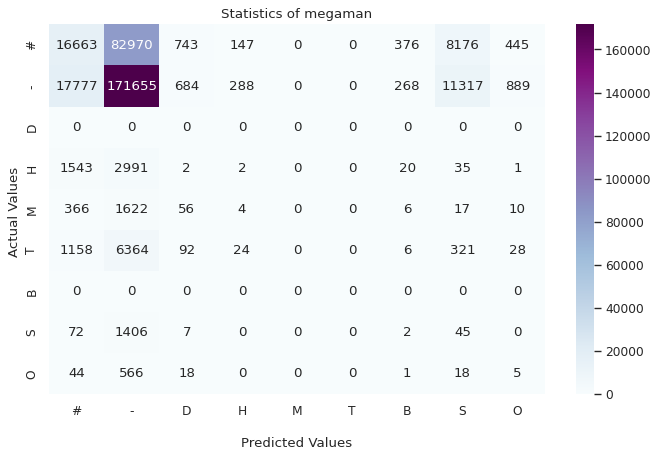

In [ ]:
# Evaluate Testing Performance
test_true = []
test_pred = []
game_part = TEST_GAME
for index, image_name in enumerate(X_test_frame_names):
  test_true.append(y_test_numerical[index])
  test_pred.append(y_test_pred[index])

print(f"\n Displaying Game-specific stats for ***{game_part.upper()}***")
plot_confusion_matrix(
    test_pred, test_true,
    title=f"Statistics of {game_part}"
)

Example no: megaman-image-00000113.png
predicted:                    real
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        --##------##---
---------------        --##------##---
---------------        ####----####---
---------------        ####------##---
---------------        ####--######--#
---------------        --##--######---


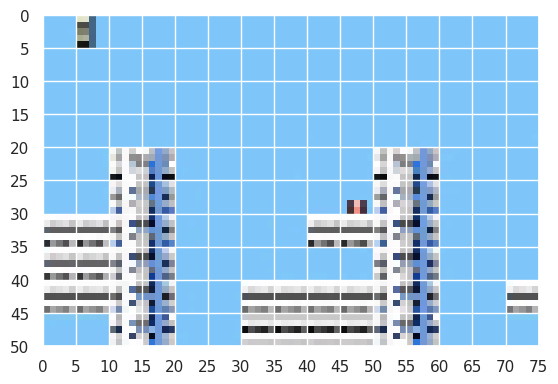



****************************************
Example no: megaman-image-00001045.png
predicted:                    real
SSSS-----------        #--------------
SSSSSSSSSS-----        #--------------
---------------        #--------####--
--S------------        #--------###H--
-OOOO----------        ##H----####----
SSSSSSSSSS-----        ---------##----
SSSS-----------        ---------##----
SSSS-----------        #H----#--##----
--SS-----------        #--------####--
#####---###-###        #-###---###----


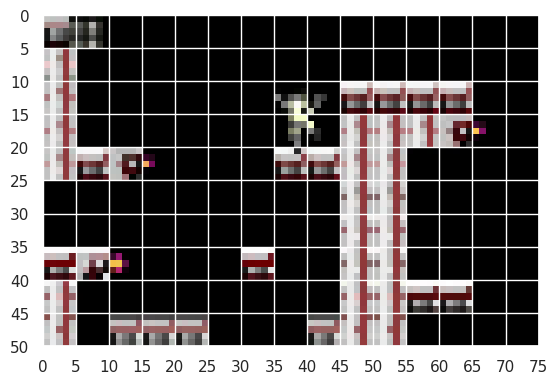



****************************************
Example no: megaman-image-00001257.png
predicted:                    real
-----SSS-------        ---------------
---SSSSSSS-----        ---------------
---------------        ---------------
---------------        ---------------
------SS-#-----        ---------------
-----SSSSSSSS--        ---------------
------SSSSSS---        ---------------
---------------        ---------------
------------OSS        M----##########
-#---#-########        -----##########


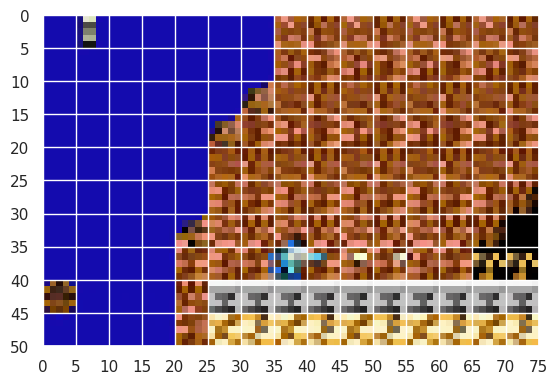



****************************************
Example no: megaman-image-00000838.png
predicted:                    real
-----------SSSS        ---------------
-----------SS--        ---------------
---------------        ---------------
---------------        ---------------
----------#----        ---------------
------------SSS        ---------------
---------------        ----###########
-------H####SSS        ----#########--
--------##----S        --T##########--
-##############        --T############


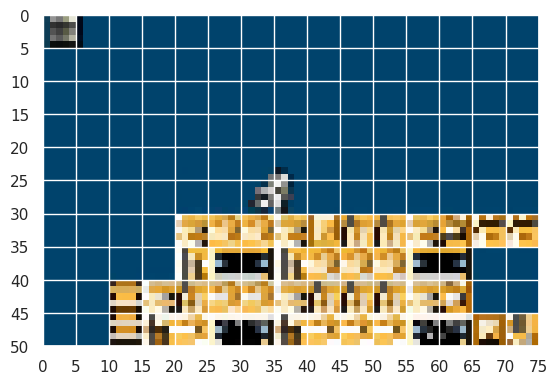



****************************************
Example no: megaman-image-00000389.png
predicted:                    real
---------------        ----#T#--######
---------------        ----#T#--######
---------------        ----#T------###
---------------        ----#T------###
---------------        ----#T------###
-----#------S--        ----#T###---###
---------------        -----------####
--------------S        -----------####
---------------        ###############
---------------        ###############


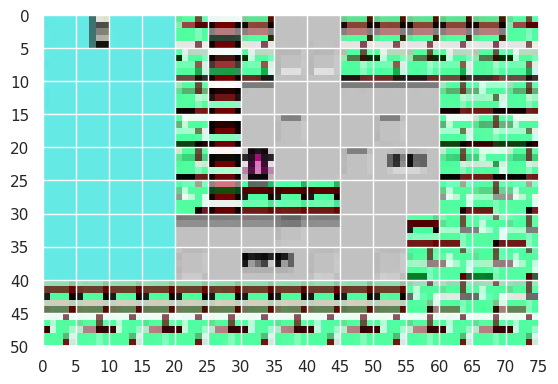



****************************************
Example no: megaman-image-00000104.png
predicted:                    real
--------H------        ---------------
---------##----        ---------------
------###------        ---------------
-------##------        ---------------
-------###-----        ---------------
---######------        ---------------
--#####--------        -------------##
--#######------        -------------##
-###-----------        ###############
---------------        -####----------


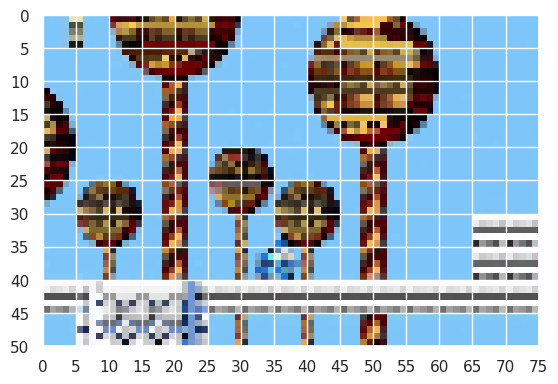



****************************************
Example no: megaman-image-00001537.png
predicted:                    real
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        -----------M---
---------------        ------M--------
---------------        -M-------------
---------------        ---------------
---------------        ---------------
---------------        ---------------


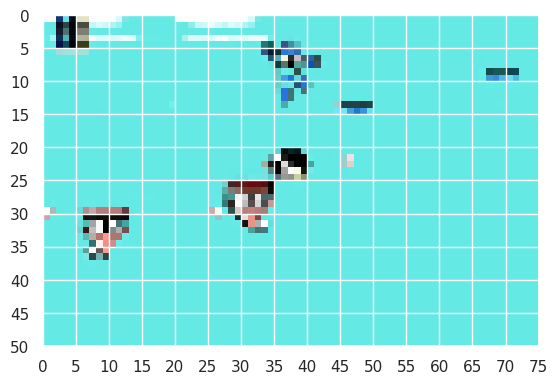



****************************************
Example no: megaman-image-00001527.png
predicted:                    real
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        --------O------
---------------        --M----##---M--
---------------        -------##------
---------------        -------##------
---------------        -------##------


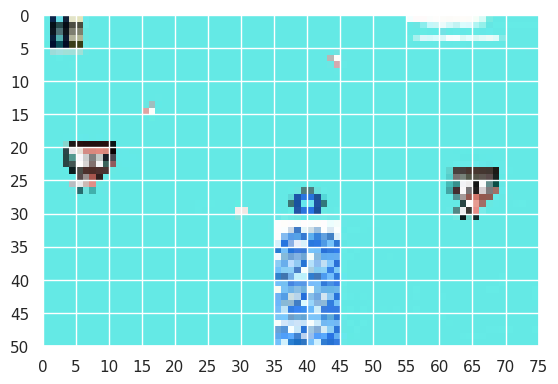



****************************************
Example no: megaman-image-00001257.png
predicted:                    real
-----SSS-------        ---------------
---SSSSSSS-----        ---------------
---------------        ---------------
---------------        ---------------
------SS-#-----        ---------------
-----SSSSSSSS--        ---------------
------SSSSSS---        ---------------
---------------        ---------------
------------OSS        M----##########
-#---#-########        -----##########


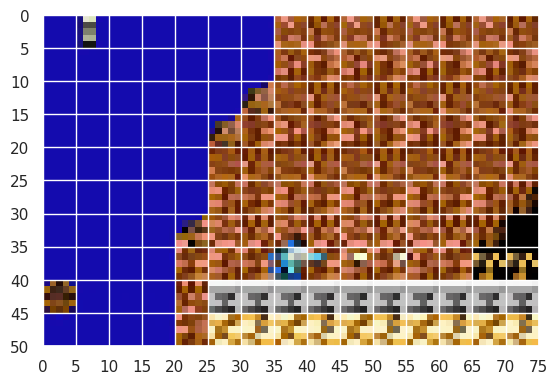



****************************************
Example no: megaman-image-00001247.png
predicted:                    real
----SS---------        ---------------
----SSS--------        ---------------
---------------        ---------------
---------------        ---------------
---------------        MMMMM-MM-------
--S-SSSSSSS----        ---------------
-----SSSS------        ---------------
------S--------        ---------------
------S--------        MM-MMM-MMM-MMM-
----------#####        ---------------


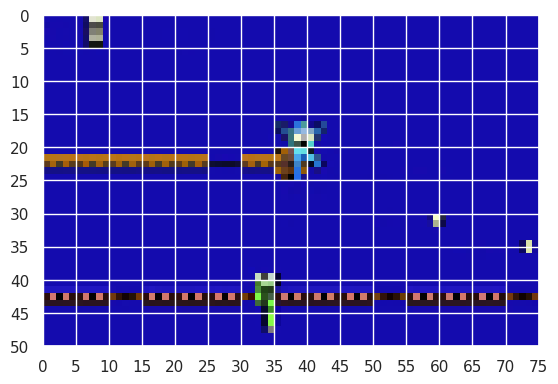



****************************************
Example no: megaman-image-00001255.png
predicted:                    real
--------------S        ---------------
-------------SS        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
-----SS-----SSS        ---------------
---------------        ---------------
--------####S-S        ---------------
---------------        MMM-MM----#####
--------------#        ----------#####


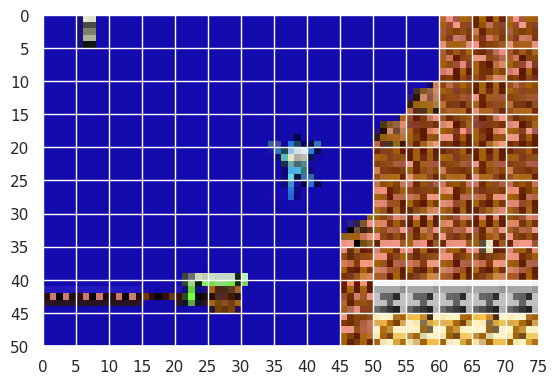



****************************************
Example no: megaman-image-00001248.png
predicted:                    real
---------------        ---------------
---------------        ---------------
---------------        ---------------
--------------S        ---------------
--------------S        MMM-MM---------
----S-S-------S        ---------------
---------------        ---------------
---------------        ---------------
---------------        -MMM-MMM-MMM-MM
---------#-####        ---------------


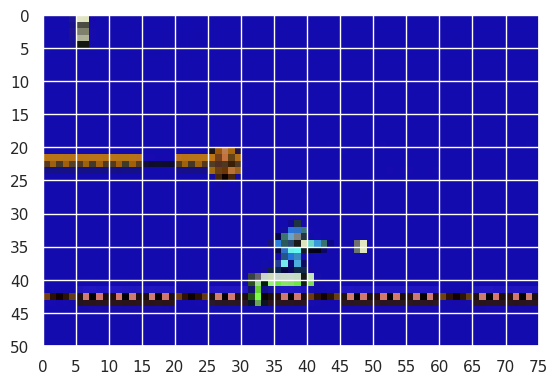



****************************************
Example no: megaman-image-00001526.png
predicted:                    real
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ----------O----
---------------        ----M----##---M
---------------        ---------##----
---------------        ---------##----
---------------        ---------##----


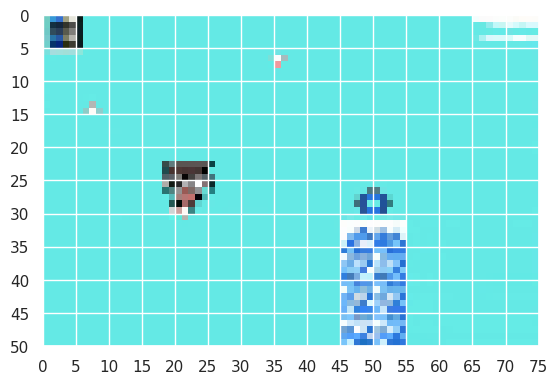



****************************************
Example no: megaman-image-00001236.png
predicted:                    real
-----------SS--        ---------------
----------S-SS-        ---------------
---------------        ---------------
---------------        ---------------
---------------        MMMMM-MM-------
--------------S        ---------------
---------------        ---------------
---------------        ---------------
---------------        MM-MMM-MMM-MMM-
-----------####        ---------------


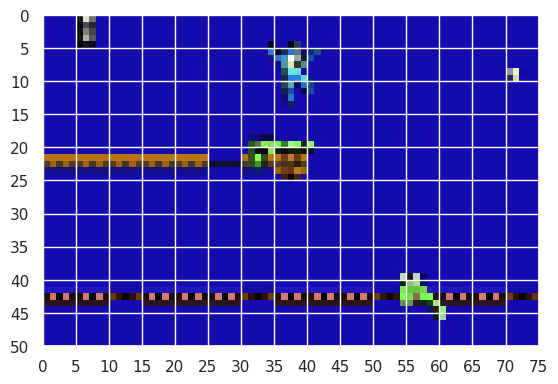



****************************************
Example no: megaman-image-00001250.png
predicted:                    real
----SS-SSSSSSSS        ---------------
SSSSSSS-SSS-SSS        ---------------
---------------        ---------------
---------------        ---------------
------------S--        MM-------------
-SSSSSSSSSSSSSS        ---------------
----SSSSS--SSS-        ---------------
------S--------        ---------------
------S----SS--        -MMM-MMM-MMM-MM
-----------####        ---------------


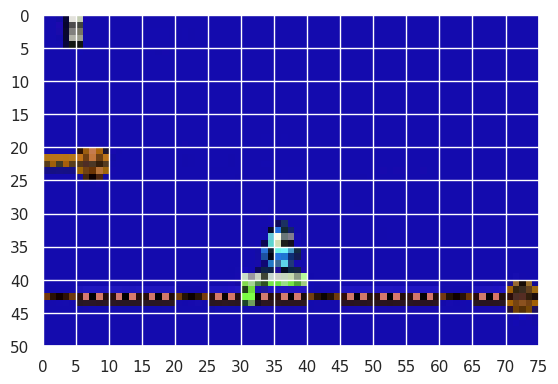



****************************************
Example no: megaman-image-00001522.png
predicted:                    real
---------------        ---------------
--------SSS--SS        ---------------
---------------        ---------------
---------------        ---------------
---------------        --M------------
---------------        --------M------
--S------------        --------------M
---------------        ---------------
---------------        ---------------
---------------        ---------------


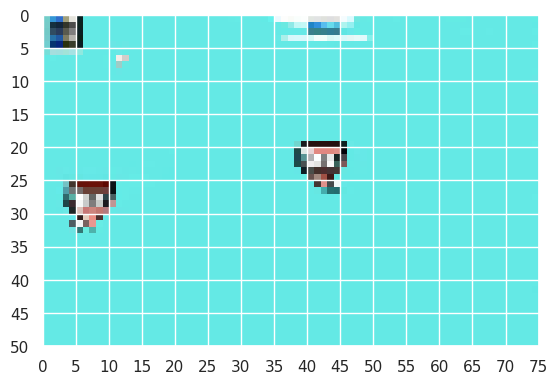



****************************************
Example no: megaman-image-00001237.png
predicted:                    real
---------------        ---------------
---------------        ---------------
---------------        ---------------
--------------S        ---------------
--------------S        MMMMM-MM-------
---SSSSS-S--S-S        ---------------
---------------        ---------------
---------------        ---------------
---------------        MM-MMM-MMM-MMM-
-------#-######        ---------------


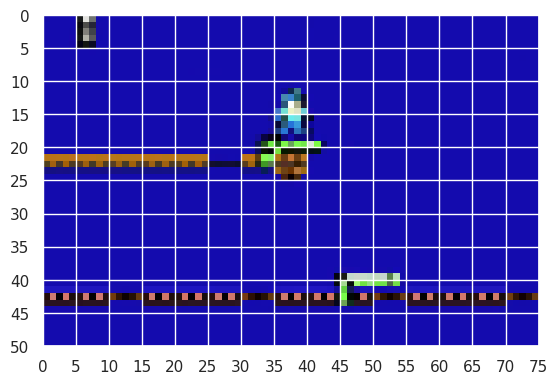



****************************************
Example no: megaman-image-00000838.png
predicted:                    real
-----------SSSS        ---------------
-----------SS--        ---------------
---------------        ---------------
---------------        ---------------
----------#----        ---------------
------------SSS        ---------------
---------------        ----###########
-------H####SSS        ----#########--
--------##----S        --T##########--
-##############        --T############


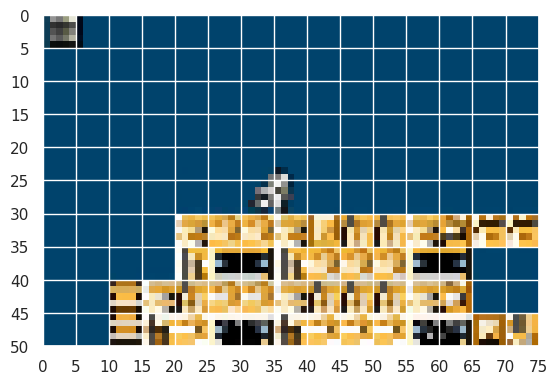



****************************************
Example no: megaman-image-00001750.png
predicted:                    real
----SSSSSSSSSSS        ---------------
--SSSSSSSSSSSSS        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
-------SSSSSS--        ---------------
----SSSSSSSSSSS        ---------------
S----SSSSSSSSSS        ---------------
-----S-----OSOS        ---------------
--------------#        HHHHHHHHHHHHHHH


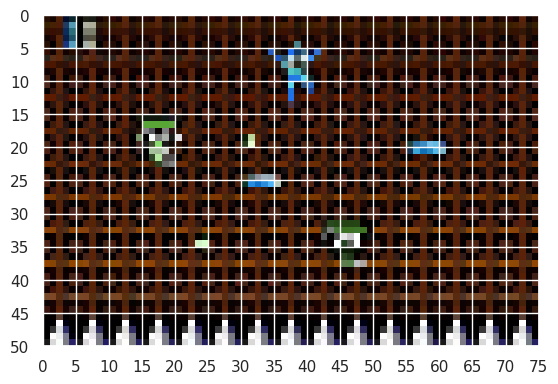



****************************************
Example no: megaman-image-00000345.png
predicted:                    real
---------------        ---------------
-----SSSSSSS-SS        ---------------
---------------        ---------------
---------------        -------------##
---------------        ---------------
------------S--        ---------------
---------------        ---------------
---------------        ---------------
---------------        --------#######
---------------        ###############


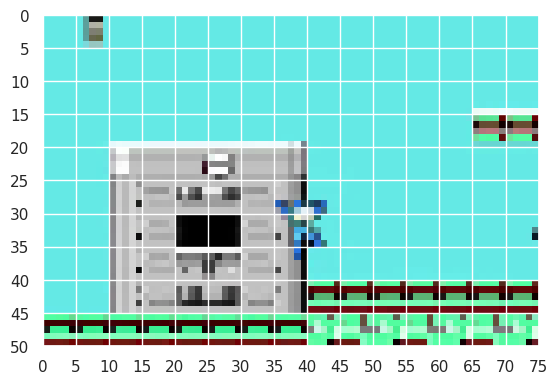



****************************************
Example no: megaman-image-00000179.png
predicted:                    real
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        --------#---#--
---------------        ---------------
---------------        ---------------
---------------        -------#-------
---------------        ---------------
---------------        --T##----------
---------------        --T##HHHHHHHHHH


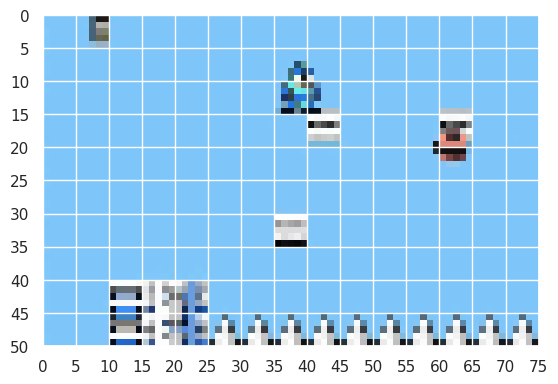



****************************************
Example no: megaman-image-00001524.png
predicted:                    real
-----------S-S-        ---------------
-------------SS        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
------------SS-        ---M-----------
------------S--        ---------M----#
---------#--S--        --------------#
---------------        --------------#
---------------        --------------#


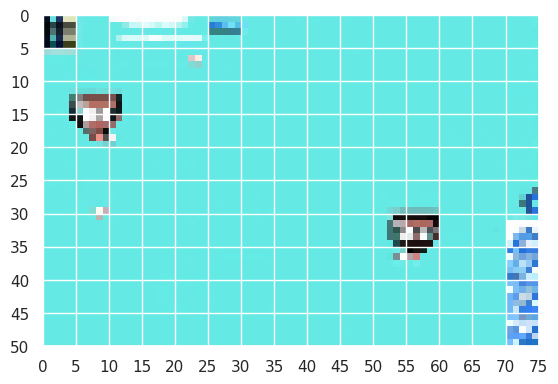



****************************************
Example no: megaman-image-00001528.png
predicted:                    real
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        --------O------
---------------        --M----##---M--
---------------        -------##------
---------------        -------##------
---------------        -------##------


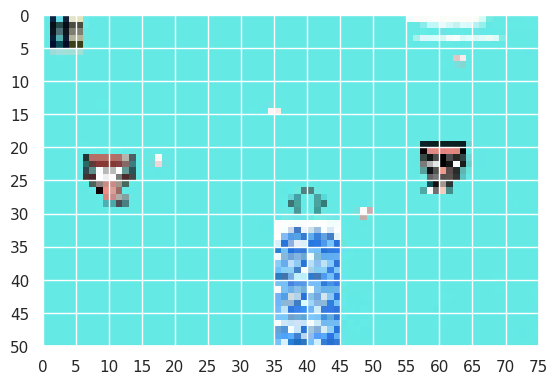



****************************************
Example no: megaman-image-00000843.png
predicted:                    real
---SSSSSSSSSSSS        ---------------
SSSSSSSSSSS-SSS        ---------------
---------------        ---------------
------HHHH-----        ---------------
---OO----------        ---------------
-SSSSSSSSSSSSSS        ---------------
------SSSSSSSSS        ###########----
S----SSSSSSSSSS        #########------
----O-OSSSSSSSS        #########------
###############        ###########--#-


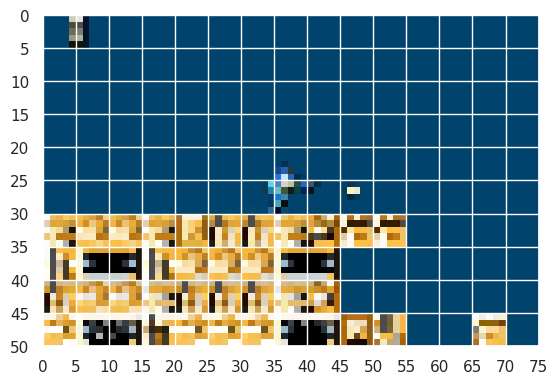



****************************************
Example no: megaman-image-00001249.png
predicted:                    real
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        M-MM-----------
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        MM-MMM-MMM-MMM-
------####--###        ---------------


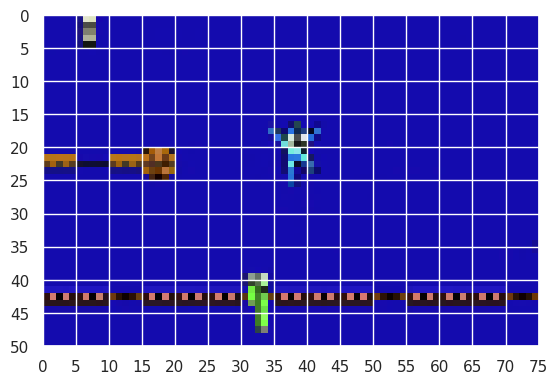



****************************************
Example no: megaman-image-00001748.png
predicted:                    real
---------------        ---------------
---SSS---------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
------SSSSSSS--        ---------------
-----SSSS---S--        ---------------
------SSS---S--        ---------------
------SSS--SSSS        #--------------
---------------        #HHHHHHHHHHHHHH


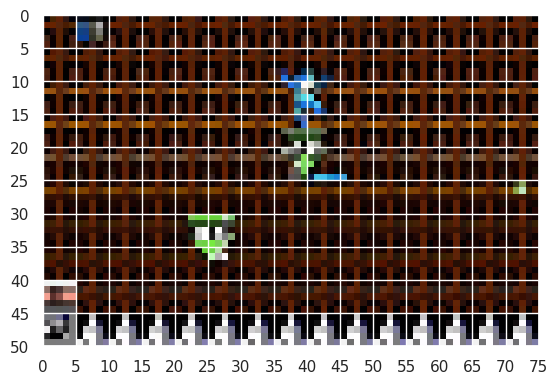



****************************************
Example no: megaman-image-00000185.png
predicted:                    real
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ----#---#------
---------------        ---------------
---------------        ---------------
---------------        ---#-----------
---------------        ---------------
---------------        #-----------###
---------------        #HHHHHHHHHHH---


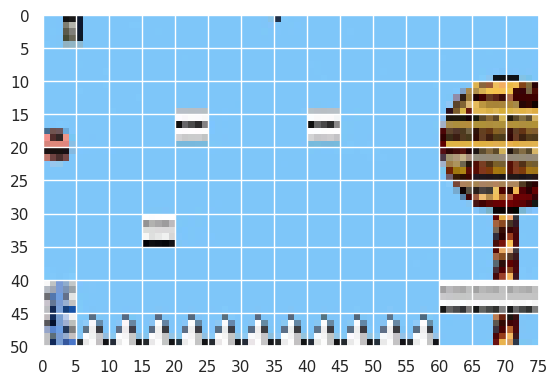



****************************************
Example no: megaman-image-00001752.png
predicted:                    real
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
-------SSS-----        ---------------
------S--------        ---------------
------------S--        ---------------
------SS-------        --------------#
---------------        HHHHHHHHHHHHHH#


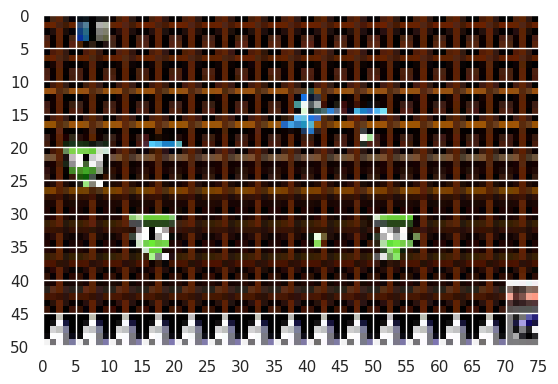



****************************************
Example no: megaman-image-00001253.png
predicted:                    real
---------------        ---------------
---------------        ---------------
---------------        ---------------
####---#------#        ---------------
------------###        ---------------
--SSS------##D#        ---------------
---------#-####        ---------------
---------------        ---------------
---------------        MM-MMM-MM----##
--------#######        -------------##


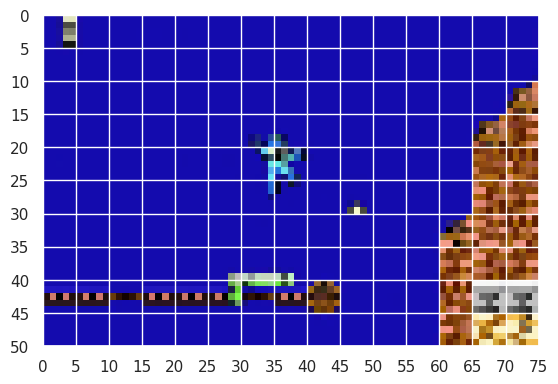



****************************************
Example no: megaman-image-00000344.png
predicted:                    real
---------------        ---------------
------SSS------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ----------#####
---------------        -T#############


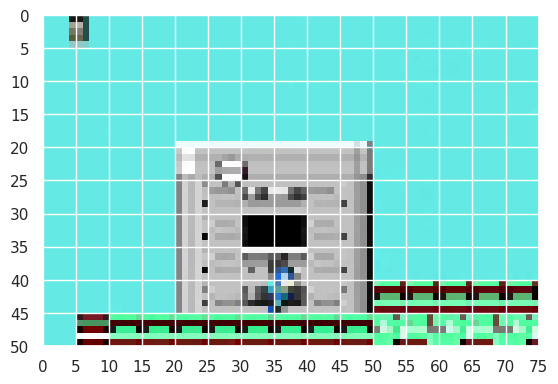



****************************************
Example no: megaman-image-00001254.png
predicted:                    real
---SSSSSSSS---S        ---------------
SSSSSSSSS------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
------SSSSSSSSS        ---------------
-----SSSS-SSS--        ---------------
---------------        ---------------
------S-----S-S        M-MMM-MM----###
-------########        ------------###


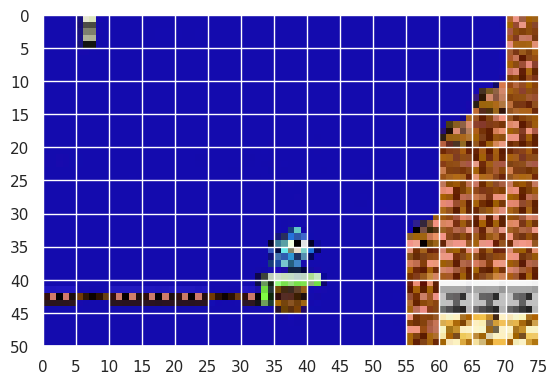



****************************************
Example no: megaman-image-00001751.png
predicted:                    real
-O-SS----SSSSSS        ---------------
SSSSS---------S        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
------SSSSS----        ---------------
-----SSSS---S--        ---------------
S-S---S----#S#-        ---------------
-----SSS---SSSS        ---------------
---------------        HHHHHHHHHHHHHHH


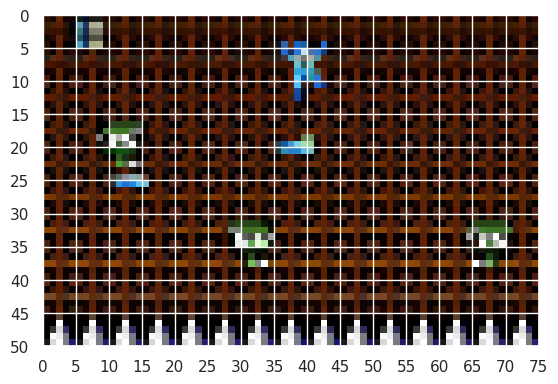



****************************************
Example no: megaman-image-00001749.png
predicted:                    real
---------------        ---------------
---SSSSSSS-SSSS        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------S-----        ---------------
-----SSS-------        ---------------
---------------        ---------------
-----SSSS-SSS--        ---------------
---------------        HHHHHHHHHHHHHHH


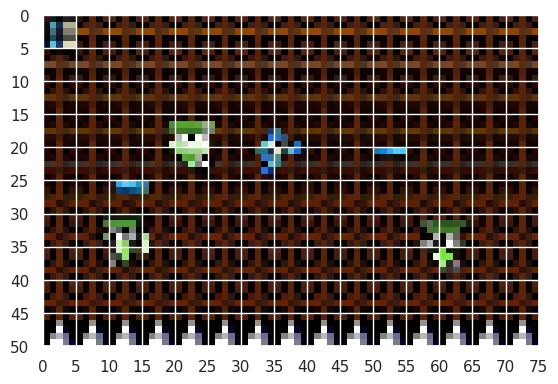



****************************************
Example no: megaman-image-00001251.png
predicted:                    real
---------------        ---------------
-SSSS--------SS        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
------SSSSSSSSS        ---------------
------SS----S--        ---------------
------S----SSS-        ---------------
-----------SSS-        MM-MMM-MMM-MM--
-----------####        ---------------


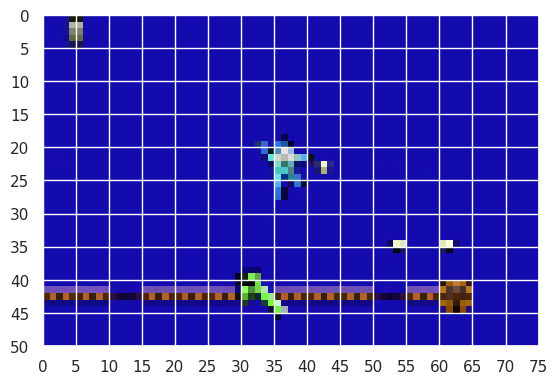



****************************************
Example no: megaman-image-00001252.png
predicted:                    real
---------------        ---------------
--SSSS---------        ---------------
---------------        ---------------
---S-----------        ---------------
----S----------        ---------------
--SSSSS--------        ---------------
----SSSS-------        ---------------
------S--------        ---------------
------SS-------        M-MMM-MMM-MM---
------------###        ---------------


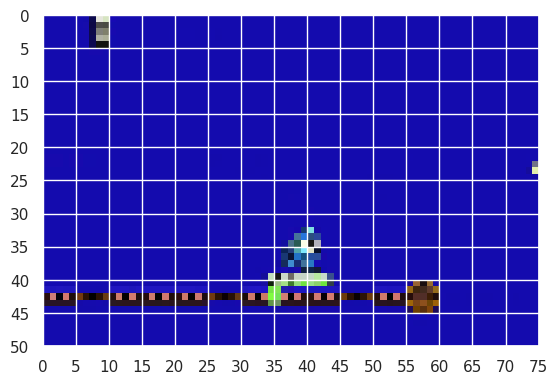



****************************************
Example no: megaman-image-00002155.png
predicted:                    real
---------------        ##T-----------#
--SSSSSS-S-----        ##T-----------#
---------------        ##T-----------#
---------------        ##T-----------#
---------------        ##T-----------#
---------------        ##T-----------#
---------------        ##T-----------#
-----#SS-------        ##T-----------#
---------------        ##T-----------#
---------------        ##T-----------#


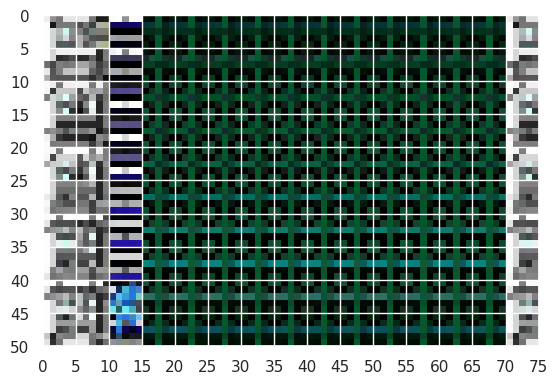



****************************************


In [ ]:
y_test_pred_numerical = (np.argmax(y_test_pred, axis = 3) + 1).astype('int')
names = [
"megaman-image-00000113.png",
"megaman-image-00001045.png",
"megaman-image-00001257.png",
"megaman-image-00000838.png",
"megaman-image-00000389.png",
"megaman-image-00000104.png",
"megaman-image-00001537.png",
"megaman-image-00001527.png",
"megaman-image-00001257.png",
"megaman-image-00001247.png",
"megaman-image-00001255.png",
"megaman-image-00001248.png",
"megaman-image-00001526.png",
"megaman-image-00001236.png",
"megaman-image-00001250.png",
"megaman-image-00001522.png",
"megaman-image-00001237.png",
"megaman-image-00000838.png",
"megaman-image-00001750.png",
"megaman-image-00000345.png",
"megaman-image-00000179.png",
"megaman-image-00001524.png",
"megaman-image-00001528.png",
"megaman-image-00000843.png",
"megaman-image-00001249.png",
"megaman-image-00001748.png",
"megaman-image-00000185.png",
"megaman-image-00001752.png",
"megaman-image-00001253.png",
"megaman-image-00000344.png",
"megaman-image-00001254.png",
"megaman-image-00001751.png",
"megaman-image-00001749.png",
"megaman-image-00001251.png",
"megaman-image-00001252.png",
"megaman-image-00002155.png"
         ]
indices = []
for n in names:
  indices.append(X_test_frame_names.index(n))

for i in indices:
  print("Example no:", X_test_frame_names[i])
  print("predicted:" + " " * 20 + "real")

  decoded_pred = list(np.vectorize(reversed_enc_map.get)(y_test_pred_numerical))[i]
  decoded_test = list(np.vectorize(reversed_enc_map.get)(y_test_numerical))[i]


  for idx, row in enumerate(decoded_pred):
    print("".join(row) + "        " + "".join(decoded_test[idx]))

  fig,ax=plt.subplots()
  #Spacing between each line
  loc_x = plticker.MultipleLocator(base=5)
  loc_y = plticker.MultipleLocator(base=5)
  ax.xaxis.set_major_locator(loc_x)
  ax.yaxis.set_major_locator(loc_y)
  # Add the grid
  plt.imshow(X_test[i], extent=[0, 75, 50, 0])
  plt.show()
  print("\n")
  print("****************************************")

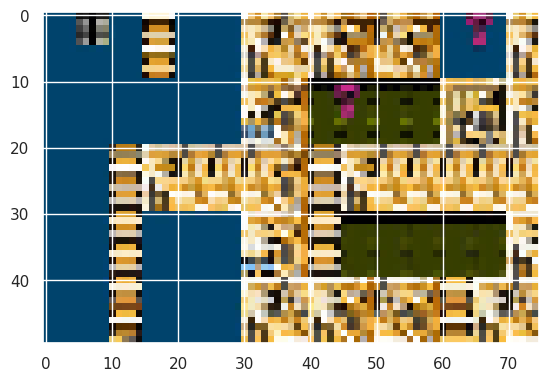

In [ ]:
# plt.imshow(X_test[0], extent=[0, 75, 50, 0])
plt.imshow(X_test[159])

In [ ]:
!pip install geomloss[full]

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.5/92.5 kB 2.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.0/235.0 kB 11.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.3/100.3 kB 10.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cuso

In [ ]:
from geomloss import SamplesLoss

[KeOps] Warning : Cuda libraries were not detected on the system or could not be loaded ; using cpu only mode


In [ ]:
 Loss = SamplesLoss("energy")

In [ ]:
def colors_tags(frame_names):
  colors = []
  tags = []
  for i in range(len(frame_names)):
    if "smb" in frame_names[i]:
      colors.append(0)
      tags.append("Super Mario Bros.")
    elif "kid_icarus" in frame_names[i]:
      colors.append(1)
      tags.append("Kid Icarus")
    elif "zelda" in frame_names[i]:
      colors.append(2)
      tags.append("The Legend of Zelda")
    else:
      colors.append(3)
      tags.append("Megaman")

  print(len(colors), len(tags))
  return colors, tags

In [ ]:
encoded_inputs_train, _, _ = model.encoder(X_train)
encoded_inputs_test, _, _ = model.encoder(X_test)

In [ ]:
colors, tags = colors_tags(X_train_frame_names + X_test_frame_names)

4639 4639


In [ ]:
# perform t-SNE embedding
vis_data = TSNE(learning_rate='auto', init='random', perplexity=100).fit_transform(np.concatenate((encoded_inputs_train, encoded_inputs_test), axis=0))
print(len(vis_data))
# plot the result
vis_x = vis_data[:, 0]
vis_y = vis_data[:, 1]

4639


In [ ]:
import torch
print(len(vis_data[:len(X_train)]), len(vis_data[len(X_train):]))
e_distance = Loss(torch.tensor(vis_data[:len(X_train)]), torch.tensor(vis_data[len(X_train):])).item()
e_distance

2444 2195


7.634090423583984

In [ ]:
print(set(colors))
print(set(tags))

{0, 2, 3}
{'Super Mario Bros.', 'The Legend of Zelda', 'Megaman'}


[]

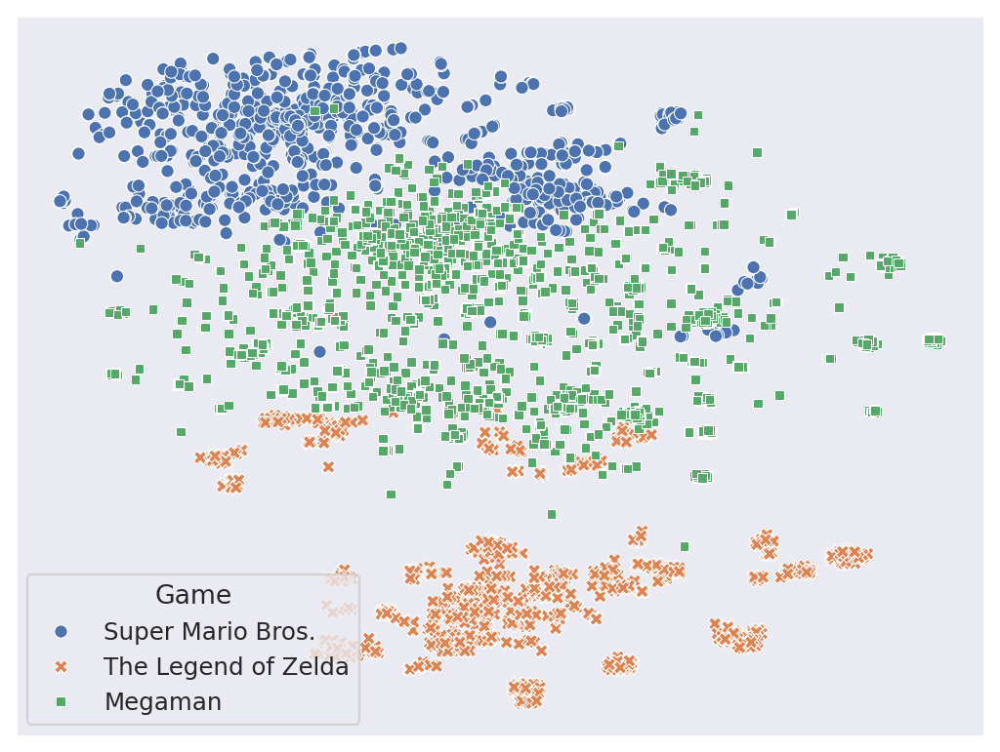

In [ ]:
df = pd.DataFrame(
    {'x': vis_x,
     'y': vis_y,
     'Game' : tags
    })

plt.figure(figsize=(8, 6), dpi=160)
ax = sns.scatterplot(data=df, x="x", y="y", hue="Game", style="Game")
sns.move_legend(ax, "lower left")
ax.set_ylabel(None); ax.set_xlabel(None); ax.set_yticks([]); ax.set_xticks([])

In [ ]:
# # perform t-SNE embedding with perpelxity 100
# # encoded_inputs, _, _ = model.encoder(X_train)
# vis_data = TSNE(learning_rate='auto', init='random', perplexity=100).fit_transform(encoded_inputs)
# print(len(vis_data))
# # plot the result
# vis_x = vis_data[:, 0]
# vis_y = vis_data[:, 1]

# df = pd.DataFrame(
#     {'x': vis_x,
#      'y': vis_y,
#      'index': range(len(vis_x)),
#       'game' : tags
#     })

# plt.figure(figsize=(18, 16), dpi=200)
# fig.update_layout(
#     font_size = 22
# )
# fig = px.scatter(df, x="x", y="y", color='game', hover_data=['index'], color_discrete_sequence=px.colors.qualitative.Bold)
# # plt.colorbar(ticks=range(len(game_keys)))
# # plt.clim(0, len(game_keys)-1)
# fig.show()

In [ ]:
# """ load images """
# natural_images = dict()
# directory = f"./data/natural/"
# X_natural = []
# x_natural_frame_names = []
# print(f"Processing natural data...")
# for file in os.listdir(directory):
#     try:
#       filename = os.fsdecode(file)
#       if filename.endswith(".jpg") or filename.endswith(".jpeg"):
#         img_bgr = cv2.imread(os.path.join(directory, filename))
#         if CHANNELS == 3:
#           img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
#         else:
#           img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

#         img_rgb = cv2.resize(img_rgb, (IMG_WIDTH, IMG_HEIGHT))

#         image = np.asarray(img_rgb)
#         to_save = image.astype(np.uint8)
#         natural_images[f"{TEST_GAME}-{filename}"] = to_save
#         X_natural.append(to_save)
#         x_natural_frame_names.append(filename)
#     except Exception as e:
#       print(filename)
# print(f"Number of images in the dataset: {len(natural_images)}")


In [ ]:
# X_natural = convert_to_float_np_arr(X_natural) / DIVIDE_BY

In [ ]:
# # Test Accuracy
# z, _, _ = model.encoder.predict(X_natural)
# predictions = model.decoder.predict(z)
# y_natural_pred = tf.one_hot(tf.argmax(predictions, axis=3), depth = num_classes)

# y_natural_pred_numerical = (np.argmax(y_natural_pred, axis = 3) + 1).astype('int')

# for i in range(len(X_natural)):
#   print("Example no:", i)
#   print("predicted:")

#   decoded_pred = list(np.vectorize(reversed_enc_map.get)(y_natural_pred_numerical))[i]


#   for idx, row in enumerate(decoded_pred):
#     print("".join(row) + "        ")

#   fig,ax=plt.subplots()
#   #Spacing between each line
#   loc_x = plticker.MultipleLocator(base=5)
#   loc_y = plticker.MultipleLocator(base=5)
#   ax.xaxis.set_major_locator(loc_x)
#   ax.yaxis.set_major_locator(loc_y)
#   # Add the grid
#   plt.imshow(X_natural[i], extent=[0, 75, 50, 0])
#   plt.show()
#   print("\n")
#   print("****************************************")

In [ ]:
# "#" : 1,
# "-" : 2,
# "D" : 3,
# "H" : 4,
# "M" : 5,
# "T" : 6,
# "B" : 7,
# "S" : 8,
# "O" : 9
def transform_numerical(y_numerical):
  y_transformed = np.zeros_like(y_numerical)
  for i, sample in enumerate(y_numerical):
    for j, row in enumerate(sample):
      for k, col in enumerate(row):
        # print(col)
        # print(reversed_enc_map.get(col))
        if reversed_enc_map.get(col) != "-":
          y_transformed[i][j][k] = 1
        else:
          y_transformed[i][j][k] = 2

  return y_transformed

In [ ]:
y_test_pred_numerical_transformed = transform_numerical(y_test_pred_numerical)
y_test_numerical_transformed = transform_numerical(y_test_numerical)

In [ ]:
print(y_test_pred_numerical_transformed.shape, y_test_numerical_transformed.shape)

(2195, 10, 15) (2195, 10, 15)


In [ ]:
def plot_confusion_matrix_v2(y_pred_numerical, y_true_numerical, title):
  letters = ["#", "-"]
  y_pred_string = np.vectorize(reversed_enc_map.get)(y_pred_numerical)
  y_true_string = np.vectorize(reversed_enc_map.get)(y_true_numerical)

  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    cf_matrix = pd.DataFrame(
        confusion_matrix(y_true_string.flatten(),
        y_pred_string.flatten(), labels=letters, normalize='all'),
        index=['{:}'.format(x) for x in letters],
        columns=['{:}'.format(x) for x in letters]
    )

    print(classification_report(
        y_true_string.flatten(),
        y_pred_string.flatten(),
        labels=letters)
    )

    from matplotlib.pyplot import figure
    figure(figsize=(4, 4))
    sns.set(font_scale=1.2)
    ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues', fmt='.2f', xticklabels=True, yticklabels=True, cbar=False)

    ax.set_title(title)
    ax.set_xlabel('\nPredicted Values')
    ax.set_ylabel('Actual Values ')

    ## Display the visualization of the Confusion Matrix.
    plt.show()


 Displaying Game-specific stats for ***MEGAMAN***
              precision    recall  f1-score   support

           #       0.49      0.24      0.32    126372
           -       0.64      0.85      0.73    202878

    accuracy                           0.61    329250
   macro avg       0.57      0.54      0.53    329250
weighted avg       0.58      0.61      0.57    329250



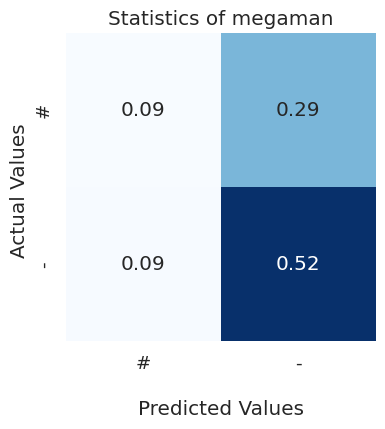

In [ ]:
# Evaluate Testing Performance
test_true = []
test_pred = []
game_part = TEST_GAME
for index, image_name in enumerate(X_test_frame_names):
  test_true.append(y_test_numerical_transformed[index])
  test_pred.append(y_test_pred_numerical_transformed[index])

print(f"\n Displaying Game-specific stats for ***{game_part.upper()}***")
plot_confusion_matrix_v2(
    test_pred, test_true,
    title=f"Statistics of {game_part}"
)

In [ ]:
# from PIL import Image

# def make_square(im, min_size=256, fill_color=(0, 0, 0, 0)):
#     x, y = im.size
#     new_im = Image.new('RGBA', (75, 50), fill_color)
#     new_im.paste(im, (int((75 - x) / 2), int((50 - y) / 2)))
#     return new_im

In [ ]:
# def convert_to_text(img):
#   text_based = np.zeros_like(img, dtype=str)
#   text_based[img == 0] = "-"
#   text_based[img > 0] = "#"
#   ret_val = np.full((10, 15, 1), "-", dtype=str)
#   d = defaultdict(lambda: 0)
#   for i in range(text_based.shape[0]):
#     for j in range(text_based.shape[1]):
#       if text_based[i][j][0] == "#":
#         d[(i // 5, j // 5)] += 1

#   for key in d.keys():
#     if d[key] >= 25/2:
#       ret_val[key[0], key[1]][0] = "#"

#   return ret_val

In [ ]:
# def convert_to_binary(text):
#   ret_val = np.full(text.shape, "-", dtype=str)
#   for i in range(text.shape[0]):
#     for j in range(text.shape[1]):
#       if text[i][j] != "-":
#         ret_val[i][j] = "#"

#   return ret_val

In [ ]:
# !pip install quickdraw

In [ ]:
# from quickdraw import QuickDrawData
# from PIL import Image
# import numpy as np

# qd = QuickDrawData(max_drawings=10000)

In [ ]:
# from PIL import Image, ImageChops, ImageFilter

# def trim(im):
#     bg = Image.new(im.mode, im.size, im.getpixel((0,0)))
#     diff = ImageChops.difference(im, bg)
#     diff = ImageChops.add(diff, diff, 2.0, -100)
#     bbox = diff.getbbox()
#     if bbox:
#         return im.crop(bbox)

In [ ]:
# _train_qd = []
# bg_color=(0, 150, 255)
# for i in range(5000):
#   random_cat = python_random.choice(qd.drawing_names)
#   instance = qd.get_drawing(random_cat).get_image(stroke_color=(255, 255, 255), stroke_width=24, bg_color=bg_color)
#   instance = trim(instance)
#   instance.thumbnail((IMG_WIDTH, IMG_HEIGHT), Image.Resampling.NEAREST)

#   old_image_width, old_image_height = instance.size

#   # create new image of desired size and color (blue) for padding
#   new_image_width = IMG_WIDTH
#   new_image_height = IMG_HEIGHT
#   result = np.full((new_image_height,new_image_width, 3), bg_color)

#   # compute center offset
#   x_center = (new_image_width - old_image_width) // 2
#   y_center = (new_image_height - old_image_height) // 2

#   # copy img image into center of result image
#   result[y_center:y_center+old_image_height,
#         x_center:x_center+old_image_width] = instance

#   # im_arr = np.array(result.astype(dtype = np.uint8))
#   _train_qd.append(result)

# plt.imshow(_train_qd[12])
# X_train_qd = convert_to_float_np_arr(_train_qd) / DIVIDE_BY

In [ ]:
# print(X_train_qd.shape)
# print(np.amax(X_train_qd), np.amin(X_train_qd))
# print(np.amax(X_train), np.amin(X_train))

In [ ]:
# # # Test Accuracy
# z, _, _ = model.encoder.predict(X_train_qd)
# predictions = model.decoder.predict(z)
# y_qd_train_pred = tf.one_hot(tf.argmax(predictions, axis=3), depth = num_classes)
# y_qd_train_pred_numerical = (np.argmax(y_qd_train_pred, axis = 3) + 1).astype('int')

In [ ]:
# def convert_to_01(text):
#   ret_val = np.full(text.shape, 0, dtype=int)
#   for i in range(text.shape[0]):
#     for j in range(text.shape[1]):
#       if text[i][j] != "-":
#         ret_val[i][j] = 1
#   return ret_val

# def convert_to_01_img(img):
#   text_based = np.zeros_like(img, dtype=str)
#   text_based[img == 0] = "-"
#   text_based[img > 0] = "#"
#   ret_val = np.full((10, 15, 1), 0, dtype=int)
#   d = defaultdict(lambda: 0)
#   for i in range(text_based.shape[0]):
#     for j in range(text_based.shape[1]):
#       if text_based[i][j][0] == "#":
#         d[(i // 5, j // 5)] += 1

#   for key in d.keys():
#     if d[key] >= 25/4:
#       ret_val[key[0], key[1]][0] = 1

#   return ret_val

In [ ]:
# from scipy import stats
# from scipy.spatial import distance
# y_true_train_qd = []
# y_pred_train_qd = []

# for i in range(len(X_train_qd)):
#   decoded_pred = convert_to_01(np.vectorize(reversed_enc_map.get)(y_qd_train_pred_numerical[i])).reshape(150)
#   y_pred_train_qd.append(decoded_pred)
#   real_img_txt = convert_to_01_img(X_train_qd[i]).reshape(150)
#   y_true_train_qd.append(real_img_txt)

In [ ]:
# label_font = {'size':'8'}  # Adjust to fit
# ax.set_xlabel('Predicted labels', fontdict=label_font);
# ax.set_ylabel('Observed labels', fontdict=label_font);

# title_font = {'size':'8'}  # Adjust to fit
# ax.set_title('Confusion Matrix', fontdict=title_font);
# cm_df = confusion_matrix(np.array(y_true_train_qd).reshape(len(X_train_qd), 150).ravel(), np.array(y_pred_train_qd).reshape(len(X_train_qd),150).ravel())
# sns.set(font_scale=2.0) # Adjust to fit
# sns.heatmap(cm_df/np.sum(cm_df),annot=True,cmap='Blues', fmt=".3f")

# a1 = tf.identity(
#     y_true_train_qd, name=None
# )

# a2 = tf.identity(
#     y_pred_train_qd, name=None
# )

# a1 = tf.reshape(a1, [a1.shape[0] * a1.shape[1]])
# a2 = tf.reshape(a2, [a2.shape[0] * a2.shape[1]])


# print(a1.shape, a2.shape)
# res = stats.pearsonr(a1, a2)
# print(res)

# # print(precision_score(y_true_train_mnist, y_pred_train_mnist, average='weighted'))
# # print(accuracy_score(y_true_train_mnist, y_pred_train_mnist))
# # print(distance.hamming(y_true_train_mnist, y_pred_train_mnist))


# # import numpy as np

# # # Assuming data1 and data2 are your datasets
# # # Calculate the Pearson correlation coefficient
# # print(y_true_train_mnist[0])
# # correlation_matrix = np.corrcoef(np.array(y_pred_train_mnist).reshape(len(y_pred_train_mnist), 150), np.array(y_pred_train_mnist).reshape(len(y_pred_train_mnist), 150), rowvar=False)

# # # The correlation coefficient is at position (0, 1) in the correlation matrix
# # pearson_correlation = correlation_matrix[0, 1]

# # print("Pearson Correlation Coefficient:", pearson_correlation)

In [ ]:
# for j in range(30):
#   i = python_random.choice(range(len(X_train_qd)))
#   print("Example no:", i)
#   print("predicted:" + " " * 14 +  "Predicted"  + " "* 10 + "        "  +  "Real" + " " * 12)

#   decoded_pred = convert_to_01(list(np.vectorize(reversed_enc_map.get)(y_qd_train_pred_numerical))[i]).astype(str)
#   decoded_pred_2 = convert_to_binary(list(np.vectorize(reversed_enc_map.get)(y_qd_train_pred_numerical))[i])
#   real_img_txt = convert_to_text(X_train_qd[i]).reshape(10, 15).tolist()


#   for idx, row in enumerate(decoded_pred):
#     print("".join(row) + "        " +  "".join(decoded_pred_2[idx]) + "        "  +  "".join(real_img_txt[idx]))

#   fig,ax=plt.subplots()
#   #Spacing between each line
#   loc_x = plticker.MultipleLocator(base=5)
#   loc_y = plticker.MultipleLocator(base=5)
#   ax.xaxis.set_major_locator(loc_x)
#   ax.yaxis.set_major_locator(loc_y)
#   # Add the grid
#   plt.imshow(X_train_qd[i], extent=[0, 75, 50, 0])
#   plt.show()
#   print("\n")
#   print("****************************************")

In [ ]:
# y_true_train_qd = []
# y_pred_train_qd = []

# for i in range(len(X_train_qd)):
#   decoded_pred = convert_to_01(np.vectorize(reversed_enc_map.get)(y_qd_train_pred_numerical[i])).reshape(150).tolist()
#   y_pred_train_qd.append(decoded_pred)
#   real_img_txt = convert_to_01_img(X_train_qd[i]).reshape(150).tolist()
#   y_true_train_qd.append(real_img_txt)

# prcs = []
# for i in range(len(X_train_qd)):
#   prcs.append(precision_score(y_true_train_qd[i], y_pred_train_qd[i]))

# srt_idx = np.argsort(prcs)

# for j in range(15):
#   i = srt_idx[-1 - j]
#   print("Example no:", i)
#   print("predicted:" +  "             " +  "predicted: " + "            "  + "real: ")

#   decoded_pred = convert_to_01(list(np.vectorize(reversed_enc_map.get)(y_qd_train_pred_numerical))[i]).astype(str)
#   decoded_pred_2 = convert_to_binary(list(np.vectorize(reversed_enc_map.get)(y_qd_train_pred_numerical))[i])
#   real_img_txt = convert_to_text(X_train_qd[i]).reshape(10, 15).tolist()


#   for idx, row in enumerate(decoded_pred):
#     print("".join(row) + "        " +  "".join(decoded_pred_2[idx]) + "        "  +  "".join(real_img_txt[idx]))

#   fig,ax=plt.subplots()
#   #Spacing between each line
#   loc_x = plticker.MultipleLocator(base=5)
#   loc_y = plticker.MultipleLocator(base=5)
#   ax.xaxis.set_major_locator(loc_x)
#   ax.yaxis.set_major_locator(loc_y)
#   # Add the grid
#   plt.imshow((X_train_qd[i]), extent=[0, 75, 50, 0])
#   plt.show()
#   print("\n")
#   print("****************************************")



In [ ]:
# (x_train_mnist, y_train_mnist), (x_test_mnist, y_test_mnist) = keras.datasets.mnist.load_data()
# print(x_train_mnist.shape)

# x_train_mnist = np.stack((x_train_mnist,)*3, axis=-1)
# x_test_mnist = np.stack((x_test_mnist,)*3, axis=-1)
# print(x_train_mnist.shape)

# # new_arr_train = np.zeros((x_train_mnist.shape[0], 50, 75, 3), dtype = np.uint8)
# # new_arr_test = np.zeros((x_test_mnist.shape[0], 50, 75, 3), dtype = np.uint8)
# # new_arr_train[:,11:11+28, 24:24+28,:] = x_train_mnist
# # new_arr_test[:,11:28+11,24:24+28,:] = x_test_mnist
# # print(new_arr_train.shape, new_arr_test.shape)
# # x_test_mnist = new_arr_test
# # x_train_mnist = new_arr_train

# x_train_mnist = tf.keras.preprocessing.image.smart_resize(
#     x_train_mnist, (50, 75), interpolation='nearest'
# )
# x_test_mnist =  tf.keras.preprocessing.image.smart_resize(
#     x_test_mnist, (50, 75), interpolation='nearest'
# )

# x_train_mnist = convert_to_float_np_arr(x_train_mnist) / DIVIDE_BY
# x_test_mnist = convert_to_float_np_arr(x_test_mnist) / DIVIDE_BY
# print(x_train_mnist.shape, x_test_mnist.shape)

In [ ]:
# # # Test Accuracy
# z, _, _ = model.encoder.predict(x_train_mnist)
# predictions = model.decoder.predict(z)
# y_mnist_train_pred = tf.one_hot(tf.argmax(predictions, axis=3), depth = num_classes)
# y_mnist_train_pred_numerical = (np.argmax(y_mnist_train_pred, axis = 3) + 1).astype('int')

In [ ]:
# def convert_to_01(text):
#   ret_val = np.full(text.shape, 0, dtype=int)
#   for i in range(text.shape[0]):
#     for j in range(text.shape[1]):
#       if text[i][j] != "-":
#         ret_val[i][j] = 1

#   return ret_val

# def convert_to_01_img(img):
#   text_based = np.zeros_like(img, dtype=str)
#   text_based[img == 0] = "-"
#   text_based[img > 0] = "#"
#   ret_val = np.full((10, 15, 1), 0, dtype=int)
#   d = defaultdict(lambda: 0)
#   for i in range(text_based.shape[0]):
#     for j in range(text_based.shape[1]):
#       if text_based[i][j][0] == "#":
#         d[(i // 5, j // 5)] += 1

#   for key in d.keys():
#     if d[key] >= 25/4:
#       ret_val[key[0], key[1]][0] = 1

#   return ret_val

In [ ]:
# from scipy import stats
# from scipy.spatial import distance
# y_true_train_mnist = []
# y_pred_train_mnist = []

# for i in range(len(x_train_mnist)):
#   decoded_pred = convert_to_01(np.vectorize(reversed_enc_map.get)(y_mnist_train_pred_numerical[i])).reshape(150)
#   y_pred_train_mnist.append(decoded_pred)
#   real_img_txt = convert_to_01_img(x_train_mnist[i]).reshape(150)
#   y_true_train_mnist.append(real_img_txt)

# label_font = {'size':'8'}  # Adjust to fit
# ax.set_xlabel('Predicted labels', fontdict=label_font);
# ax.set_ylabel('Observed labels', fontdict=label_font);

# title_font = {'size':'8'}  # Adjust to fit
# ax.set_title('Confusion Matrix', fontdict=title_font);
# cm_df = confusion_matrix(np.array(y_true_train_mnist).reshape(len(x_train_mnist), 150).ravel(), np.array(y_pred_train_mnist).reshape(len(x_train_mnist),150).ravel())
# sns.set(font_scale=2.0) # Adjust to fit
# sns.heatmap(cm_df/np.sum(cm_df),annot=True,cmap='Blues', fmt=".3f")


# # res = stats.pearsonr(y_true_train_mnist, y_pred_train_mnist)
# # print(res)

# # print(precision_score(y_true_train_mnist, y_pred_train_mnist, average='weighted'))
# # print(accuracy_score(y_true_train_mnist, y_pred_train_mnist))
# # print(distance.hamming(y_true_train_mnist, y_pred_train_mnist))


# # import numpy as np

# # # Assuming data1 and data2 are your datasets
# # # Calculate the Pearson correlation coefficient
# # print(y_true_train_mnist[0])
# # correlation_matrix = np.corrcoef(np.array(y_pred_train_mnist).reshape(len(y_pred_train_mnist), 150), np.array(y_pred_train_mnist).reshape(len(y_pred_train_mnist), 150), rowvar=False)

# # # The correlation coefficient is at position (0, 1) in the correlation matrix
# # pearson_correlation = correlation_matrix[0, 1]

# # print("Pearson Correlation Coefficient:", pearson_correlation)

In [ ]:
# from sklearn import metrics
# metrics.mutual_info_score(y_true_train_mnist, [python_random.choice([0,1]) for _ in range(len(y_true_train_mnist))])

In [ ]:
# print(np.amax(x_train_mnist), np.amin(x_train_mnist))

In [ ]:
# y_true_train_mnist = []
# y_pred_train_mnist = []

# for i in range(len(x_train_mnist)):
#   decoded_pred = convert_to_01(np.vectorize(reversed_enc_map.get)(y_mnist_train_pred_numerical[i])).reshape(150).tolist()
#   y_pred_train_mnist.append(decoded_pred)
#   real_img_txt = convert_to_01_img(x_train_mnist[i]).reshape(150).tolist()
#   y_true_train_mnist.append(real_img_txt)

# prcs = []
# for i in range(len(x_train_mnist)):
#   print()
#   prcs.append(precision_score(y_true_train_mnist[i], y_pred_train_mnist[i]))

# srt_idx = np.argsort(prcs)

# for j in range(15):
#   i = srt_idx[-1 - j]
#   print("Example no:", i)
#   print("predicted:" +  "             " +  "predicted: " + "            "  + "real: ")

#   decoded_pred = convert_to_01(list(np.vectorize(reversed_enc_map.get)(y_mnist_train_pred_numerical))[i]).astype(str)
#   decoded_pred_2 = convert_to_binary(list(np.vectorize(reversed_enc_map.get)(y_mnist_train_pred_numerical))[i])
#   real_img_txt = convert_to_text(x_train_mnist[i]).reshape(10, 15).tolist()


#   for idx, row in enumerate(decoded_pred):
#     print("".join(row) + "        " +  "".join(decoded_pred_2[idx]) + "        "  +  "".join(real_img_txt[idx]))

#   fig,ax=plt.subplots()
#   #Spacing between each line
#   loc_x = plticker.MultipleLocator(base=5)
#   loc_y = plticker.MultipleLocator(base=5)
#   ax.xaxis.set_major_locator(loc_x)
#   ax.yaxis.set_major_locator(loc_y)
#   # Add the grid
#   plt.imshow((x_train_mnist[i]), extent=[0, 75, 50, 0])
#   plt.show()
#   print("\n")
#   print("****************************************")



In [ ]:
# overlap = np.array(y_true_train_mnist, dtype=bool) * np.array(y_pred_train_mnist, dtype=bool) # Logical AND
# union = np.array(y_true_train_mnist) + np.array(y_pred_train_mnist) # Logical OR

# IOU = overlap.sum()/float(union.sum())
# print(IOU)

# from skimage.metrics import structural_similarity
# structural_similarity(np.array(y_pred_train_mnist), np.array(y_true_train_mnist))

In [ ]:
# for j in range(10):
#   i = python_random.choice(range(len(x_train_mnist)))
#   print("Example no:", i)
#   print("predicted:")

#   decoded_pred = convert_to_01(list(np.vectorize(reversed_enc_map.get)(y_mnist_train_pred_numerical))[i]).astype(str)
#   decoded_pred_2 = convert_to_binary(list(np.vectorize(reversed_enc_map.get)(y_mnist_train_pred_numerical))[i])
#   real_img_txt = convert_to_text(x_train_mnist[i]).reshape(10, 15).tolist()


#   for idx, row in enumerate(decoded_pred):
#     print("".join(row) + "        " +  "".join(decoded_pred_2[idx]) + "        "  +  "".join(real_img_txt[idx]))

#   fig,ax=plt.subplots()
#   #Spacing between each line
#   loc_x = plticker.MultipleLocator(base=5)
#   loc_y = plticker.MultipleLocator(base=5)
#   ax.xaxis.set_major_locator(loc_x)
#   ax.yaxis.set_major_locator(loc_y)
#   # Add the grid
#   plt.imshow((x_train_mnist[i]), extent=[0, 75, 50, 0])
#   plt.show()
#   print("\n")
#   print("****************************************")

In [ ]:
# # r1, g1, b1 = 255, 255, 255 # Original value
# # r2, g2, b2 = 245, 161, 66 # Value that we want to replace it with

# # red, green, blue = x_test_mnist[:,:,:,0], x_test_mnist[:,:,:,1], x_test_mnist[:,:,:,2]
# # mask1 = (red == r1) & (green == g1) & (blue == b1)
# # mask2 = (red == r2) & (green == g2) & (blue == b2)
# # x_test_mnist[:,:,:,:3][mask1] = [r2, g2, b2]
# # x_test_mnist[:,:,:,:3][mask2] = [r1, g1, b1]
# x_test_mnist = x_test_mnist.astype('float64')
# for num in range(x_test_mnist.shape[0]):
#   rgb = np.random.randint(3)
#   x_test_mnist[num,:,:,rgb] /= 255.00

In [ ]:
# for num in range(10):
#   plt.subplot(2, 5, num+1)
#   plt.imshow(x_test_mnist[num])
#   plt.axis('off')

In [ ]:
# z, _, _ = model.encoder.predict(x_test_mnist)
# predictions = model.decoder.predict(z)
# y_natural_pred = tf.one_hot(tf.argmax(predictions, axis=3), depth = num_classes)

# y_natural_pred_numerical = (np.argmax(y_natural_pred, axis = 3) + 1).astype('int')

# for j in range(10):
#   i = python_random.choice(range(len(x_test_mnist)))
#   print("Example no:", i)
#   print("predicted:")

#   decoded_pred = convert_to_binary(list(np.vectorize(reversed_enc_map.get)(y_natural_pred_numerical))[i])
#   real_img_txt = convert_to_text(x_test_mnist[i]).reshape(10, 15).tolist()


#   for idx, row in enumerate(decoded_pred):
#     print("".join(row) + "        " + "".join(real_img_txt[idx]))

#   fig,ax=plt.subplots()
#   #Spacing between each line
#   loc_x = plticker.MultipleLocator(base=5)
#   loc_y = plticker.MultipleLocator(base=5)
#   ax.xaxis.set_major_locator(loc_x)
#   ax.yaxis.set_major_locator(loc_y)
#   # Add the grid
#   plt.imshow(x_test_mnist[i], extent=[0, 75, 50, 0])
#   plt.show()
#   print("\n")
#   print("****************************************")

In [ ]:
# game_key = "load_runner"
# data = dict()
# print(f"Loading {game_key}...")
# with open(f"./data/{game_key}/dataset.pickle", "rb") as fh:
#     data = pickle.load(fh)
#     all_datasets[game_key] = data


# """ load images """
# images_loadrunner = {}

# directory = f"./data/{game_key}/cropped"
# print(f"Processing {game_key} data...")
# for file in os.listdir(directory):
#     try:
#       filename = os.fsdecode(file)
#       if filename.endswith(".png"):
#         img_bgr = cv2.imread(os.path.join(directory, filename))
#         if CHANNELS == 3:
#           img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
#         else:
#           img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

#         img_rgb = cv2.resize(img_rgb, (IMG_WIDTH, IMG_HEIGHT))

#         image = np.asarray(img_rgb)
#         to_save = image.astype(np.uint8)
#         images_loadrunner[f"{game_key}-{filename}"] = to_save
#     except Exception as e:
#       print(filename)
# print(f"Number of images in the dataset: {len(images_loadrunner)}")

In [ ]:
# X_lr = []
# y_lr = []
# X_lr_frame_names = []
# game_dataset = all_datasets[game_key]
# num_of_game_frames = len(game_dataset)
# for image_name in sorted(game_dataset.keys()):
#   if image_name in images_loadrunner.keys():
#       X_lr.append(images_loadrunner[image_name])
#       y_lr.append(game_dataset[image_name])
#       X_lr_frame_names.append(image_name)

In [ ]:
# X_lr = convert_to_float_np_arr(X_lr) / DIVIDE_BY
# y_lr_numerical = convert_to_int_np_arr(y_lr)
# y_lr = keras.utils.to_categorical(
#     y_lr_numerical-1, num_classes = num_classes
# )

In [ ]:
# print(np.amax(X_lr), np.amin(X_lr))
# print(np.amax(y_lr_numerical), np.amin(y_lr_numerical))

In [ ]:
# z, _, _ = model.encoder.predict(X_lr)
# predictions = model.decoder.predict(z)
# y_pred_lr = tf.one_hot(tf.argmax(predictions, axis=3), depth = num_classes)

# y_numerical_pred_lr = (np.argmax(y_pred_lr, axis = 3) + 1).astype('int')

# print(np.amax(y_numerical_pred_lr), np.amin(y_numerical_pred_lr))
# print(np.amax(y_lr_numerical), np.amin(y_lr_numerical))

# names = ["load_runner-image-00000378.png",
# "load_runner-image-00000406.png",
# "load_runner-image-00000506.png",
# "load_runner-image-00000541.png",
# "load_runner-image-00000542.png",
# "load_runner-image-00000593.png",
# "load_runner-image-00000389.png",
# "load_runner-image-00000415.png",
# "load_runner-image-00000590.png",
# "load_runner-image-00000486.png",
# "load_runner-image-00000493.png",
# "load_runner-image-00000594.png",
# "load_runner-image-00000242.png",
# "load_runner-image-00000361.png",
# "load_runner-image-00000362.png",
# "load_runner-image-00000320.png",
# "load_runner-image-00000478.png",
# "load_runner-image-00000589.png",
# "load_runner-image-00000485.png",
# "load_runner-image-00000385.png",
# "load_runner-image-00000474.png",
# "load_runner-image-00000477.png",
# "load_runner-image-00000591.png",
# "load_runner-image-00000592.png",
# "load_runner-image-00000094.png",
# "load_runner-image-00000397.png",
# "load_runner-image-00000577.png",
# "load_runner-image-00000586.png",
# "load_runner-image-00000578.png",
# "load_runner-image-00000093.png",]
# indices = []
# for n in names:
#   indices.append(X_lr_frame_names.index(n))

# for i in indices:
#   print("Example no:", X_lr_frame_names[i], "accuracy: ", accuracies[i])
#   print("predicted:" + "             " + "real:")

#   decoded_pred = list(np.vectorize(reversed_enc_map.get)(y_numerical_pred_lr))[i]
#   decoded_lr = list(np.vectorize(reversed_enc_map.get)(y_lr_numerical))[i]

#   for idx, row in enumerate(decoded_pred):
#     print("".join(row) + "        " + "".join(decoded_lr[idx]))


#   fig,ax=plt.subplots()
#   #Spacing between each line
#   loc_x = plticker.MultipleLocator(base=5)
#   loc_y = plticker.MultipleLocator(base=5)
#   ax.xaxis.set_major_locator(loc_x)
#   ax.yaxis.set_major_locator(loc_y)
#   # Add the grid
#   plt.imshow(X_lr[i], extent=[0, 75, 50, 0])
#   plt.show()
#   print("\n")
#   print("****************************************")

In [ ]:
# # Evaluate Testing Performance
# lr_true = []
# lr_pred = []
# game_part = game_key
# for index, image_name in enumerate(images_loadrunner):
#   lr_true.append(y_lr_numerical[index])
#   lr_pred.append(y_pred_lr[index])

# print(f"\n Displaying Game-specific stats for ***{game_part.upper()}***")
# plot_confusion_matrix(
#     lr_pred, lr_true,
#     title=f"Statistics of {game_part}"
# )

In [ ]:
# print(len(X_lr))
# print(len(predictions))
# print(predictions.shape)
# accuracies = {}
# for i in range(len(predictions)):
#   sample = predictions[i]
#   y_lr_pred = tf.one_hot(tf.argmax(sample, axis=2), depth = num_classes)
#   acc = keras.metrics.CategoricalAccuracy()
#   acc.update_state(y_lr[i], y_lr_pred)
#   accuracies[i] = acc.result().numpy()

# with open(f'smbki_accuracies_{game_key}_2_game.pickle', 'wb') as handle:
#     pickle.dump(accuracies, handle, protocol=pickle.HIGHEST_PROTOCOL)
#     print(len(accuracies))

In [ ]:
# f1_weighted_scores = {}
# for i in range(len(predictions)):
#   sample = predictions[i]
#   y_lr_pred = tf.one_hot(tf.argmax(sample, axis=2), depth = num_classes)
#   f1_weighted_scores[i] = f1_score(y_lr[i].flatten(), y_lr_pred.numpy().flatten(), average='weighted')

# with open(f'smbki_f1weighted_{game_key}_2_game.pickle', 'wb') as handle:
#     pickle.dump(f1_weighted_scores, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
# import sklearn

In [ ]:
# kappa_scores = {}
# for i in range(len(predictions)):
#   sample = predictions[i]
#   y_lr_pred = tf.one_hot(tf.argmax(sample, axis=2), depth = num_classes)
#   kappa_scores[i] = sklearn.metrics.cohen_kappa_score(y_lr[i].flatten(), y_lr_pred.numpy().flatten())

# with open(f'smbki_kappa_{game_key}_2_game.pickle', 'wb') as handle:
#     pickle.dump(kappa_scores, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
# # i = min(kappa_scores, key=kappa_scores.get)
# i = 150
# print("Example no:", X_lr_frame_names[i], "kappa score:", kappa_scores[i])
# print("predicted:" + "             " + "real:")

# decoded_pred = list(np.vectorize(reversed_enc_map.get)(y_numerical_pred_lr))[i]
# decoded_lr = list(np.vectorize(reversed_enc_map.get)(y_lr_numerical))[i]

# for idx, row in enumerate(decoded_pred):
#   print("".join(row) + "        " + "".join(decoded_lr[idx]))


# fig,ax=plt.subplots()
# #Spacing between each line
# loc_x = plticker.MultipleLocator(base=5)
# loc_y = plticker.MultipleLocator(base=5)
# ax.xaxis.set_major_locator(loc_x)
# ax.yaxis.set_major_locator(loc_y)
# # Add the grid
# plt.imshow(X_lr[i], extent=[0, 75, 50, 0])
# plt.show()
# print("\n")
# print("****************************************")

**Super Mario Land Test**

In [ ]:
game_key = "smb_land"
data = dict()
print(f"Loading {game_key}...")
with open(f"./data/{game_key}/dataset.pickle", "rb") as fh:
    data = pickle.load(fh)
    all_datasets[game_key] = data


""" load images """
images_smb_land = {}

directory = f"./data/{game_key}/cropped"
print(f"Processing {game_key} data...")
for file in os.listdir(directory):
    try:
      filename = os.fsdecode(file)
      if filename.endswith(".png"):
        img_bgr = cv2.imread(os.path.join(directory, filename))
        if CHANNELS == 3:
          img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
          img_rgb =  cv2.bitwise_not(img_rgb)
        else:
          img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

        img_rgb = cv2.resize(img_rgb, (IMG_WIDTH, IMG_HEIGHT))

        image = np.asarray(img_rgb)
        to_save = image.astype(np.uint8)
        images_smb_land[f"{game_key}-{filename}"] = to_save
    except Exception as e:
      print(filename)
print(f"Number of images in the dataset: {len(images_smb_land)}")

Loading smb_land...
Processing smb_land data...
Number of images in the dataset: 53


In [ ]:
X_smb_land = []
y_smb_land = []
X_smb_land_frame_names = []
game_dataset = all_datasets[game_key]
num_of_game_frames = len(game_dataset)
for image_name in sorted(game_dataset.keys()):
  if image_name in images_smb_land.keys():
      X_smb_land.append(images_smb_land[image_name])
      y_smb_land.append(game_dataset[image_name])
      X_smb_land_frame_names.append(image_name)

print(len(X_smb_land), len(y_smb_land), len(X_smb_land_frame_names))

53 53 53


In [ ]:
X_smb_land = convert_to_float_np_arr(X_smb_land) / DIVIDE_BY
y_smb_land_numerical = convert_to_int_np_arr(y_smb_land)
y_smb_land = keras.utils.to_categorical(
    y_smb_land_numerical-1, num_classes = num_classes
)
print(np.amax(X_smb_land), np.amin(X_smb_land))
print(np.amax(y_smb_land_numerical), np.amin(y_smb_land_numerical))

1.0 0.027450980392156862
9 1


In [ ]:
z, _, _ = model.encoder.predict(X_smb_land)
predictions = model.decoder.predict(z)
y_pred_smb_land = tf.one_hot(tf.argmax(predictions, axis=3), depth = num_classes)


acc = keras.metrics.CategoricalAccuracy()
acc.update_state(y_smb_land, y_pred_smb_land)
print(f" {game_key} acc:", acc.result().numpy())

2/2 [==============================] - 0s 22ms/step
 smb_land acc: 0.7535849


In [ ]:
print(len(X_smb_land))
print(len(predictions))
print(predictions.shape)

accuracies_smbl = []
for i in range(len(predictions)):
  sample = predictions[i]
  y_smbl_pred = tf.one_hot(tf.argmax(sample, axis=2), depth = num_classes)
  acc = keras.metrics.CategoricalAccuracy()
  acc.update_state(y_smb_land[i], y_smbl_pred)
  accuracies_smbl.append(acc.result().numpy())


srt_idx = np.argsort(accuracies_smbl)
print(srt_idx)

53
53
(53, 10, 15, 9)
[50 48 49  5 13 47 42 10  9  0  8 37  1 34 17 18  6 36 35 52 14  2 12  7
 43 44  3  4 15 39 38 28 11 24 51 29 40 21 45 16 32 33 22 23 31 26 46 41
 20 19 30 27 25]


Example no: smb_land-image-00000051.png
predicted:             real:             accuracy: 0.41333333
---------------        ------H--------
---#-------####        -SSSSSSSS------
---------------        -SSSSSSSS------
---------------        ---------------
--#######------        ---------------
---#------##--#        SSSSSSSSSSS----
---------------        SSSSSSSSSSS#---
----------##---        SSSSSSSSSSS#---
-----#---------        SSSSSSSSSSS#---
-----#---------        SSSSSSSSSSS#---


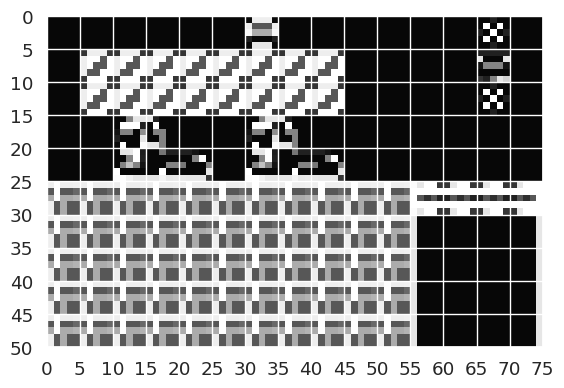



****************************************
Example no: smb_land-image-00000049.png
predicted:             real:             accuracy: 0.52
---------------        -----------#---
-T---------####        SS#-------#-#--
--------------#        ---------#---#-
--------------#        --------#-----#
--------##H----        -------#OOOHOOO
--------####---        ------#OOOOOOOO
---------------        -----#OOOOOOOOO
------####-----        ######OOOOOOOOO
---#-----------        --------S#-----
--#####--------        SSSSSSSSSSSSSSS


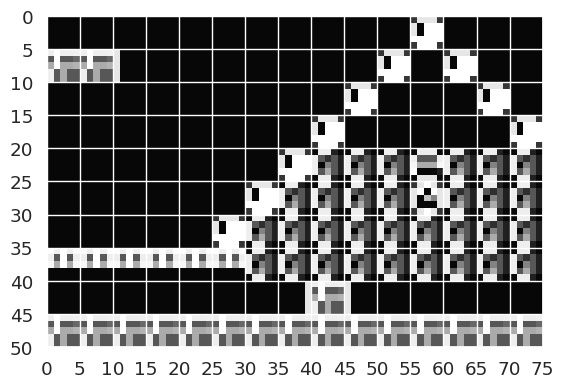



****************************************
Example no: smb_land-image-00000050.png
predicted:             real:             accuracy: 0.56666666
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ------------SS#
---------------        S------SSS#-SS#
---------------        OS-----SSS#-SSS
-O#------------        OO#----SSS#-SSS
####-----------        OOO#SSSSSS#-SSS
--#------------        ----SSSSSS#-SSS
-##------------        SSS-SSSSSS#-SSS


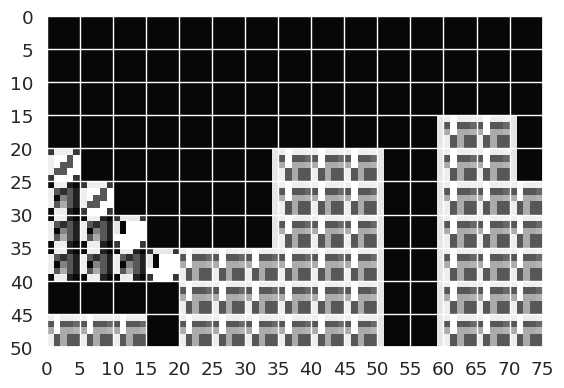



****************************************
Example no: smb_land-image-00000006.png
predicted:             real:             accuracy: 0.56666666
-TT###-----####        ---H--------O--
-----------###-        ---DD-------O--
-#TTTTT----###-        ---DD-------O--
------T--------        ---DD-------O--
---------------        ---DD--B-------
-----TTTT------        #####----------
---------------        -----#---#-----
---------------        -----#-#-#-----
--T------TTTTTT        -----##########
--#####--------        ###############


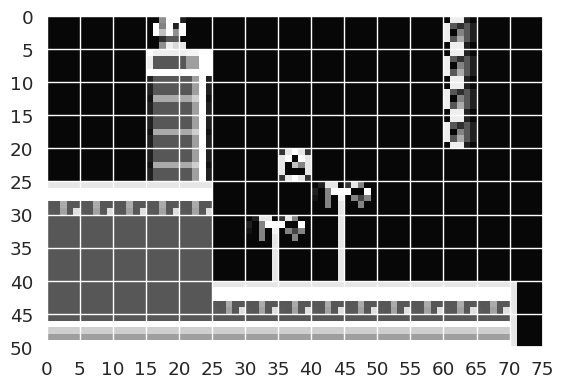



****************************************
Example no: smb_land-image-00000014.png
predicted:             real:             accuracy: 0.58666664
-TTTT#---------        ---------------
---------------        ---DD----------
---------------        ---DD----------
----TTTTT------        ---DD--B-------
---------------        ---DD----------
---------------        #####----------
-TTTT--TTTTTTT-        -----#------DD-
---------------        -----#-----HD-H
----------TT---        -----##########
--#------------        ###############


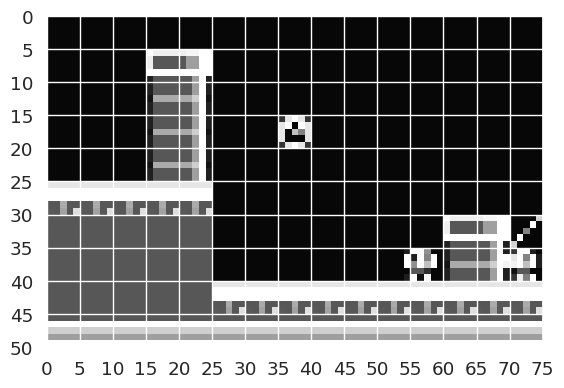



****************************************
Example no: smb_land-image-00000048.png
predicted:             real:             accuracy: 0.5933333
---------------        ---##----------
------------#--        ---BB-------SSS
OO-------------        ---SS-------S--
---------------        ---SS-------S--
---------------        ---SS-O-OHO-S--
---------------        -----########--
---------------        -------O-O-O---
---------------        --#############
---------------        ---------------
##-TTT---------        SSSSSSSSSSSSSSS


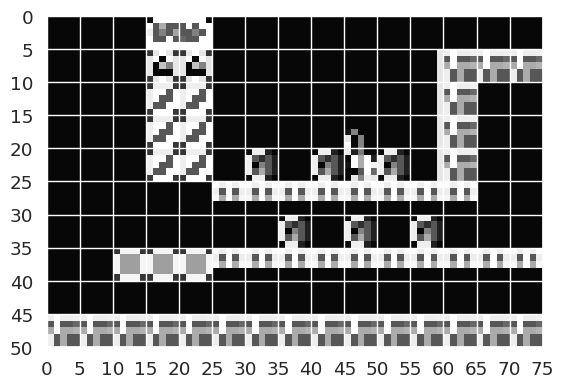



****************************************
Example no: smb_land-image-00000043.png
predicted:             real:             accuracy: 0.62
---------------        ---------------
---------------        ---------------
--------------O        ---------------
---------------        -----DD--------
----------###--        -DD--DD---DD---
---------------        -DD--DD---DD---
--####-#-###---        -DD--DD---DD---
####H----------        -DD--DD---DD---
########------#        #DD--DD--######
---#----------#        #DD--DD---#####


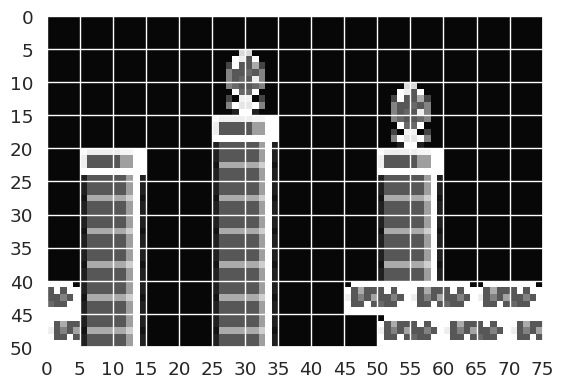



****************************************
Example no: smb_land-image-00000011.png
predicted:             real:             accuracy: 0.6666667
---------------        ---------------
---------------        ---------------
MM--MMMMMMMMMMM        ---------------
---------------        ------------B--
---------------        ---------------
-----MMM--M----        ---------------
---------------        #--------------
-H-------------        #----------H---
TTTTTTTTTTTTT##        ###############
---------------        ###############


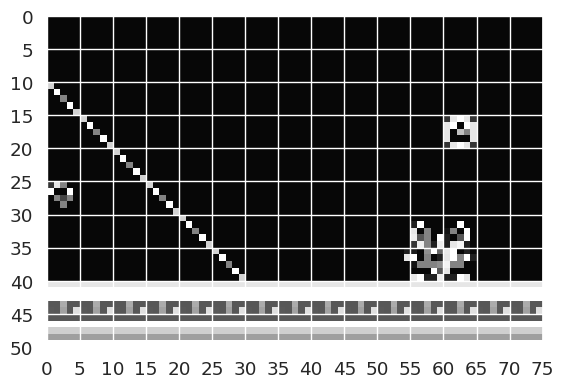



****************************************
Example no: smb_land-image-00000010.png
predicted:             real:             accuracy: 0.67333335
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ----------B----
---------------        ---------------
--------------#        ---------------
-----T#TTTT####        --#---DD-------
--H-HHHHHH-----        #-----DD-----#-
TTTT###TTTTTT--        ####-##########
---------------        ####-##########


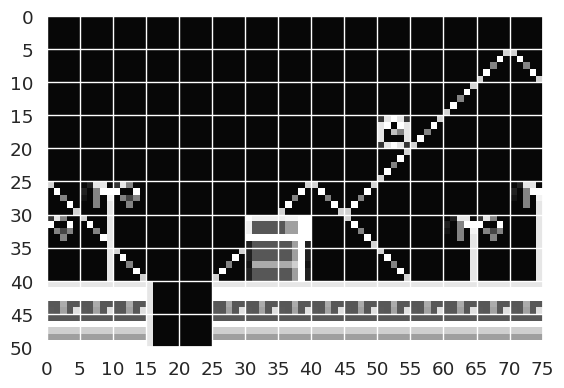



****************************************
Example no: smb_land-image-00000001.png
predicted:             real:             accuracy: 0.6933333
---------------        ---------------
---------------        ---------------
---------------        ---------------
----------T----        -----B---------
---------------        ---------------
---------------        ---------------
TTTTT--TT-TTTT#        -DD-------#----
-H---H---------        -DD-----#-#----
#TTTTTT-TTTTT##        ###############
---------------        ###############


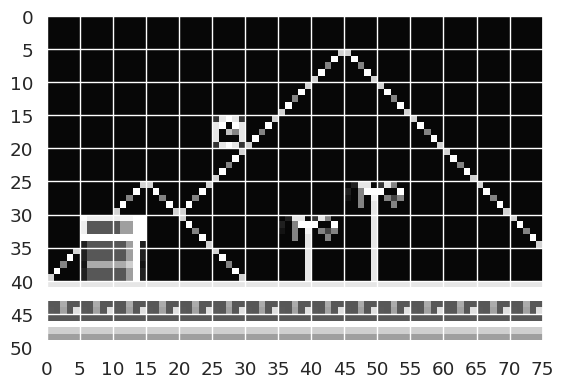



****************************************
Example no: smb_land-image-00000009.png
predicted:             real:             accuracy: 0.6933333
---------------        ------BBBBBB---
---------------        ---------------
---------T----D        ---------------
---------------        ---------------
------###TTT---        ----##########-
---------------        ---------------
----T------TTTT        ---------------
-----H---------        ---------------
TTTTTTTTT----##        ###############
#----#-#-------        ###############


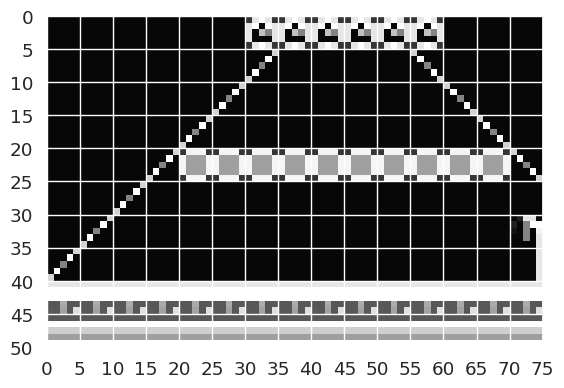



****************************************
Example no: smb_land-image-00000038.png
predicted:             real:             accuracy: 0.70666665
---------------        ------------H--
---------------        ---------------
---------------        ---------------
---------------        DD-------------
---------------        DD---DD--------
---------------        DD---DD--------
####----------D        DD---DD---#####
##------------#        DD---DD---#####
##--------#-###        DD--###########
###############        DD---##########


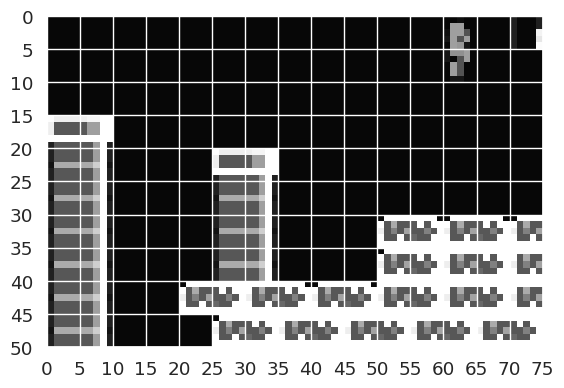



****************************************
Example no: smb_land-image-00000002.png
predicted:             real:             accuracy: 0.7133333
---------------        ---------------
---------------        ---------------
M-----TTTT-----        -------H-------
---------------        -------O-------
---------------        ---------------
---------------        ---------------
-----------TTT#        ------------DD-
---------------        --H---------DD-
-TTTTTTTTTTTT--        ###############
----------T----        ###############


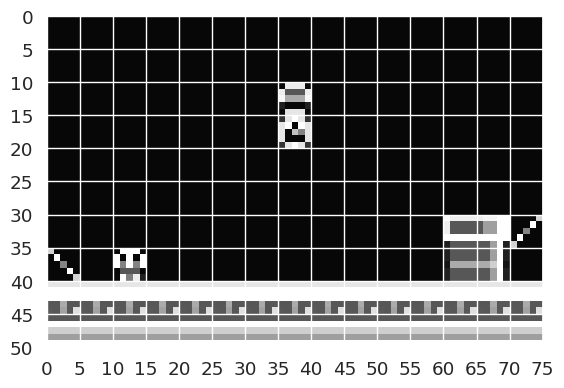



****************************************
Example no: smb_land-image-00000035.png
predicted:             real:             accuracy: 0.72
-M-MMMMMMMMMMMM        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        -----##--------
-------------T#        -----##---#####
--------------#        ---#-##--------
---------------        ---#-##--------
-----##--------        --########-----
---------------        --########-----


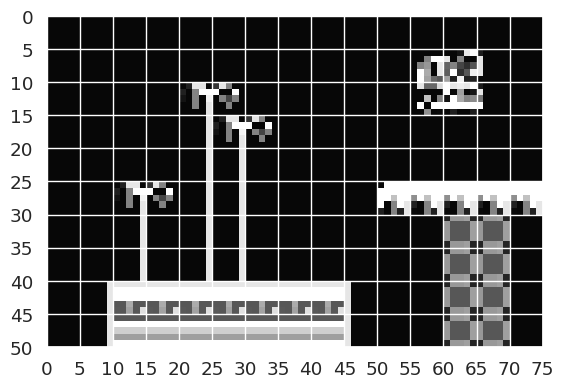



****************************************
Example no: smb_land-image-00000018.png
predicted:             real:             accuracy: 0.72
---------------        ---------------
----#------###-        --SSS---------#
------------###        ---------------
-D-----------##        ------------###
-D-----------##        -----------####
##----------###        ######-----O-O-
#####-----#####        ######---######
####------####-        ######--#######
####---#######-        #######-#######
####------#-##-        #######-#######


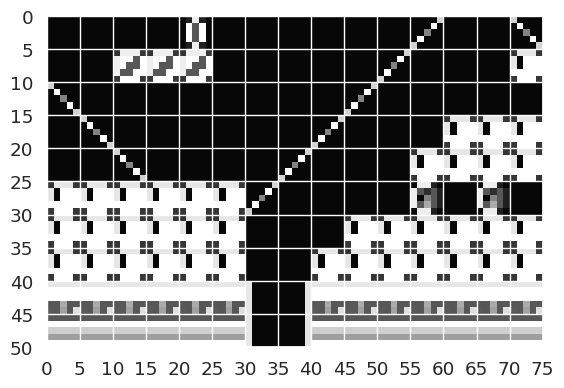



****************************************
Example no: smb_land-image-00000019.png
predicted:             real:             accuracy: 0.72
---MMMMMMMMMMMM        ---------------
---------------        ---------------
---------------        ---------------
-------##T-T---        ---------------
---------------        -----##--------
-----------TTTT        -----##---#####
---------------        ---#-##--------
---------------        ---#-##--------
----#####------        --########-----
---------------        --########-----


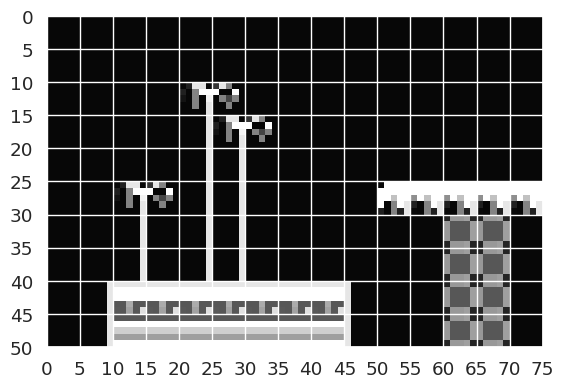



****************************************
Example no: smb_land-image-00000007.png
predicted:             real:             accuracy: 0.7266667
---------------        -----O---------
---------------        ---------------
---------------        ---------------
---------------        ---------------
-----###-------        ----SSS--------
---------------        ---------------
----------TT###        -----------DD--
---------------        -----------DD--
TTTTTTTTTTTTTTT        -##############
---------------        -##############


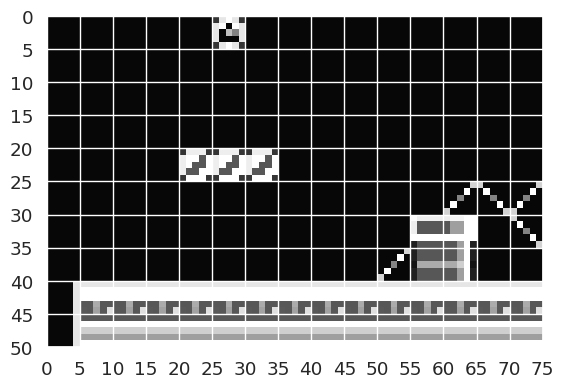



****************************************
Example no: smb_land-image-00000037.png
predicted:             real:             accuracy: 0.7266667
---------------        ---##----------
---------------        ---##----------
---------------        ---##----------
---------------        ---------------
---------------        -----------DD--
S-S------------        ------DD---DD--
-------#######-        ------DD---DD--
-------######--        ------DD---DD--
-------######--        ###########DD--
#########-#----        ###########DD--


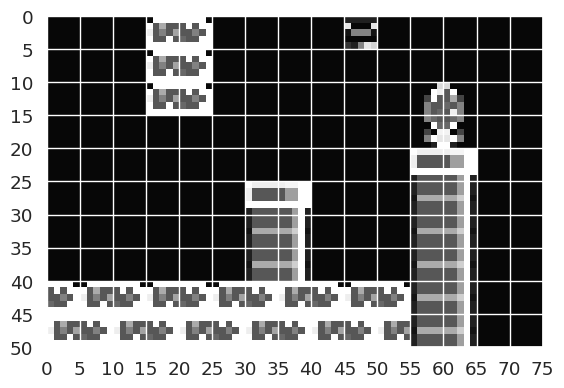



****************************************
Example no: smb_land-image-00000036.png
predicted:             real:             accuracy: 0.73333335
---------------        ##---H--------H
---------------        ##-------------
---------------        ##-------------
---------------        ##-#-----------
####-------#--#        ##-----BSBSB---
---------------        ---------------
---------------        -------------##
-----------####        -------------##
----####---#--#        ###############
------######--#        ###############


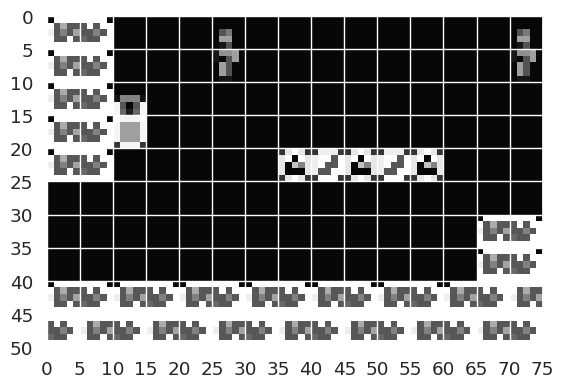



****************************************
Example no: smb_land-image-00000053.png
predicted:             real:             accuracy: 0.73333335
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        -----SS--------
#####----------        SSSSSSS--------
---------------        SSSSSSS-------#
---------------        SSSSSSS--SSSS--
--------####---        SSSSSSS--SSSS--


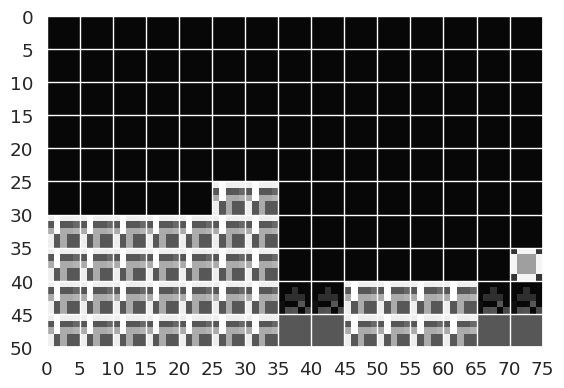



****************************************
Example no: smb_land-image-00000015.png
predicted:             real:             accuracy: 0.73333335
---------------        ----B----------
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
------#----D---        -#--##---------
-------TTTTDD--        -#--##-----DD--
----HH#----D---        -#--##-----DD--
TTTTTTTT-T#TTTT        ###############
##-#####-------        ###############


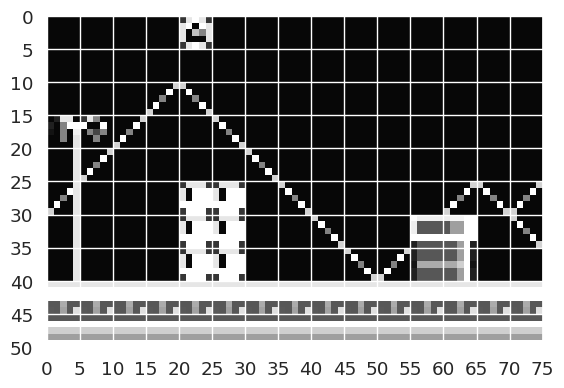



****************************************
Example no: smb_land-image-00000003.png
predicted:             real:             accuracy: 0.73333335
---------------        ----B----------
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
------#----D---        -#--##---------
-------TTTTDD--        -#--##-----DD--
----HH#----D---        -#--##-----DD--
TTTTTTTT-T#TTTT        ###############
##-#####-------        ###############


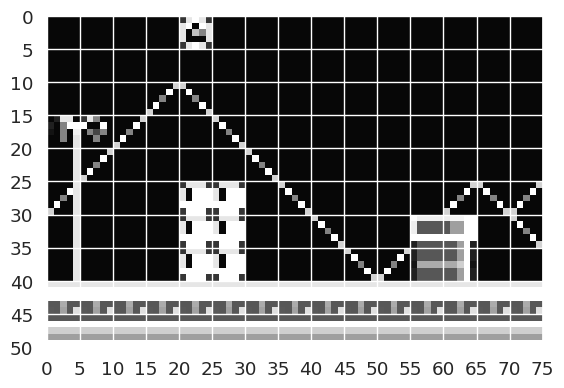



****************************************
Example no: smb_land-image-00000013.png
predicted:             real:             accuracy: 0.74
---------------        ---------------
-------#######-        -------BSBSB---
---------------        ---------------
---------------        ---------------
---------------        ---H-----------
------#--------        -##############
---------------        -#-------------
------#--------        -#-------------
------------#--        #--------------
---------##----        ###############


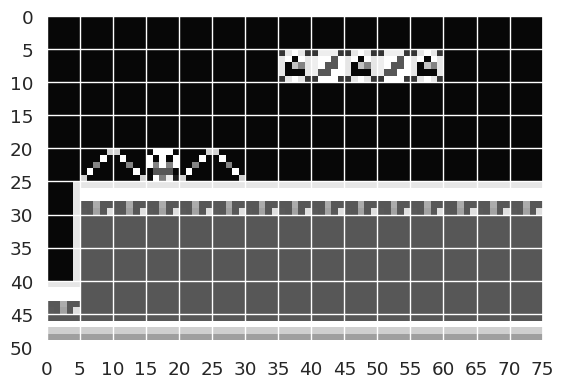



****************************************
Example no: smb_land-image-00000008.png
predicted:             real:             accuracy: 0.74
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        B--------------
---------------        ---------------
---------------        ---------------
--TTTTTTT------        -----#---------
---------------        ---#-#-H-------
TTTTTTTTTTTTT##        ###############
---------------        ###############


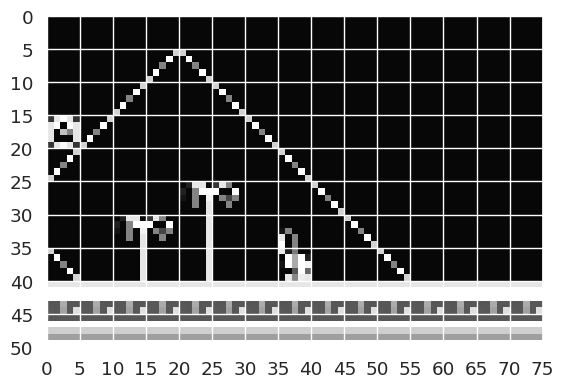



****************************************
Example no: smb_land-image-00000044.png
predicted:             real:             accuracy: 0.74
---------------        ##---H--------H
---------------        ##-------------
---------------        ##-------------
---------------        ##-------------
####-------#--#        ##-----BSBSB---
---------------        ---------------
---------------        -------------##
-----------####        -------------##
----####---#--#        ###############
------######--#        ###############


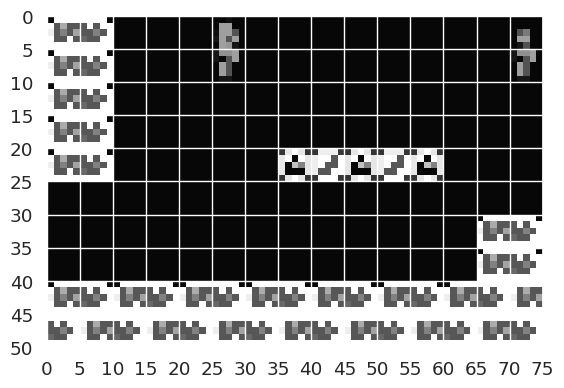



****************************************
Example no: smb_land-image-00000045.png
predicted:             real:             accuracy: 0.74
----######-----        ---####---H----
---------------        ---####--------
---------------        ---####--------
---##----------        -----##--------
---####--------        -----##-----BSB
---------------        ---------------
---------####-#        ---------------
---------------        ---------------
--D----######--        ###############
-########--####        ###############


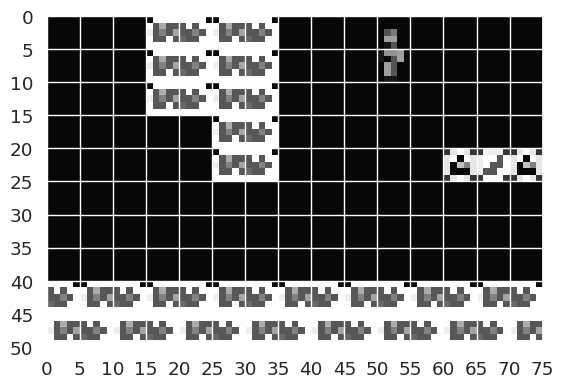



****************************************
Example no: smb_land-image-00000004.png
predicted:             real:             accuracy: 0.74666667
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        B--------------
---------------        ---------------
-------MM-M----        ---------------
--TTT----------        -----#---------
---------------        ---#-#---------
TTTTTTTTTTTTT##        ###############
---------------        ###############


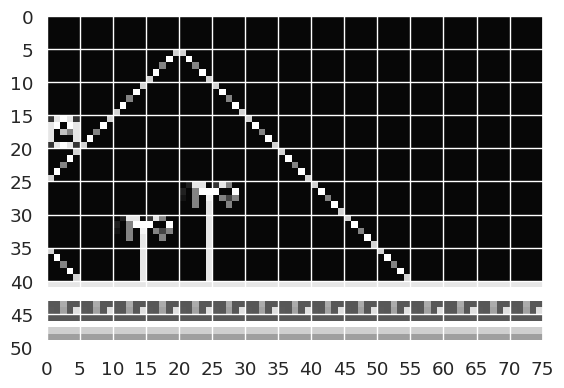



****************************************
Example no: smb_land-image-00000005.png
predicted:             real:             accuracy: 0.74666667
---------------        ---------------
-------#######-        -------BSBSB---
---------------        ---------------
---------------        ---------------
---------------        ---H-----------
------#--------        -##############
---------------        -#-------------
---------------        -#-------------
-----------##--        #--------------
---------###---        ###############


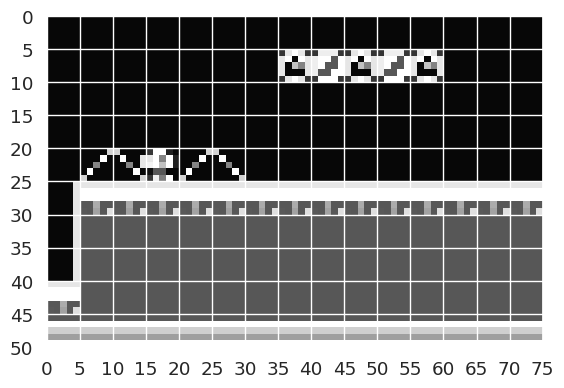



****************************************
Example no: smb_land-image-00000016.png
predicted:             real:             accuracy: 0.75333333
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        B--------------
---------------        ---------------
-------MM-M----        ---------------
---------------        -----#---------
---------H-----        ---#-#H--------
TTTTTTTTTTTTT##        ###############
---------------        ###############


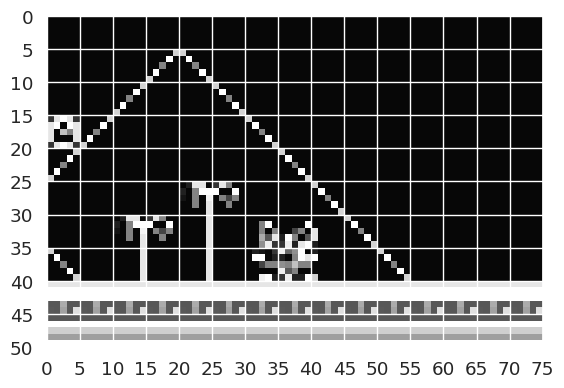



****************************************
Example no: smb_land-image-00000040.png
predicted:             real:             accuracy: 0.7733333
---------------        --H------------
---------------        ---------------
--O--O------O--        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
------OOO-#----        ############DD#
--##--#######--        ############DD#
--##--####-----        ###############
###############        ###############


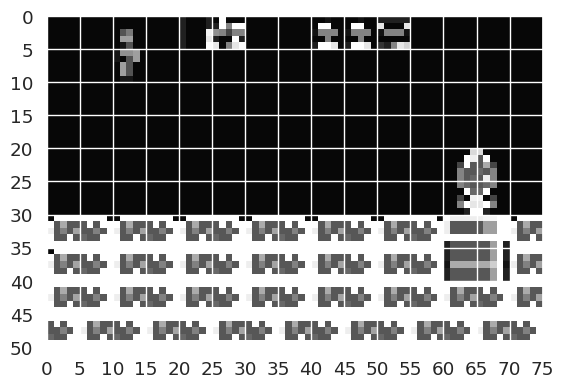



****************************************
Example no: smb_land-image-00000039.png
predicted:             real:             accuracy: 0.7733333
---------------        ----------H----
---------------        ---------------
---O-O---------        ---------------
---------------        ---------------
---------------        --------------#
---------------        ---------------
----------####-        #######DD####DD
-#############-        #######DD####DD
--##--##-------        ###############
########--#####        ###############


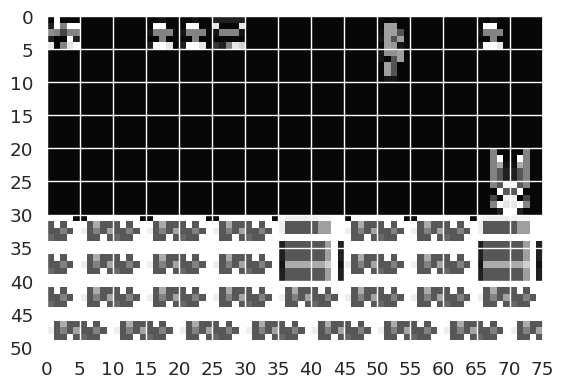



****************************************
Example no: smb_land-image-00000029.png
predicted:             real:             accuracy: 0.78
---------------        -------H-------
#TTTTTT#------#        ##########-----
---------------        ---------------
#--------------        ---------------
#---TTTT-------        ---------------
--------TTT----        ---------------
##-------------        ---------#-----
##-------------        ---------#-----
##----------###        ---------#--###
##----------###        ---------------


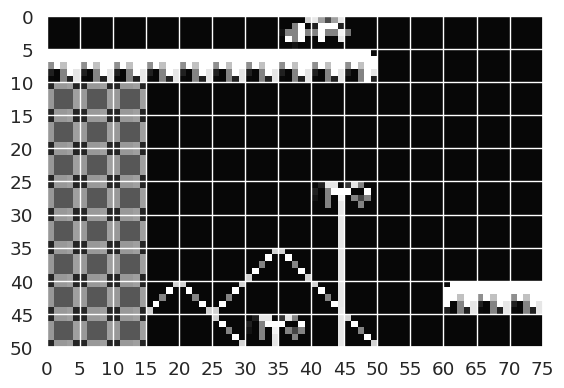



****************************************
Example no: smb_land-image-00000012.png
predicted:             real:             accuracy: 0.8
---------------        ---------O-----
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------H-----
---------------        ------#--##----
---------------        --DD--#--##----
---------------        --DD--#--##----
TTTTTT#####-###        ###############
----#######----        ###############


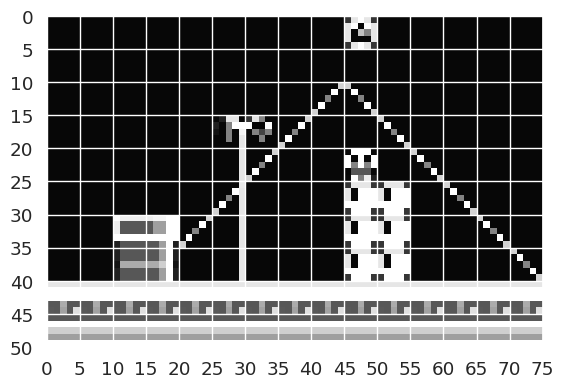



****************************************
Example no: smb_land-image-00000025.png
predicted:             real:             accuracy: 0.8066667
---------------        ------H--------
##---------####        #########-###--
---------------        ---------------
---------------        ---------------
--TT-----------        ##-------------
---------------        -----#-#-B-----
---------------        -------#-------
---------------        ---------------
----###------#-        -----#####-----
-----#####-----        ---------------


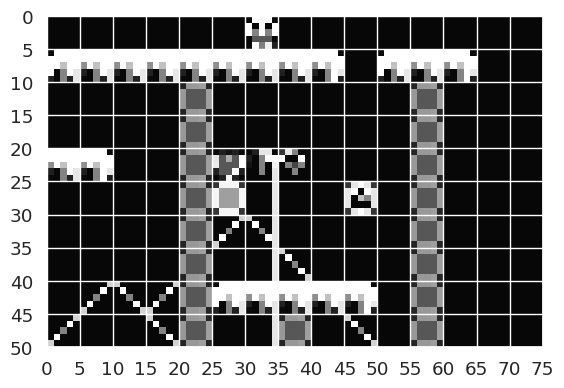



****************************************
Example no: smb_land-image-00000052.png
predicted:             real:             accuracy: 0.8066667
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------H-----
---------------        SS-------------
---------------        SS---------H---
------------###        SS-------######
---------------        SS--SSSS-------
-----########-#        SS--SSSS-------


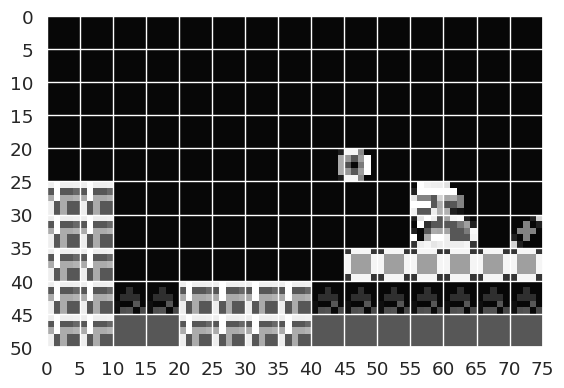



****************************************
Example no: smb_land-image-00000030.png
predicted:             real:             accuracy: 0.8066667
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        -------------##
-------------##        ------------###
------------###        -----------####
#---------#DD##        ----------#####
#---------#DD--        ---------######
##------###DD--        ####----#######
########--####-        -------########


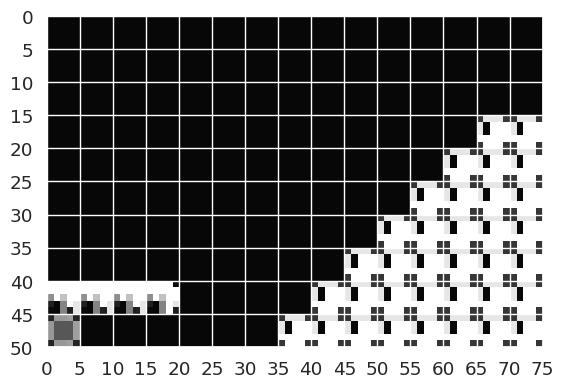



****************************************
Example no: smb_land-image-00000041.png
predicted:             real:             accuracy: 0.81333333
---------------        H--------------
---------------        ---------------
-----O-#O------        ------#--------
---------------        ---------------
---------------        -----DD--------
-###-----------        -----DD--------
#####---------#        ###DDDD--------
##-------------        ###DDDD--------
#####--###-----        #############--
############--#        ############---


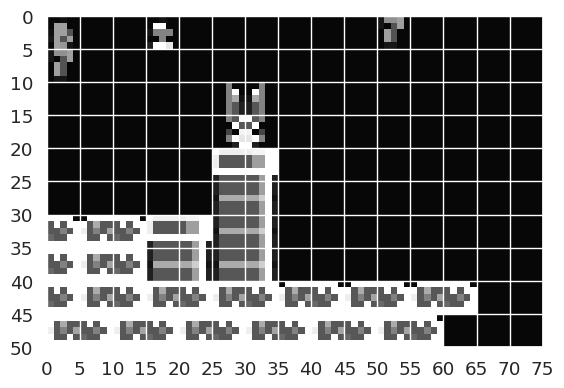



****************************************
Example no: smb_land-image-00000022.png
predicted:             real:             accuracy: 0.82
---------------        ---------------
######T#-TT####        ###############
---------------        ---------------
---------------        ---------------
----------##---        ---------------
-----------##--        ---------------
----#####------        --------------#
---#####-------        --------------#
----#----------        --------------#
---####--------        #--------------


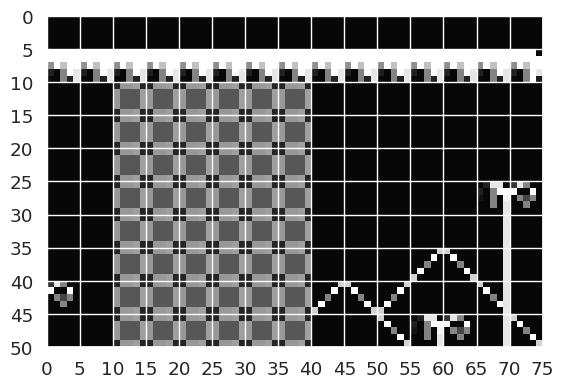



****************************************
Example no: smb_land-image-00000046.png
predicted:             real:             accuracy: 0.8466667
-------##------        ----H---##-----
--------##-----        --------##-----
---------#-----        --------##-----
---------------        -#-------------
--##-----------        SB-------------
---##----------        ---H-----------
--####---------        -H-##----------
---####--#-----        ---##----------
---########----        ##########----#
-##########----        ###########----


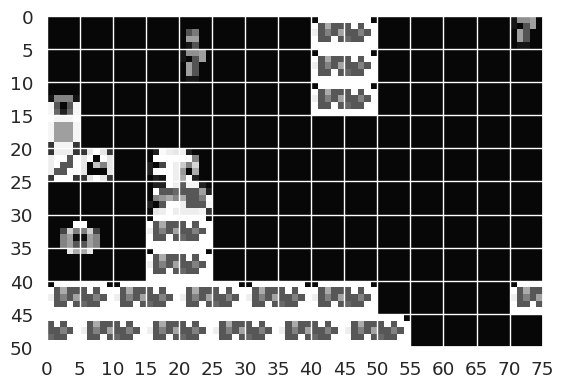



****************************************
Example no: smb_land-image-00000017.png
predicted:             real:             accuracy: 0.8466667
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
-----------##--        ---------------
--------#####--        -#--------#####
-----H----#####        ---H------#####
---############        ########--#####
----------##-##        ########--#####


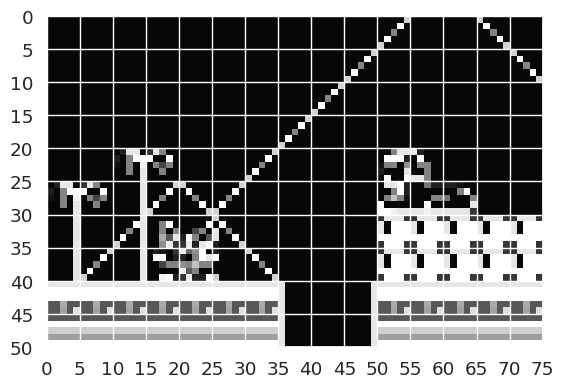



****************************************
Example no: smb_land-image-00000033.png
predicted:             real:             accuracy: 0.8466667
---------------        ---------------
#TTTT------####        #########-###--
---------------        ---------------
---------------        ---------------
-TTT-----------        ##-------------
---------------        -------#-B-----
---------------        -------#-------
---------------        ---------------
----##TTT------        -----#####-----
---------------        ---------------


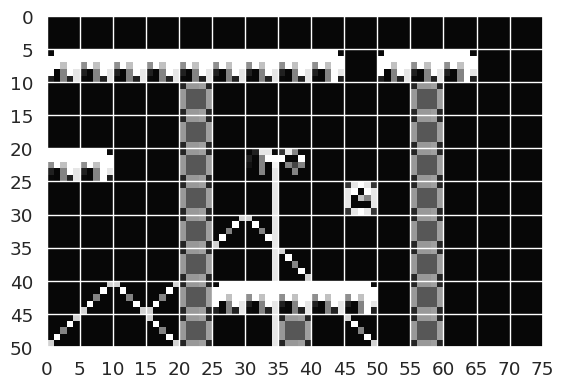



****************************************
Example no: smb_land-image-00000034.png
predicted:             real:             accuracy: 0.85333335
---------------        ---------------
---------------        ---------------
---MMMMMMTMM-MM        -------SSS--###
---------------        ---------------
---------------        ---------------
-------MT------        ---------------
---------------        ---------------
---------------        -#-------------
-----M--MM---M-        -#-------------
---------------        -#-#-----------


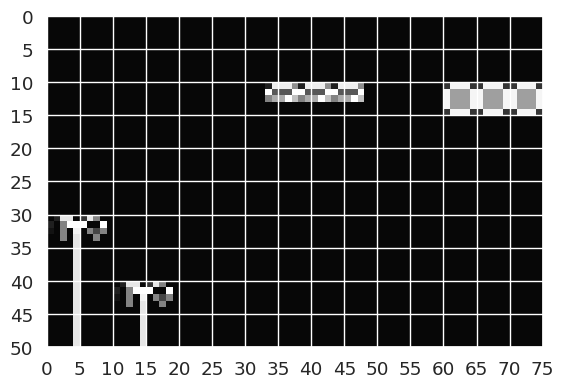



****************************************
Example no: smb_land-image-00000023.png
predicted:             real:             accuracy: 0.85333335
--------------H        ---------------
-#-####-------#        ###------------
---------------        -------------H-
---------TTTTT#        ----------#####
---------------        ------H--------
---------------        ---#######-----
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------


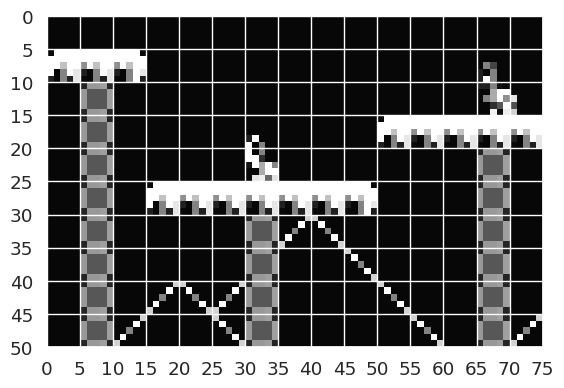



****************************************
Example no: smb_land-image-00000024.png
predicted:             real:             accuracy: 0.85333335
---------------        ---------------
-TTTTTT--------        --###---O------
---------------        ---------------
##-------------        ##------O------
---------------        ------------###
----TTTTT------        ---------------
---------------        ---------------
---------------        ---------------
--------TTTTTT-        --------#####--
---------------        ---------------


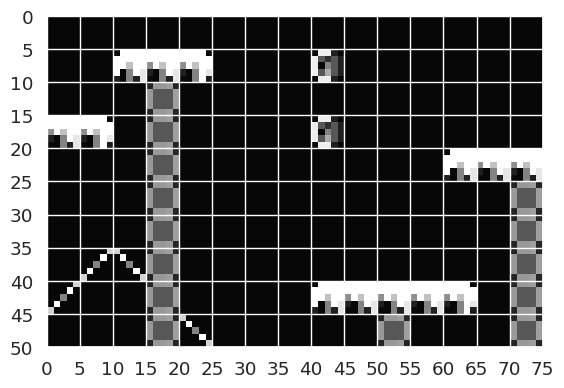



****************************************
Example no: smb_land-image-00000032.png
predicted:             real:             accuracy: 0.85333335
---------------        ---------------
---------------        --------O------
---------------        ---------------
---------------        --------O-----H
---------------        ------------###
------TTT------        ---------------
---------------        ---------------
---------------        ---------------
----MM-MMTTTTT#        --------#####--
---------------        --SSS----------


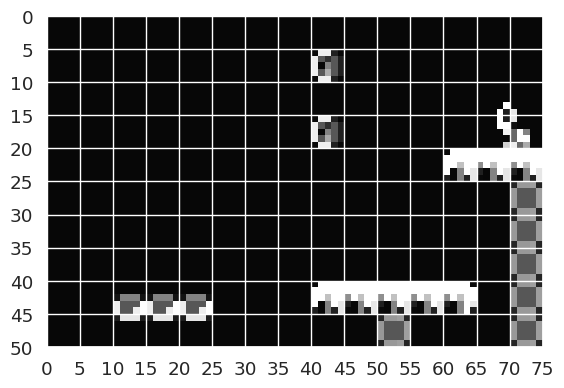



****************************************
Example no: smb_land-image-00000027.png
predicted:             real:             accuracy: 0.86
---------------        ---------------
-#T######T-####        ###############
---------------        ---------------
---------------        ---------------
---------------        ---------------
--------#------        ---------------
----------#----        ---------------
------#####----        ---------------
------#####----        ---------------
------####-----        -----#---------


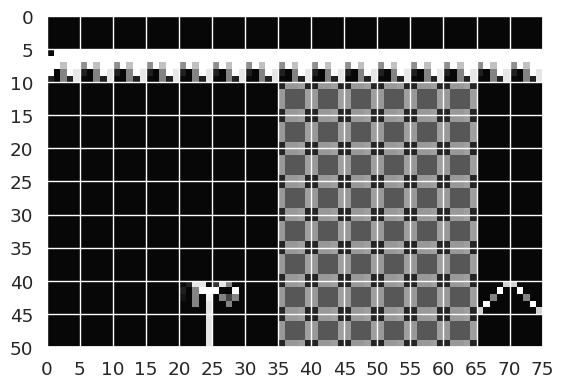



****************************************
Example no: smb_land-image-00000047.png
predicted:             real:             accuracy: 0.8666667
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        --------#------
---------------        -------###-----
--------####---        ------#####----
-----#######---        -----#######---
-----#######---        ----#########--
---######-#----        ###############
########--#####        ##############S


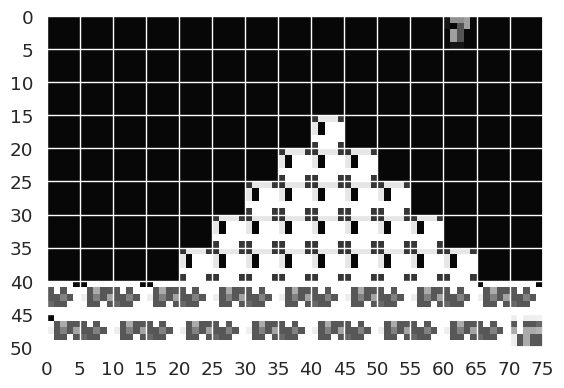



****************************************
Example no: smb_land-image-00000042.png
predicted:             real:             accuracy: 0.8666667
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        -----------DD--
---------------        -----------DD--
---------------        -----------DD--
---------------        --#############
--#############        ---############


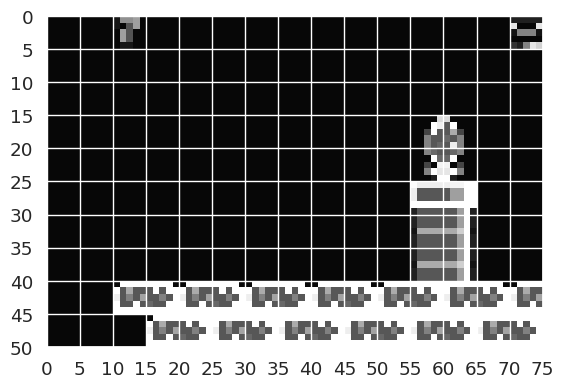



****************************************
Example no: smb_land-image-00000021.png
predicted:             real:             accuracy: 0.87333333
----------#----        -------H----H--
-----TT--T####-        -------########
---------------        ---------------
TTTTTTTT-------        #######--------
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
------##-------        ---------------


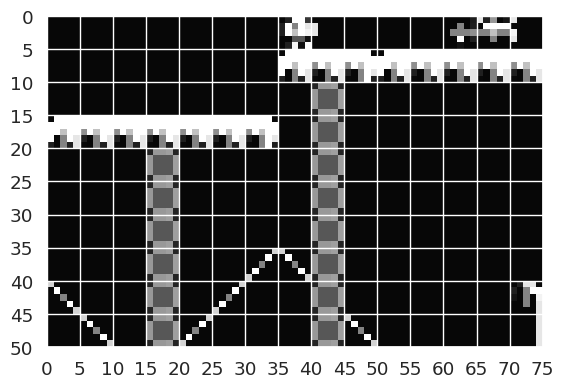



****************************************
Example no: smb_land-image-00000020.png
predicted:             real:             accuracy: 0.88
---------------        ---------------
TTTTTTTT-------        ########-------
---------------        ---------------
---------T-----        ---------------
---------------        ---------------
---------TTTTTT        #-------#######
---------------        ---------------
---------------        ---------------
---------------        ---------------
-----#---------        ---------------


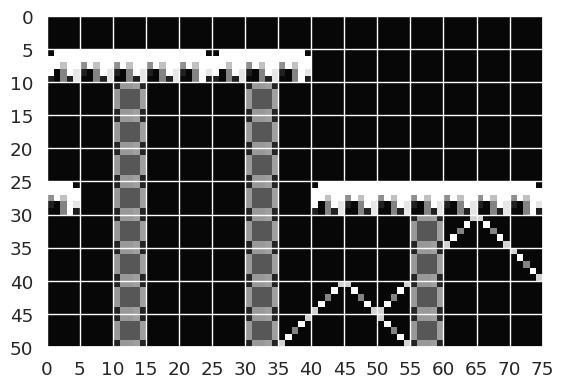



****************************************
Example no: smb_land-image-00000031.png
predicted:             real:             accuracy: 0.88
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        #--------------
---------------        ##-------------
-##------------        ###------------
####-------####        ###------------
###------------        ###-#--SSS-----
-##------------        ###-##---------
########-------        ###-###--------


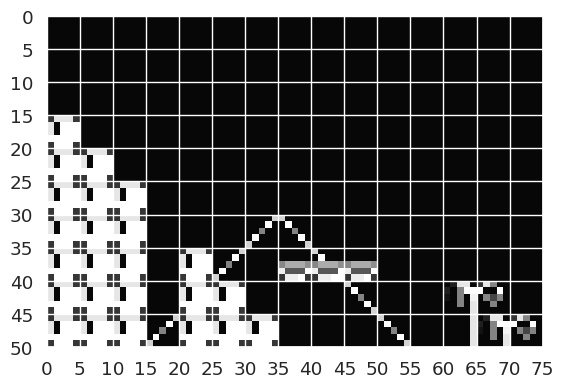



****************************************
Example no: smb_land-image-00000028.png
predicted:             real:             accuracy: 0.9
---------------        ---------------
#TTTT####T#####        ###############
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ---------------
---------------        ----#----------
-------------##        ----#----------
------------#-#        ----#----------
-----------#--#        ----------#----


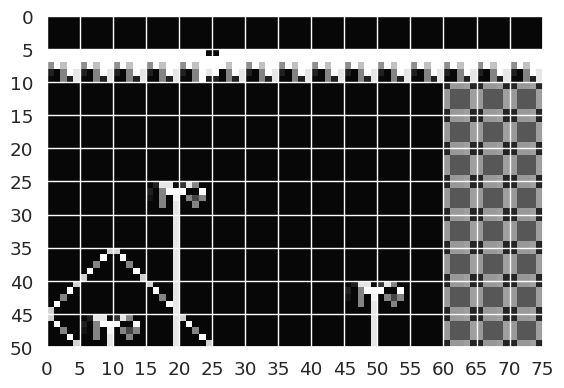



****************************************
Example no: smb_land-image-00000026.png
predicted:             real:             accuracy: 0.91333336
---------------        ---------------
---------------        ---------------
---------------        ------------###
---------------        ---------------
---------------        SSS------------
---------------        ---------------
---------------        ---------------
---------------        -#-------------
---------------        -#----SSS------
---------------        -#-#-----------


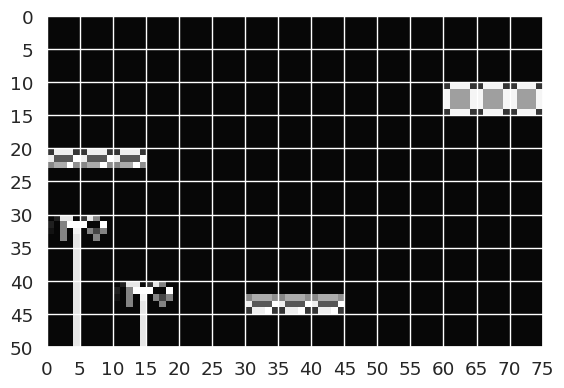



****************************************


In [ ]:
y_numerical_pred_smb_land = (np.argmax(y_pred_smb_land, axis = 3) + 1).astype('int')
for i in srt_idx:
  print("Example no:", X_smb_land_frame_names[i])
  print("predicted:" + "             " + "real:" + "             " + "accuracy:", accuracies_smbl[i])

  decoded_pred = list(np.vectorize(reversed_enc_map.get)(y_numerical_pred_smb_land))[i]
  decoded_smb_land = list(np.vectorize(reversed_enc_map.get)(y_smb_land_numerical))[i]

  for idx, row in enumerate(decoded_pred):
    print("".join(row) + "        " + "".join(decoded_smb_land[idx]))


  fig,ax=plt.subplots()
  #Spacing between each line
  loc_x = plticker.MultipleLocator(base=5)
  loc_y = plticker.MultipleLocator(base=5)
  ax.xaxis.set_major_locator(loc_x)
  ax.yaxis.set_major_locator(loc_y)
  # Add the grid
  plt.imshow(X_smb_land[i], extent=[0, 75, 50, 0])
  plt.show()
  print("\n")
  print("****************************************")


 Displaying Back/For stats for ***SMB_LAND***
              precision    recall  f1-score   support

           #       0.67      0.42      0.52      2020
           -       0.82      0.93      0.87      5930

    accuracy                           0.80      7950
   macro avg       0.75      0.67      0.69      7950
weighted avg       0.78      0.80      0.78      7950



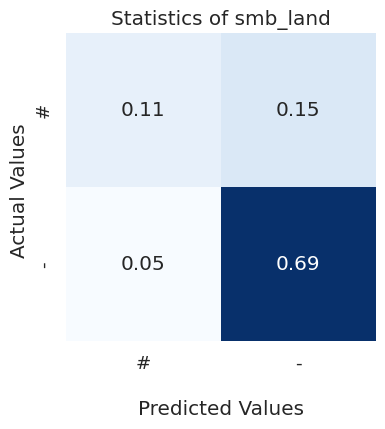

In [ ]:
y_smb_land_pred_numerical_transformed = transform_numerical(y_numerical_pred_smb_land)
y_smb_land_numerical_transformed = transform_numerical(y_smb_land_numerical)

# Evaluate Testing Performance
smbl_true = []
smbl_pred = []
game_part = game_key
for index, image_name in enumerate(X_smb_land_frame_names):
  smbl_true.append(y_smb_land_numerical_transformed[index])
  smbl_pred.append(y_smb_land_pred_numerical_transformed[index])

print(f"\n Displaying Back/For stats for ***{game_part.upper()}***")
plot_confusion_matrix_v2(
    smbl_pred, smbl_true,
    title=f"Statistics of {game_part}"
)


 Displaying Game-specific stats for ***SMB_LAND***
              precision    recall  f1-score   support

           #       0.59      0.32      0.42      1486
           -       0.82      0.93      0.87      5930
           B       0.00      0.00      0.00        35
           D       0.32      0.04      0.07       151
           H       0.00      0.00      0.00        36
           M       0.00      0.00      0.00         0
           O       0.07      0.02      0.03        57
           S       0.00      0.00      0.00       255
           T       0.00      0.00      0.00         0

    accuracy                           0.75      7950
   macro avg       0.20      0.15      0.15      7950
weighted avg       0.73      0.75      0.73      7950



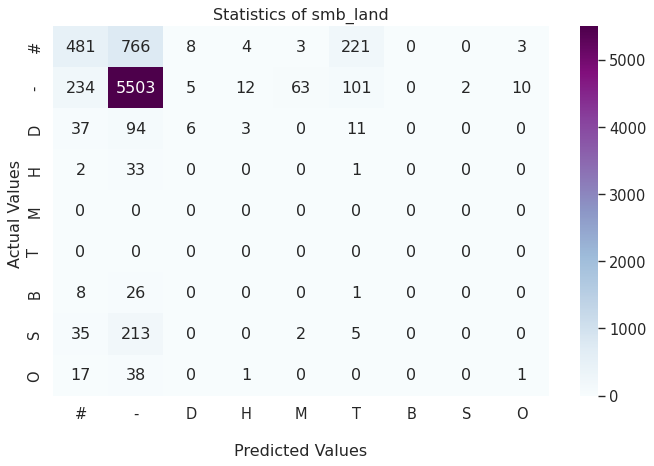

In [ ]:
# Evaluate Testing Performance
smbl_true = []
smbl_pred = []
game_part = game_key
for index, image_name in enumerate(X_smb_land_frame_names):
  smbl_true.append(y_smb_land_numerical[index])
  smbl_pred.append(y_pred_smb_land[index])

print(f"\n Displaying Game-specific stats for ***{game_part.upper()}***")
plot_confusion_matrix(
    smbl_pred, smbl_true,
    title=f"Statistics of {game_part}"
)

In [ ]:
# !pip install textdistance

In [ ]:
# from textdistance import levenshtein
# import statistics
# a1 = list(np.vectorize(reversed_enc_map.get)(y_smb_land_pred_numerical_transformed))
# a2 = list(np.vectorize(reversed_enc_map.get)(y_smb_land_numerical_transformed))
# print(statistics.mean([levenshtein.distance(a1[i].flatten().tolist(),  a2[i].flatten().tolist()) for i in range((len(a1)))]))

In [ ]:
# game_key = "castlevania"



# """ load images """
# images_castle = {}

# directory = f"./data/{game_key}/cropped"
# print(f"Processing {game_key} data...")
# for file in os.listdir(directory):
#     try:
#       filename = os.fsdecode(file)
#       if filename.endswith(".png"):
#         img_bgr = cv2.imread(os.path.join(directory, filename))
#         if CHANNELS == 3:
#           img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
#         else:
#           img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

#         img_rgb = cv2.resize(img_rgb, (IMG_WIDTH, IMG_HEIGHT))

#         image = np.asarray(img_rgb)
#         to_save = image.astype(np.uint8)
#         images_castle[f"{game_key}-{filename}"] = to_save
#     except Exception as e:
#       print(filename)
# print(f"Number of images in the dataset: {len(images_castle)}")

In [ ]:
# X_castle = convert_to_float_np_arr(list(images_castle.values())) / DIVIDE_BY

# print(np.amax(X_castle), np.amin(X_castle))

In [ ]:
# z, _, _ = model.encoder.predict(X_castle)
# predictions = model.decoder.predict(z)
# y_pred_castle = tf.one_hot(tf.argmax(predictions, axis=3), depth = num_classes)

In [ ]:
# y_numerical_pred_castle = (np.argmax(y_pred_castle, axis = 3) + 1).astype('int')


# for i in range(len(X_castle)):
#   print("Example no:", i)
#   print("predicted:" + "             ")

#   decoded_pred = list(np.vectorize(reversed_enc_map.get)(y_numerical_pred_castle))[i]

#   for idx, row in enumerate(decoded_pred):
#     print("".join(row))


#   fig,ax=plt.subplots()
#   #Spacing between each line
#   loc_x = plticker.MultipleLocator(base=5)
#   loc_y = plticker.MultipleLocator(base=5)
#   ax.xaxis.set_major_locator(loc_x)
#   ax.yaxis.set_major_locator(loc_y)
#   # Add the grid
#   plt.imshow(X_castle[i], extent=[0, 75, 50, 0])
#   plt.show()
#   print("\n")
#   print("****************************************")